# VK - Outlier Analysis

### Start by loading our data and perform some inital inspections! This is basically what the first week or two looked like, getting familiar with this massive dataset and figuring out how to contribute to this project!

In [7]:
import pandas as pd
import numpy as np
from scipy.stats import f_oneway
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore

data = pd.read_csv('Mega_merged_all_real_values.csv')
outliers = pd.read_csv('outliers.csv')

data['Scope_3_emissions_amount'] = pd.to_numeric(data['Scope_3_emissions_amount'], errors='coerce')
data = data.dropna(subset=['Scope_3_emissions_amount', 'account_name'])

/var/folders/h7/9xqmfqgd45b8j4np0nndf6gw0000gn/T/ipykernel_5713/549349338.py:8: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('Mega_merged_all_real_values.csv')


In [8]:
data.head()

,account_id,account_name,incorporated_country,ticker,Evaluation_status,Scope_3_emissions_type,Scope_3_emissions_amount,Symbol_1,Year,Market_Cap,...,grossProfit_USD,netIncome_USD,cashAndCashEquivalents_USD,shortTermInvestments_USD,longTermInvestments_USD,totalAssets_USD,totalLiabilities_USD,totalInvestments_USD,totalDebt_USD,totalEquity_USD
0,44,3i Group,United Kingdom,III LN,"Relevant, calculated",Waste generated in operations,12.34,III.L,2013,3.654278e+09,...,938530000.0,656590000.0,816610000.0,0.0,4.460240e+09,5.572760e+09,1.371600e+09,4.460240e+09,1.078230e+09,4.201160e+09
1,44,3i Group,United Kingdom,III LN,"Relevant, calculated",Business travel,56.78,III.L,2013,3.654278e+09,...,938530000.0,656590000.0,816610000.0,0.0,4.460240e+09,5.572760e+09,1.371600e+09,4.460240e+09,1.078230e+09,4.201160e+09
2,53,Abertis Infraestructuras,Spain,ABE SM,"Relevant, calculated",Purchased goods and services,53635.12,ABE.MC,2013,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,53,Abertis Infraestructuras,Spain,ABE SM,"Relevant, calculated",Waste generated in operations,2518.18,ABE.MC,2013,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,53,Abertis Infraestructuras,Spain,ABE SM,"Relevant, calculated",Business travel,913.42,ABE.MC,2013,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
pd.set_option('display.max_columns', None)
data.head

<bound method NDFrame.head of         account_id              account_name incorporated_country  ticker  \
0               44                  3i Group       United Kingdom  III LN   
1               44                  3i Group       United Kingdom  III LN   
2               53  Abertis Infraestructuras                Spain  ABE SM   
3               53  Abertis Infraestructuras                Spain  ABE SM   
4               53  Abertis Infraestructuras                Spain  ABE SM   
...            ...                       ...                  ...     ...   
181151     1003410          Telenco Networks               France     NaN   
181152     1003410          Telenco Networks               France     NaN   
181153     1003410          Telenco Networks               France     NaN   
181154     1003410          Telenco Networks               France     NaN   
181155     1003410          Telenco Networks               France     NaN   

           Evaluation_status                 

In [10]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181156 entries, 0 to 181155
Data columns (total 42 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   account_id                    181156 non-null  int64  
 1   account_name                  181156 non-null  object 
 2   incorporated_country          181156 non-null  object 
 3   ticker                        117989 non-null  object 
 4   Evaluation_status             180307 non-null  object 
 5   Scope_3_emissions_type        181156 non-null  object 
 6   Scope_3_emissions_amount      181156 non-null  float64
 7   Symbol_1                      181156 non-null  object 
 8   Year                          181156 non-null  int64  
 9   Market_Cap                    115901 non-null  float64
 10  Employee_Count                23397 non-null   float64
 11  ebitda                        118470 non-null  float64
 12  Revenue                       118470 non-nul

## By the way, we are only looking at the scope 3 emissions!

In [11]:
data['Scope_3_emissions_type'].unique()

array(['Waste generated in operations', 'Business travel',
       'Purchased goods and services', 'Employee commuting',
       'Capital goods',
       'Fuel-and-energy-related activities (not included in Scope 1 or 2)',
       'Upstream transportation and distribution',
       'Upstream leased assets', 'Investments',
       'Downstream transportation and distribution',
       'Processing of sold products', 'Use of sold products',
       'End of life treatment of sold products',
       'Downstream leased assets', 'Franchises', 'Other (upstream)',
       'Other (downstream)'], dtype=object)

In [12]:
# Print the number of unique account names and unique countries
unique_account_names = data['account_name'].unique()
unique_countries = data['incorporated_country'].unique()

print(f"Unique account names: {len(unique_account_names)}")
print(f"Unique countries: {len(unique_countries)}")

Unique account names: 9343
Unique countries: 113


In [13]:
data.isnull().sum()

account_id                           0
account_name                         0
incorporated_country                 0
ticker                           63167
Evaluation_status                  849
Scope_3_emissions_type               0
Scope_3_emissions_amount             0
Symbol_1                             0
Year                                 0
Market_Cap                       65255
Employee_Count                  157759
ebitda                           62686
Revenue                          62686
grossProfit                      62686
netIncome                        62686
reportedCurrency                 26544
cashAndCashEquivalents           62721
shortTermInvestments             62721
longTermInvestments              62721
totalAssets                      62721
totalLiabilities                 62721
totalInvestments                 62721
totalDebt                        62721
totalEquity                      62721
Primary activity                  7930
Primary sector           

### Some further inspection..

In [14]:
import plotly.express as px

# Group by 'Year' and 'Scope_3_emissions_type' and calculate the mean for 'Scope_3_emissions_amount'
avg_emissions_by_year = data.groupby(['Year', 'Scope_3_emissions_type'])['Scope_3_emissions_amount'].mean().reset_index()

# Create a line chart using Plotly
fig = px.line(avg_emissions_by_year, 
              x='Year', 
              y='Scope_3_emissions_amount', 
              color='Scope_3_emissions_type',
              labels={'Scope_3_emissions_amount': 'Average Scope 3 Emissions Amount', 'Year': 'Year', 'Scope_3_emissions_type': 'Emissions Type'},
              title='Average Scope 3 Emissions Amount by Year and Emissions Type')

# Customize the layout
fig.update_layout(
    xaxis_title='Year',
    yaxis_title='Average Scope 3 Emissions Amount',
    margin=dict(t=40, l=0, r=0, b=0)
)

# Show the plot
fig.show()

In [15]:
# Count unique emission types
emission_types_counts = data["Scope_3_emissions_type"].value_counts()
print("\nEmission Types Distribution:")
print(emission_types_counts)


Emission Types Distribution:
Scope_3_emissions_type
Business travel                                                      24136
Purchased goods and services                                         18852
Waste generated in operations                                        18306
Employee commuting                                                   17646
Fuel-and-energy-related activities (not included in Scope 1 or 2)    17315
Upstream transportation and distribution                             14966
Capital goods                                                        11337
Downstream transportation and distribution                           11253
Use of sold products                                                  8943
End of life treatment of sold products                                8265
Upstream leased assets                                                5903
Downstream leased assets                                              5438
Investments                                    

In [16]:
# Check which emission types have the most outliers
outliers_by_type = outliers["Scope_3_emissions_type"].value_counts()
print("\nOutliers by Emission Type:")
print(outliers_by_type)


Outliers by Emission Type:
Scope_3_emissions_type
Purchased goods and services                                         110
Waste generated in operations                                        109
Upstream transportation and distribution                             101
Business travel                                                       98
Fuel-and-energy-related activities (not included in Scope 1 or 2)     72
Employee commuting                                                    61
Capital goods                                                         56
Downstream transportation and distribution                            47
End of life treatment of sold products                                37
Use of sold products                                                  29
Downstream leased assets                                              16
Investments                                                           16
Processing of sold products                                           11


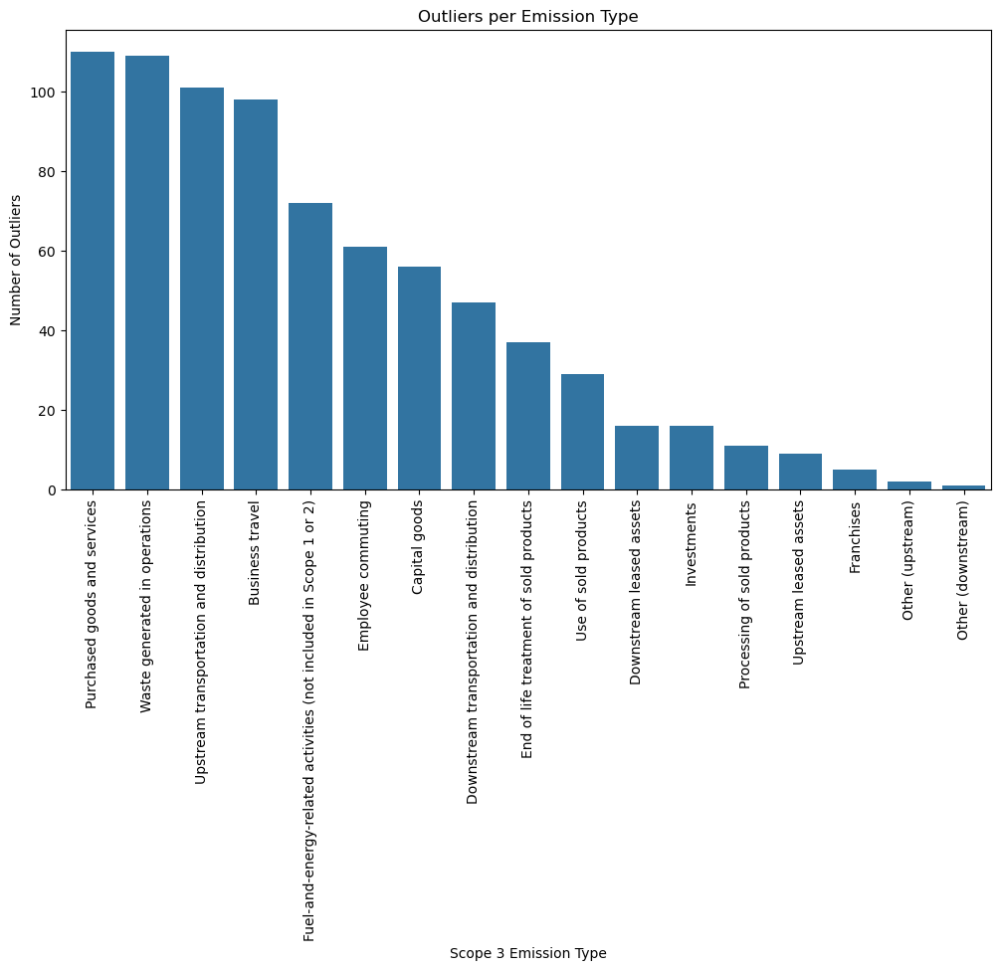

In [17]:
# Visualizing outlier counts per emission type
plt.figure(figsize=(12, 6))
sns.barplot(x=outliers_by_type.index, y=outliers_by_type.values)
plt.xticks(rotation=90)
plt.xlabel("Scope 3 Emission Type")
plt.ylabel("Number of Outliers")
plt.title("Outliers per Emission Type")
plt.show()

### After discussing with Kellen, now I will shift more focus on looking for emission outliers by the Primary Activites!

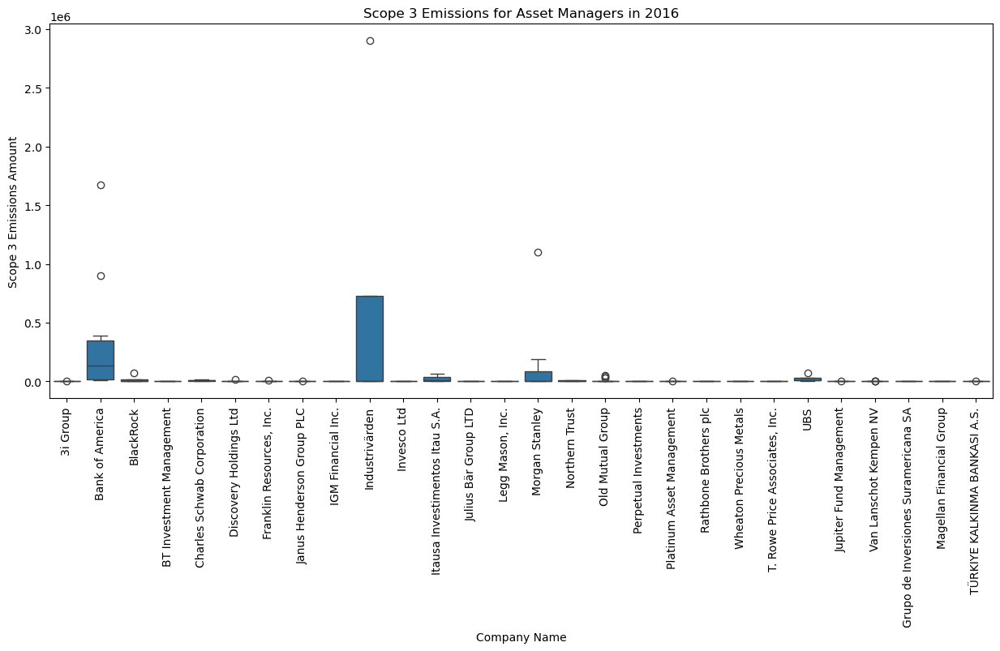

In [18]:
# Filter the dataset for "Asset managers" in 2016
filtered_df = data[(data["Primary activity"] == "Asset managers") & (data["Year"] == 2016)]

# Check if we have data 
if filtered_df.empty:
    print("No data available for Asset managers in 2016.")
else:
    # Create the plot
    plt.figure(figsize=(15, 6))
    sns.boxplot(x="account_name", y="Scope_3_emissions_amount", data=filtered_df)
    plt.xticks(rotation=90)
    plt.xlabel("Company Name")
    plt.ylabel("Scope 3 Emissions Amount")
    plt.title("Scope 3 Emissions for Asset Managers in 2016")
    plt.show()

In [ ]:
### CRASH
import plotly.express as px

outlier_unique_companies = outliers['account_name'].unique()

for outlier_unique_company in outlier_unique_companies:
    outlier_unique_emission_types = outliers[outliers['account_name'] == outlier_unique_company]['Scope_3_emissions_type'].unique()
    
    for outlier_unique_emission_type in outlier_unique_emission_types:
        plot_data = data[(data['account_name'] == outlier_unique_company) & 
                         (data['Scope_3_emissions_type'] == outlier_unique_emission_type)]
        
        outlier_plot_data = outliers[(outliers['account_name'] == outlier_unique_company) & 
                                     (outliers['Scope_3_emissions_type'] == outlier_unique_emission_type)]
        
        fig = px.scatter(
            plot_data, 
            x='Year', 
            y='Scope_3_emissions_amount', 
            title=f"{outlier_unique_company} {outlier_unique_emission_type}", 
            hover_name='Year', 
            hover_data=['Scope_3_emissions_amount'], 
            trendline='ols'
        )

        fig.add_scatter(
            x=outlier_plot_data['Year'], 
            y=outlier_plot_data['Scope_3_emissions_amount'], 
            mode='markers', 
            marker=dict(color='red', size=10), 
            hovertext=outlier_plot_data['z_scores'], 
            hoverinfo='text', 
            name="Outlier"
        )

        fig.update_layout(width=800, height=600)
        fig.show()

In [19]:
df = pd.read_csv('Mega_merged_all_real_values.csv')

unique_primary_activities = df["Primary activity"].dropna().unique()

# Display 
unique_primary_activities

/var/folders/h7/9xqmfqgd45b8j4np0nndf6gw0000gn/T/ipykernel_5713/3491986523.py:1: DtypeWarning:

Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.



array(['Asset managers',
       'Transportation infrastructure & other construction',
       'Commercial services', 'Health care supplies', 'CCGT generation',
       'Banks', 'Cement', 'Hotels & lodging', 'Iron & steel',
       'Transportation support services', 'Insurance', 'Marketing',
       'Supermarkets, food & drugstores', 'Electrical equipment',
       'Specialty chemicals', 'Apparel stores', 'Software',
       'Electronic components', 'Health care services', 'Iron ore mining',
       'Medical equipment', 'Other food processing', 'Passenger airlines',
       'Inorganic base chemicals', 'Aluminium refining',
       'Pharmaceuticals', 'Print publishing', 'Tobacco products',
       'IT services', 'Railroad rolling stock', 'REIT',
       'Plastic products', 'Sporting goods', 'Electricity networks',
       'Metal containers & packaging', 'Biotechnology',
       'Oil & gas extraction', 'Other non-metallic minerals',
       'Precious metals & minerals mining',
       'Oil & gas pipelin

### Lots of primary activities that we need to inspect somehow for outliers!

In [ ]:
# Professor Feedback for this week
## Maybe look at the emissions by primary activity to be able to go over the biggest ones first?

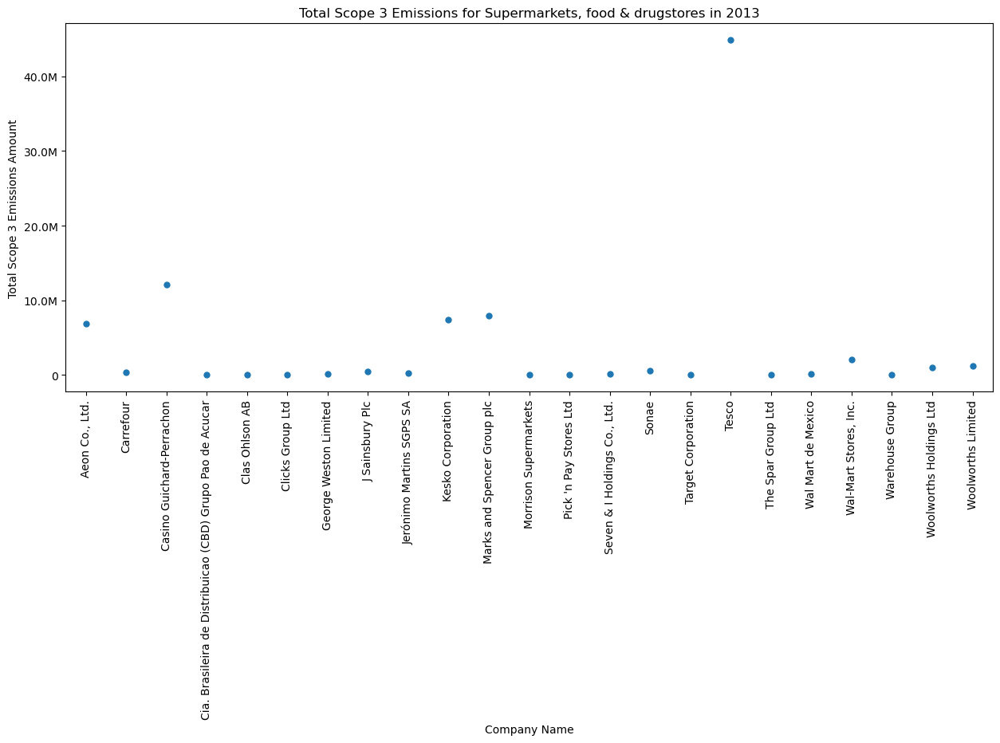

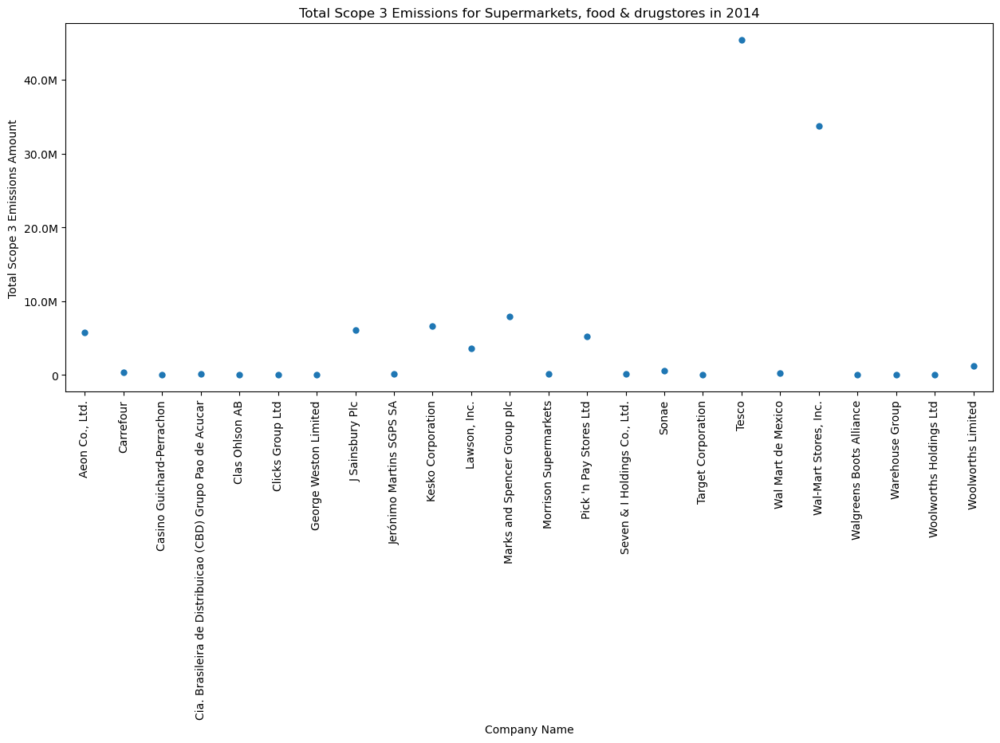

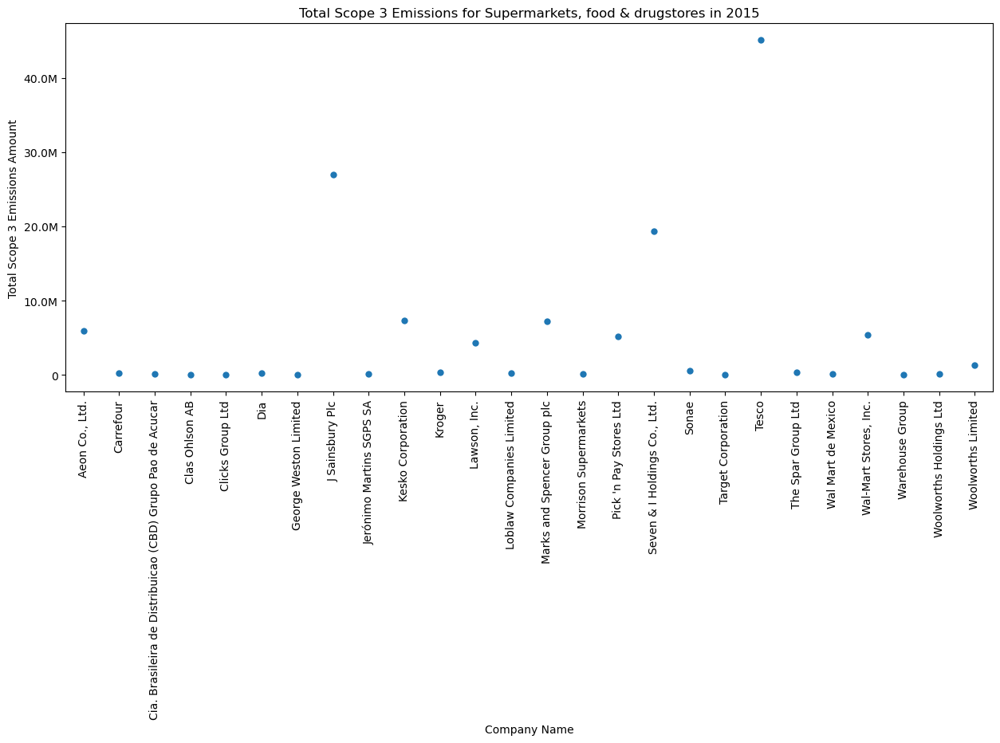

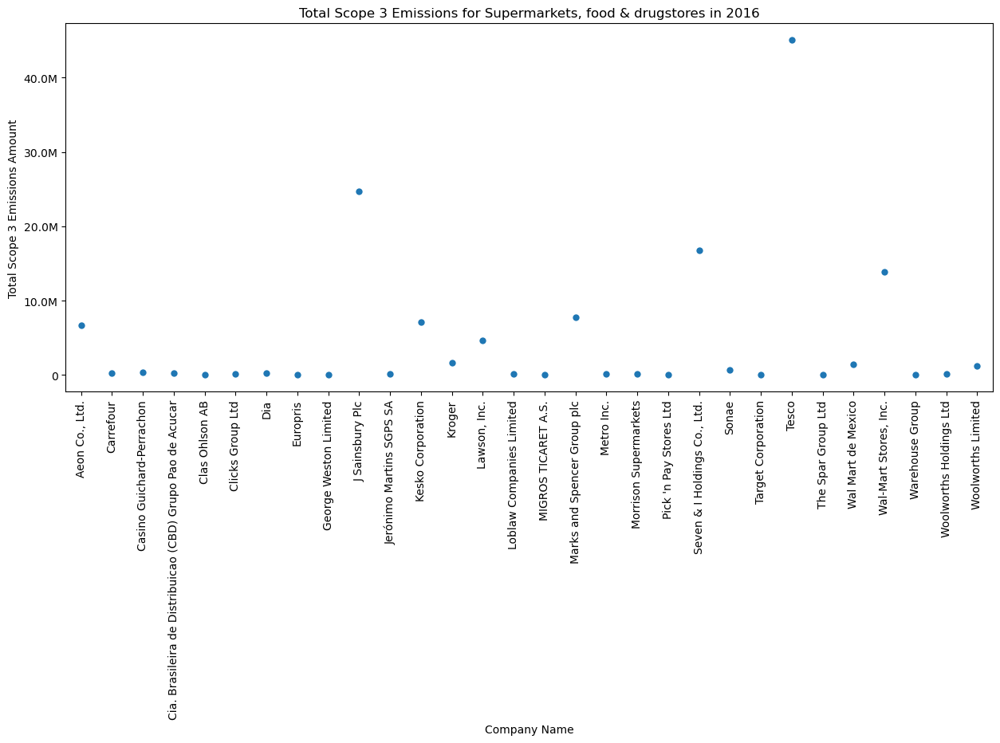

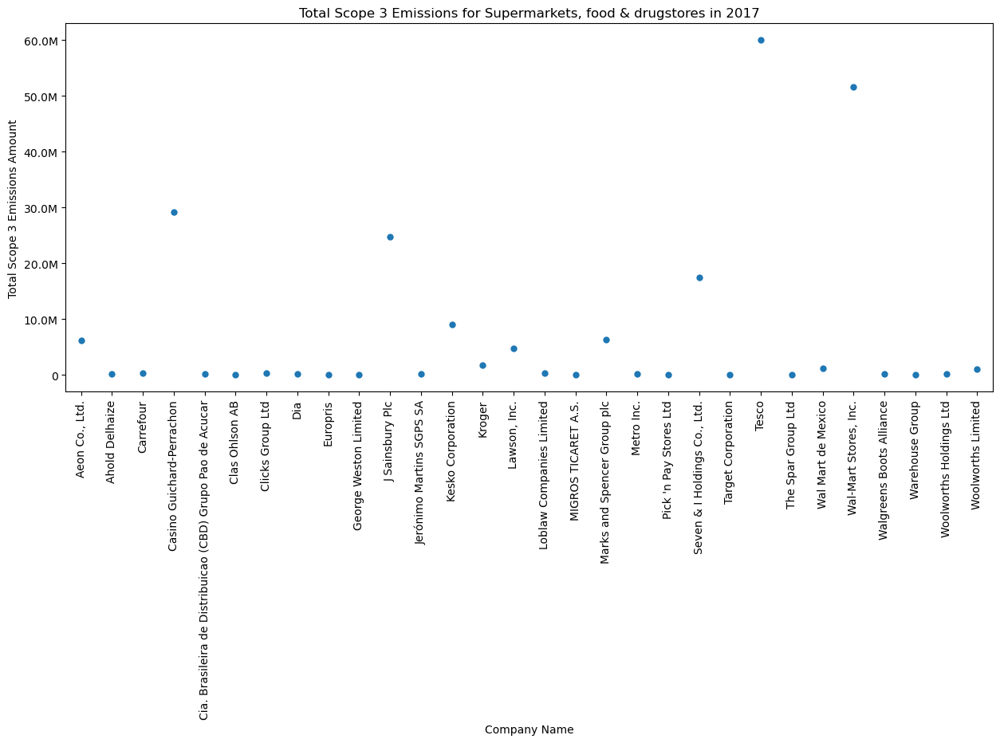

...

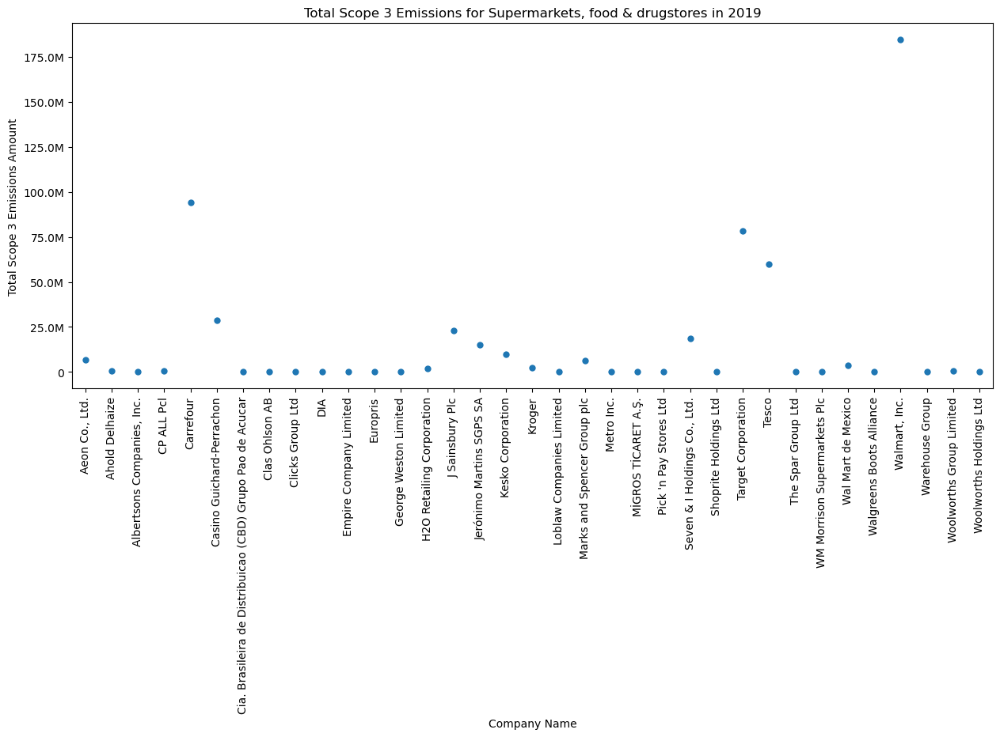

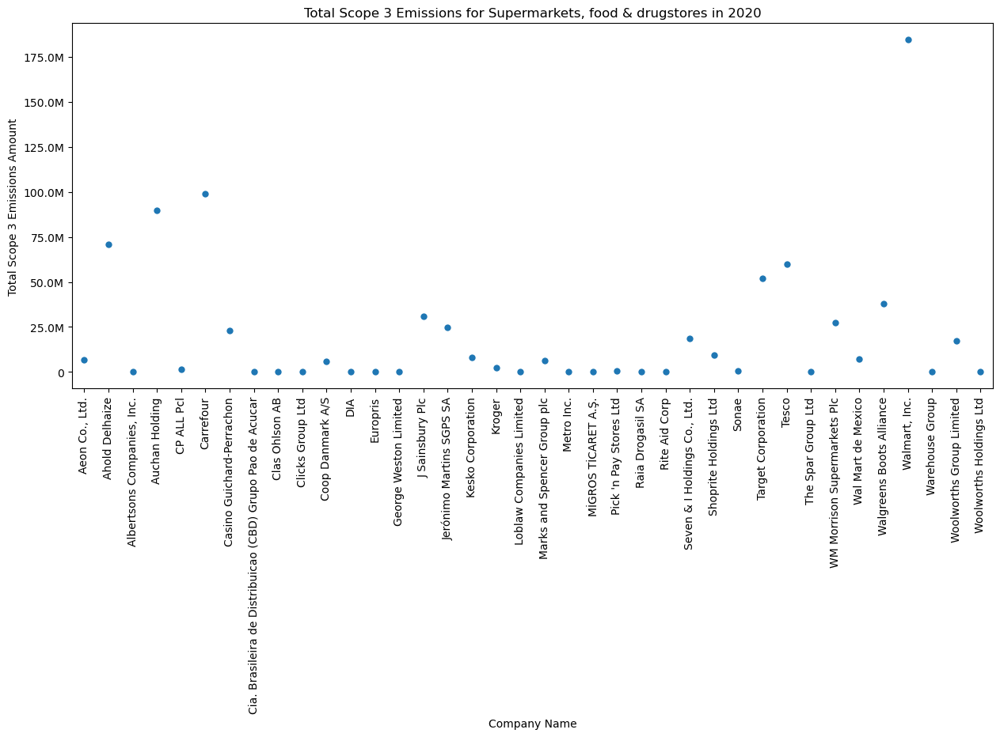

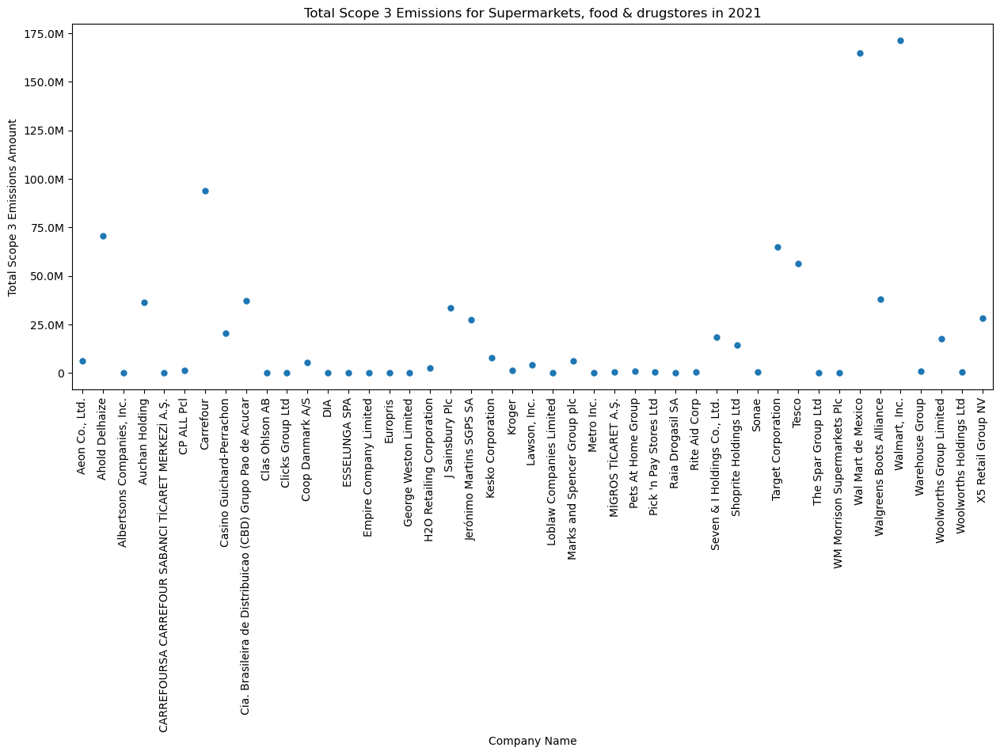

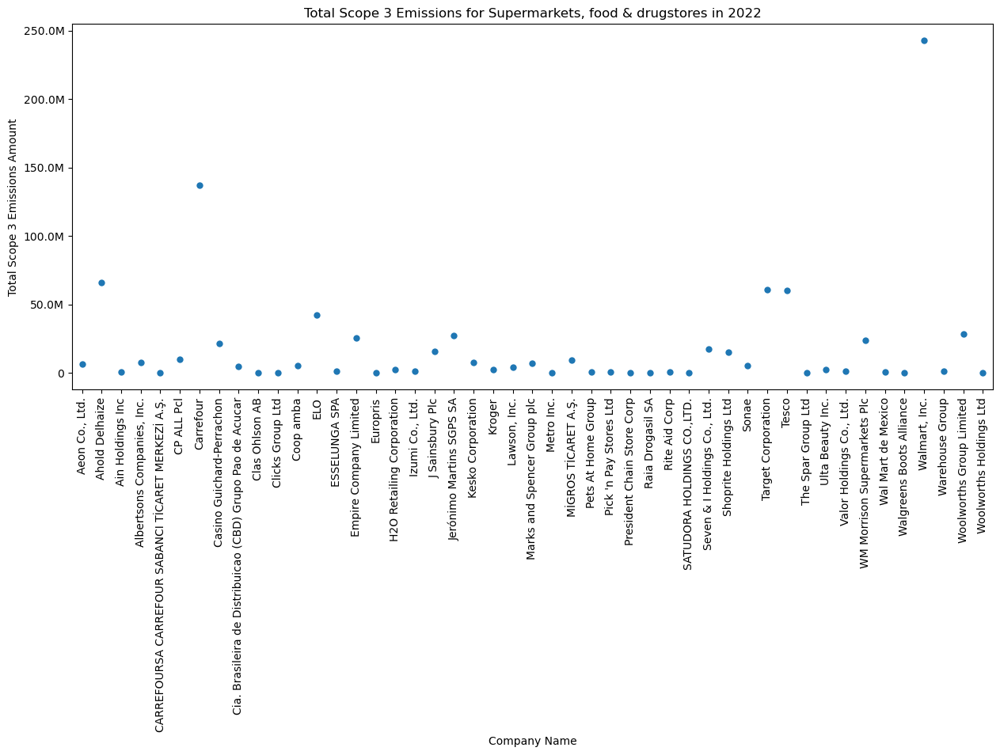

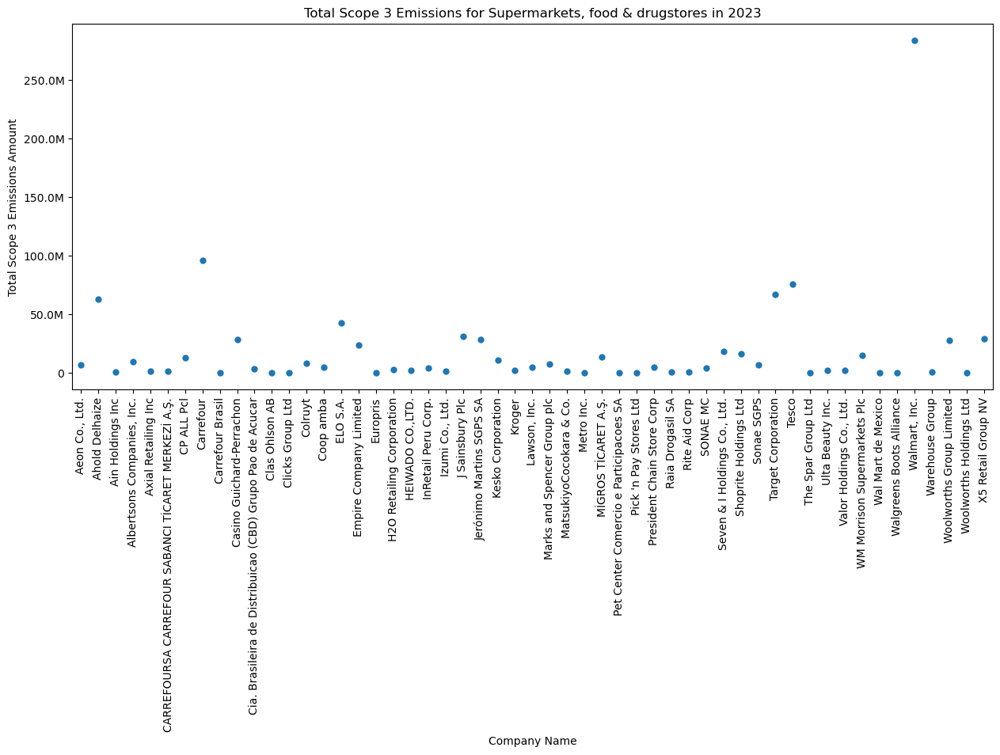

In [21]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as ticker

# Get the unique years from 2013 onwards
years = sorted(df[df["Year"] >= 2013]["Year"].unique())

# Define the primary activity to analyze
primary_activity = "Supermarkets, food & drugstores"

# Filter the dataset for the selected primary activity
activity_df = df[df["Primary activity"] == primary_activity]

# Check if there is data for this activity
if activity_df.empty:
    print(f"No data available for {primary_activity}.")
else:
    for year in years:
        yearly_df = activity_df[activity_df["Year"] == year]
        
        if yearly_df.empty:
            continue  
        
        # Aggregate emissions by company 
        aggregated_df = yearly_df.groupby("account_name")["Scope_3_emissions_amount"].sum().reset_index()

        # Create scatter plot 
        plt.figure(figsize=(15, 6))
        ax = sns.stripplot(x="account_name", y="Scope_3_emissions_amount", data=aggregated_df, jitter=True, size=6)

        plt.xticks(rotation=90)
        plt.xlabel("Company Name")
        plt.ylabel("Total Scope 3 Emissions Amount")
        plt.title(f"Total Scope 3 Emissions for {primary_activity} in {year}")

        # Format y-axis
        def human_format(num, pos):
            if num >= 1_000_000_000:
                return f'{num / 1_000_000_000:.1f}B'
            elif num >= 1_000_000:
                return f'{num / 1_000_000:.1f}M'
            else:
                return f'{num:.0f}'

        ax.yaxis.set_major_formatter(ticker.FuncFormatter(human_format))

        # Show the plot
        plt.show()

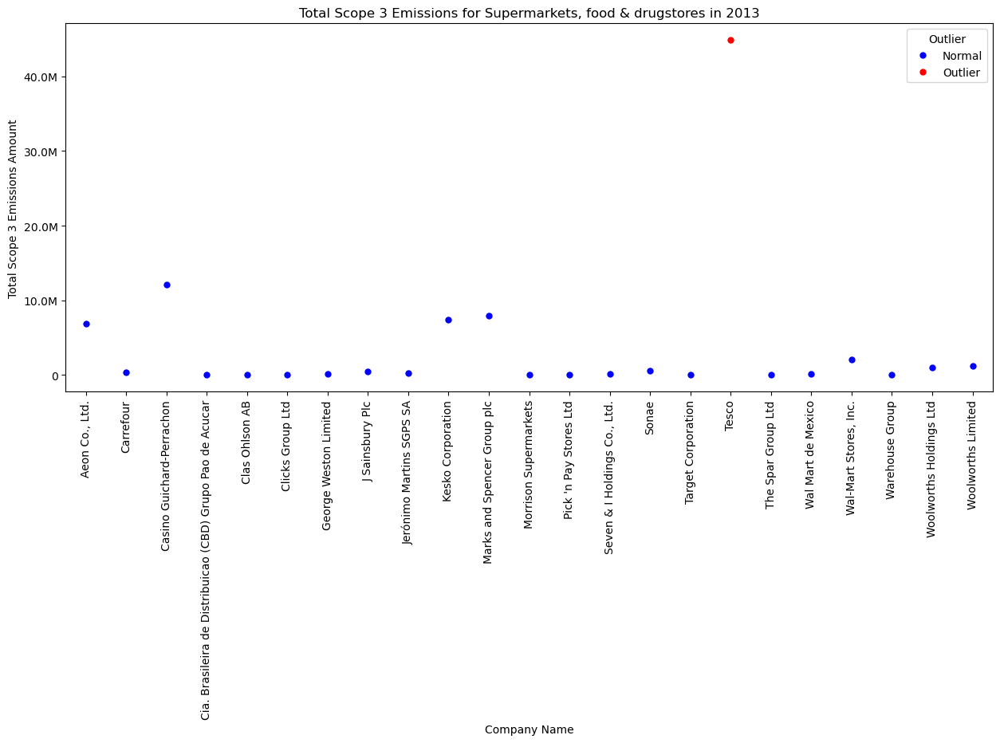

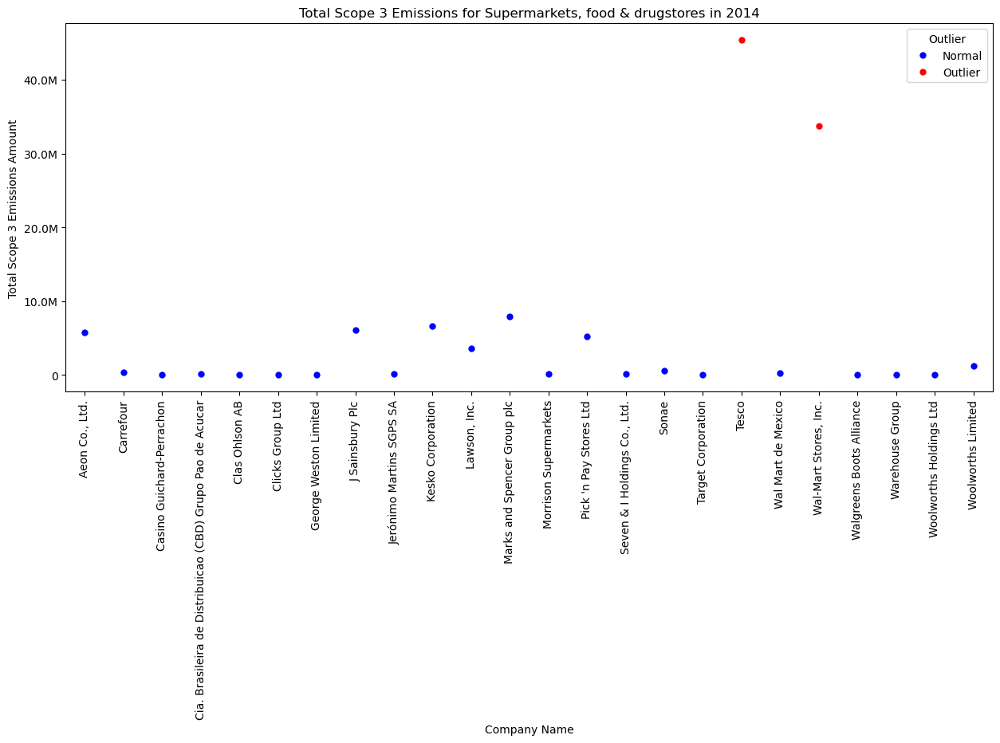

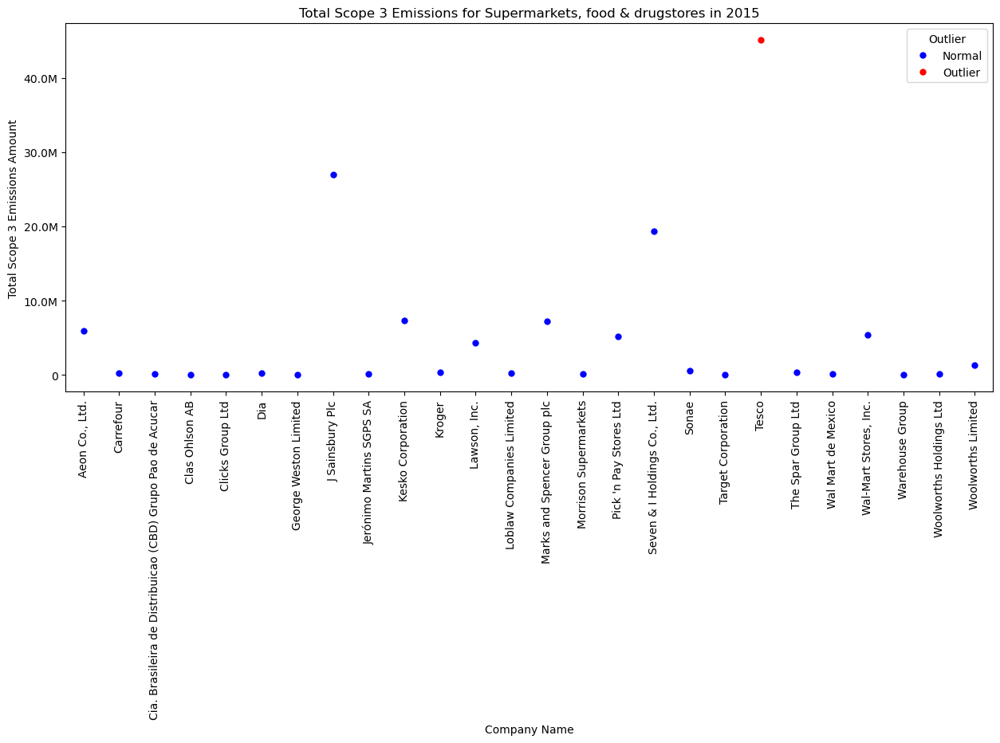

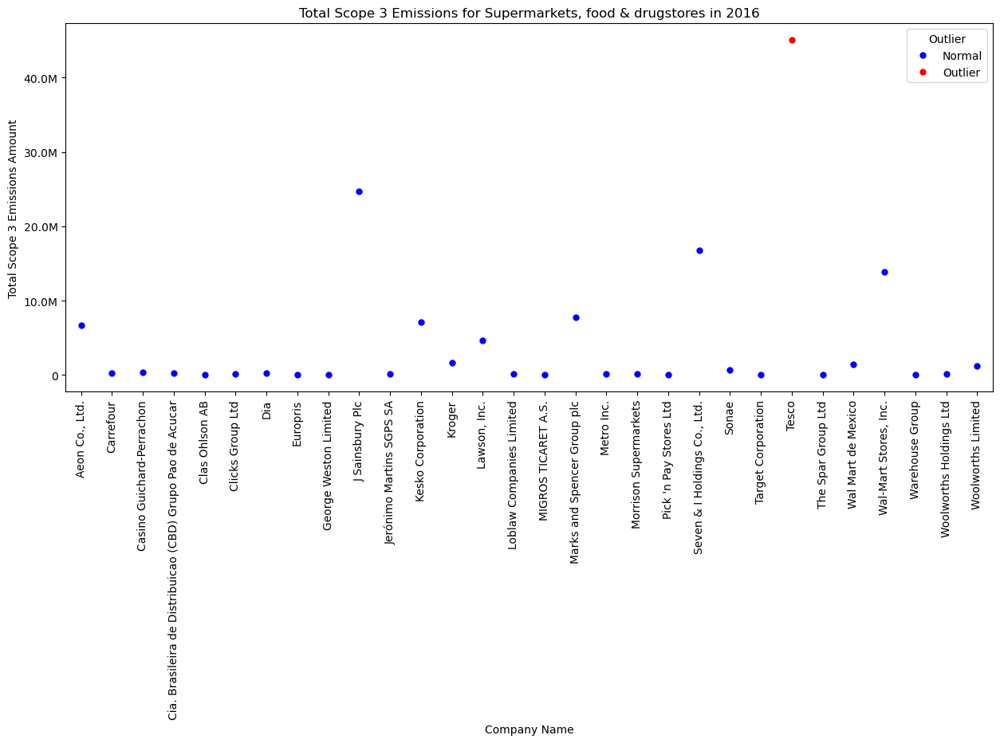

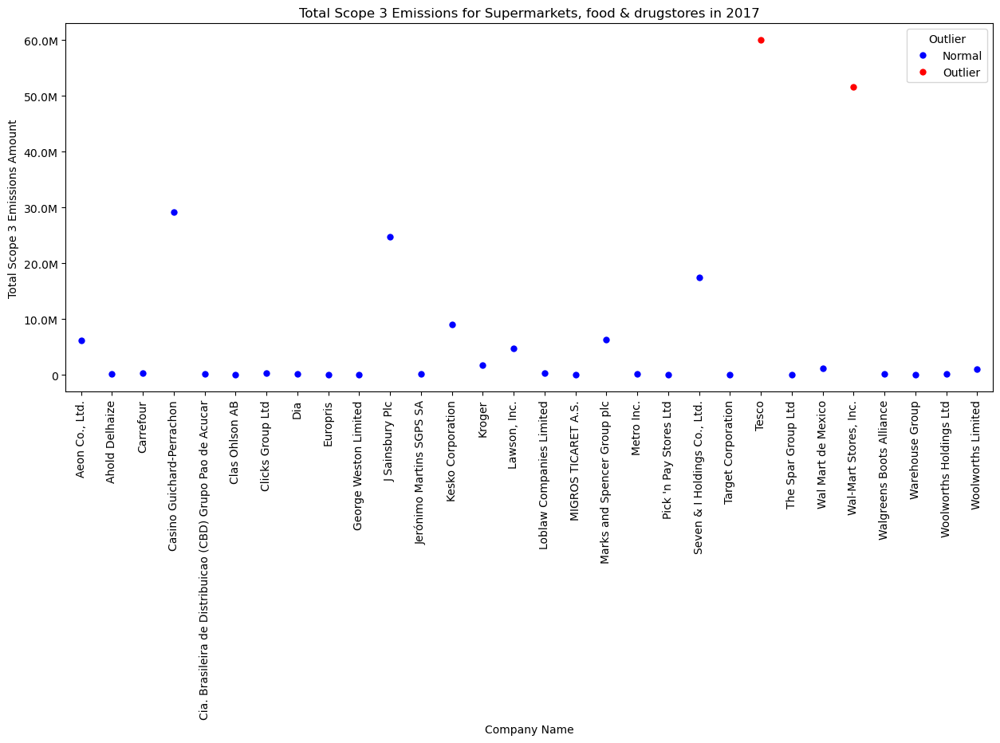

...

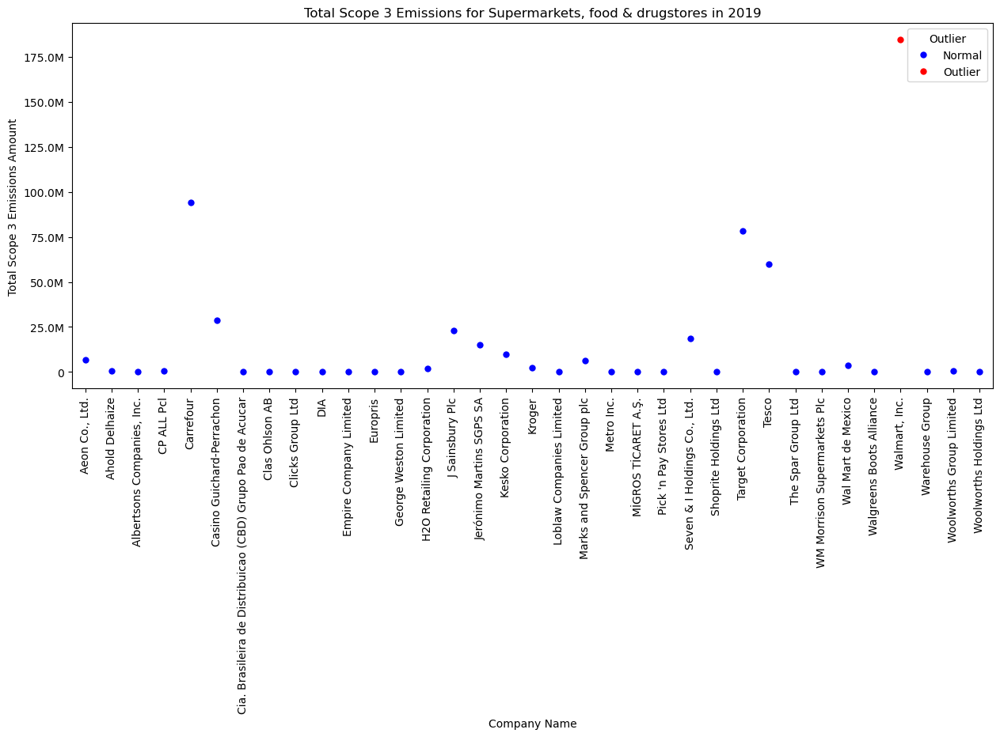

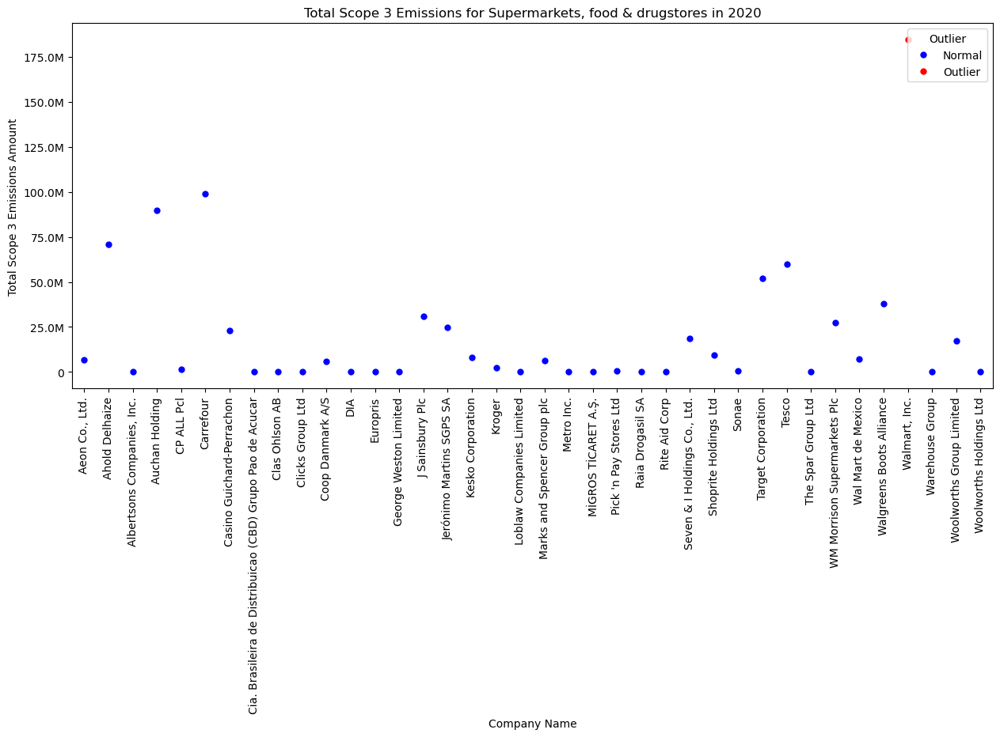

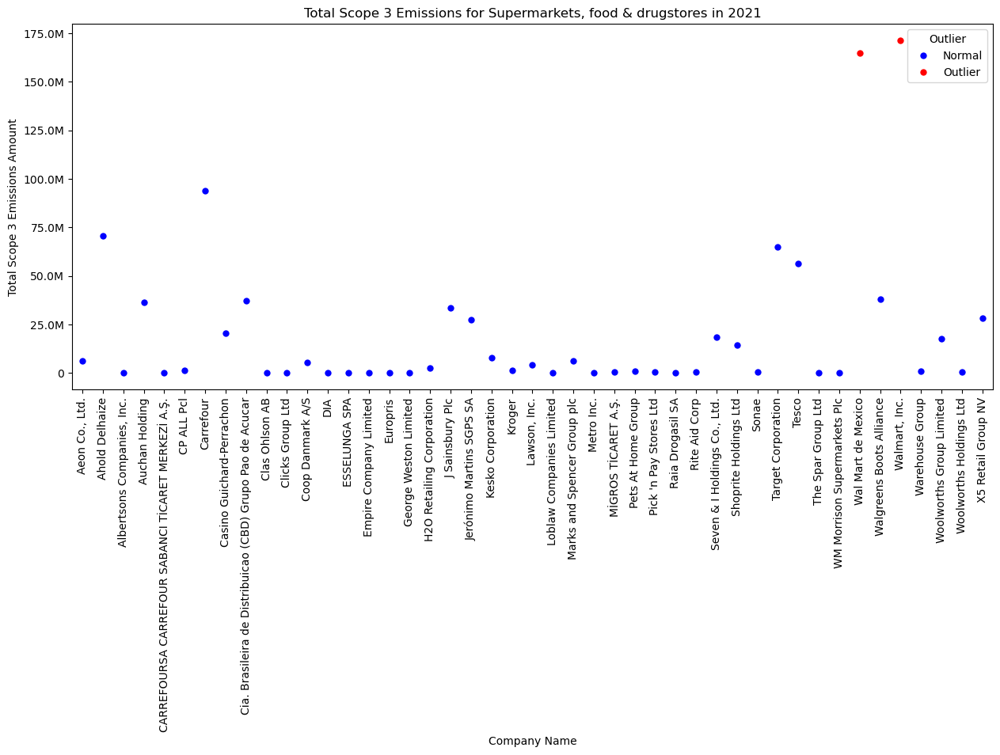

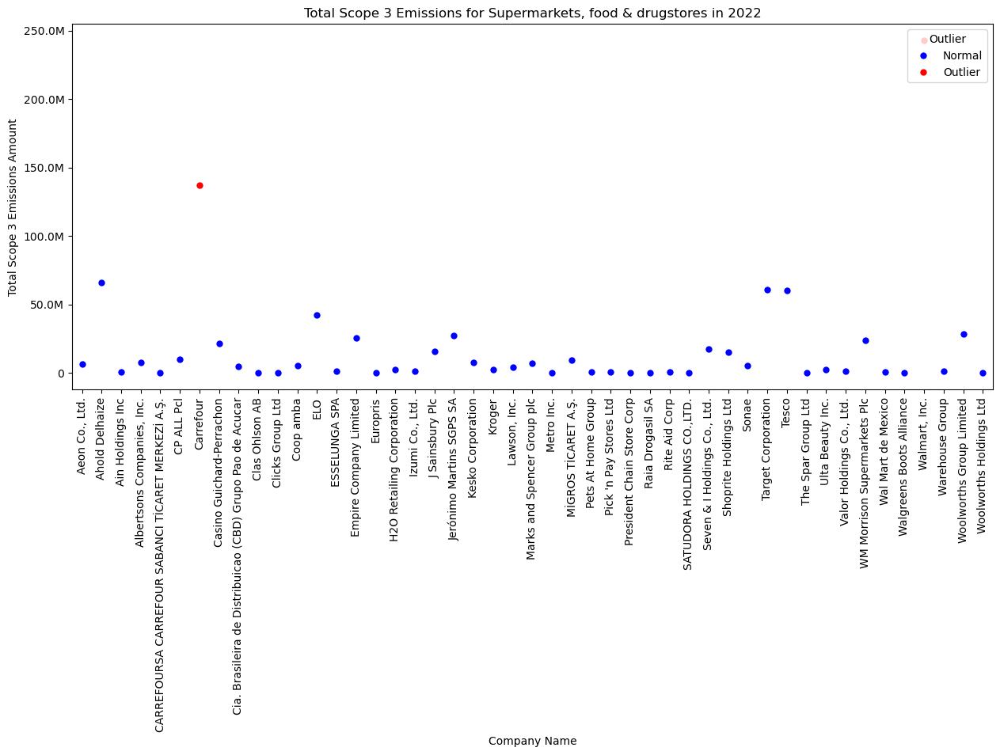

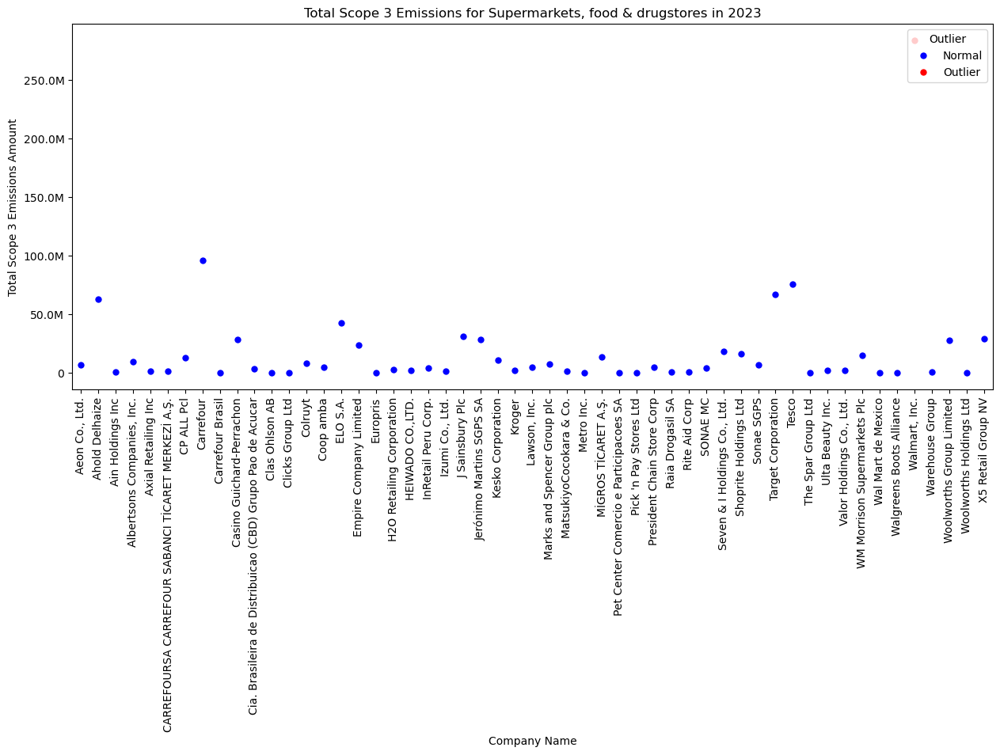

In [25]:
# Get the unique years from 2013 onwards
years = sorted(df[df["Year"] >= 2013]["Year"].unique())

# Define the primary activity 
primary_activity = "Supermarkets, food & drugstores"

# Filter the dataset 
activity_df = df[df["Primary activity"] == primary_activity]

# Check if there is data
if activity_df.empty:
    print(f"No data available for {primary_activity}.")
else:
    for year in years:
        yearly_df = activity_df[activity_df["Year"] == year]
        
        if yearly_df.empty:
            continue  
        
        # Aggregate emissions by company (sum of Scope 3 emission amount)
        aggregated_df = yearly_df.groupby("account_name")["Scope_3_emissions_amount"].sum().reset_index()

        # Calculate Z-scores for emissions within this Primary Activity for the given year
        aggregated_df["z_score"] = zscore(aggregated_df["Scope_3_emissions_amount"])

        # Identify outliers (Z-score > 2.5)
        aggregated_df["outlier"] = aggregated_df["z_score"].abs() > 2.5

        # Convert outlier column to string 
        aggregated_df["outlier"] = aggregated_df["outlier"].astype(str)

        # Create scatter plot 
        plt.figure(figsize=(15, 6))
        ax = sns.stripplot(
            x="account_name", 
            y="Scope_3_emissions_amount", 
            data=aggregated_df, 
            jitter=True, 
            size=6, 
            hue="outlier", 
            palette={"True": "red", "False": "blue"}  # Fix mapping issue
        )

        plt.xticks(rotation=90)
        plt.xlabel("Company Name")
        plt.ylabel("Total Scope 3 Emissions Amount")
        plt.title(f"Total Scope 3 Emissions for {primary_activity} in {year}")

        # Format y-axis 
        def human_format(num, pos):
            if num >= 1_000_000_000:
                return f'{num / 1_000_000_000:.1f}B'
            elif num >= 1_000_000:
                return f'{num / 1_000_000:.1f}M'
            else:
                return f'{num:.0f}'

        ax.yaxis.set_major_formatter(ticker.FuncFormatter(human_format))

        # Adjust legend 
        handles, labels = ax.get_legend_handles_labels()
        legend_labels = {"False": "Normal", "True": "Outlier"}
        plt.legend(handles, [legend_labels[label] for label in labels], title="Outlier", loc="upper right")

        # Show plot
        plt.show()

### I am really liking these plots, could use the z-score of 2.5, while looking at the year and primary activity and collecting the outliers based on that!

In [ ]:
# Professor Feedback for this week

# What is the best metric and cutoff for removing outliers? We created a word file that looks at different methods.

# Where do outliers lie - within a company, year, country, primary industry, primary activity, primary, sector?

### Trying some more outlier research here below with not much success this week unfortunately

In [16]:
# Import necessary libraries
import pandas as pd
import numpy as np
from scipy.stats import zscore

# Load the dataset
file_path = "Mega_merged_all_real_values.csv" 
df = pd.read_csv(file_path)

# Convert Scope 3 emissions to numeric (handle errors)
df["Scope_3_emissions_amount"] = pd.to_numeric(df["Scope_3_emissions_amount"], errors="coerce")

# Drop rows where Scope 3 emissions or necessary grouping columns are missing
df = df.dropna(subset=["Scope_3_emissions_amount", "account_name"])

# Function to detect outliers using Z-score (cutoff = 2.5)
def detect_outliers_zscore(df, column="Scope_3_emissions_amount", threshold=2.5):
    df["z_score"] = zscore(df[column], nan_policy='omit')
    df["outlier"] = df["z_score"].abs() > threshold
    return df

# Define grouping categories to check where outliers lie
groupings = ["account_name", "Year", "incorporated_country", "Primary industry", "Primary activity", "Primary sector"]

# Dictionary to store outlier counts for each category
outlier_counts = {}

# Loop through different groupings
for group in groupings:
    # Aggregate Scope 3 emissions at the given level
    grouped_df = df.groupby(group)["Scope_3_emissions_amount"].sum().reset_index()
    
    # Detect outliers using Z-score (2.5 threshold)
    grouped_df = detect_outliers_zscore(grouped_df)
    
    # Count outliers in this category
    outlier_counts[group] = grouped_df["outlier"].sum()

# Convert to DataFrame for visualization
outlier_summary = pd.DataFrame(list(outlier_counts.items()), columns=["Category", "Outlier_Count"])

# Display results 
print(outlier_summary)

# Save the results as a CSV file for later use
#outlier_summary.to_csv("outlier_summary.csv", index=False)

print("Outlier summary")

/var/folders/h7/9xqmfqgd45b8j4np0nndf6gw0000gn/T/ipykernel_3623/2714261408.py:8: DtypeWarning:

Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.



               Category  Outlier_Count
0          account_name             17
1                  Year              1
2  incorporated_country              3
3      Primary industry              1
4      Primary activity              4
5        Primary sector              2
Outlier summary


### Here I am trying to look for outliers based only on the primary activity and the scope 3 emission amounts!

/var/folders/h7/9xqmfqgd45b8j4np0nndf6gw0000gn/T/ipykernel_5713/3661638726.py:8: DtypeWarning:

Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.

/var/folders/h7/9xqmfqgd45b8j4np0nndf6gw0000gn/T/ipykernel_5713/3661638726.py:38: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



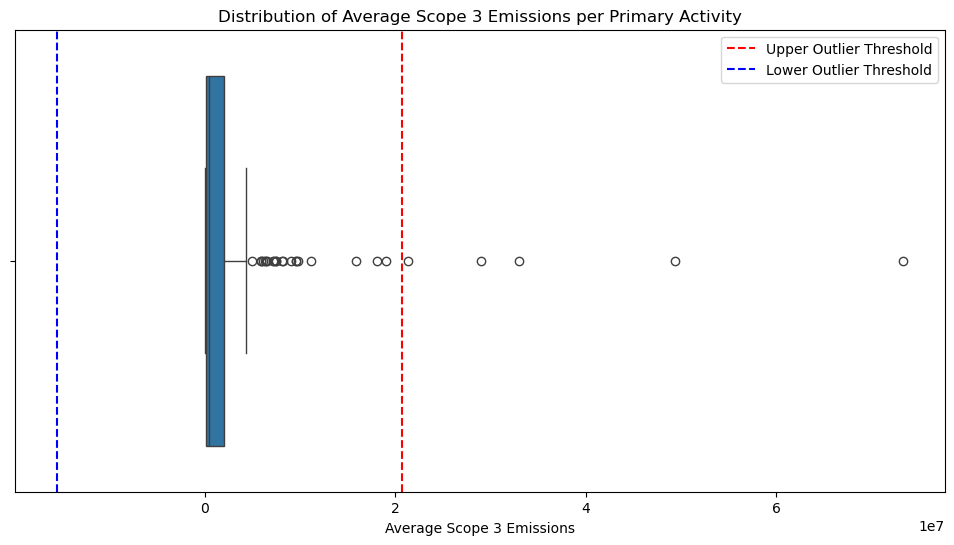

,Primary activity,Formatted_Emissions
100,Iron ore mining,32.99M
115,Natural gas extraction,21.39M
120,Non-nitrogenous fertilizers,73.23M
126,Oil & gas refining,28.96M
190,"Supermarkets, food & drugstores",49.31M


In [20]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display

# Load the dataset
file_path = "Mega_merged_all_real_values.csv"  # Ensure the correct file path
df = pd.read_csv(file_path)

# Drop missing values in the relevant columns
df_filtered = df[['Primary activity', 'Scope_3_emissions_amount']].dropna()

# Compute average Scope 3 emissions per primary activity
avg_emissions = df_filtered.groupby('Primary activity')['Scope_3_emissions_amount'].mean().reset_index()

# Compute the overall mean and standard deviation to detect outliers
overall_mean = avg_emissions['Scope_3_emissions_amount'].mean()
overall_std = avg_emissions['Scope_3_emissions_amount'].std()

# Define outliers as those that deviate more than 2 standard deviations from the mean
threshold_upper = overall_mean + 2.5 * overall_std
threshold_lower = overall_mean - 2.5 * overall_std

# Identify outliers
outliers = avg_emissions[(avg_emissions['Scope_3_emissions_amount'] > threshold_upper) |
                         (avg_emissions['Scope_3_emissions_amount'] < threshold_lower)]

# Function to format emissions in Millions (M) or Billions (B)
def format_emissions(value):
    """Convert emissions to readable format: M for millions, B for billions"""
    if value >= 1e9:
        return f"{value / 1e9:.2f}B"
    elif value >= 1e6:
        return f"{value / 1e6:.2f}M"
    return f"{value:.2f}"

# Apply the formatting function to emissions column
outliers['Formatted_Emissions'] = outliers['Scope_3_emissions_amount'].apply(format_emissions)

# Drop the original column and rename for clarity
outliers_display = outliers[['Primary activity', 'Formatted_Emissions']]

# Plot the distribution of average emissions per primary activity
plt.figure(figsize=(12, 6))
sns.boxplot(x=avg_emissions['Scope_3_emissions_amount'])
plt.axvline(threshold_upper, color='r', linestyle='--', label='Upper Outlier Threshold')
plt.axvline(threshold_lower, color='b', linestyle='--', label='Lower Outlier Threshold')
plt.xlabel('Average Scope 3 Emissions')
plt.title('Distribution of Average Scope 3 Emissions per Primary Activity')
plt.legend()
plt.show()

# Display formatted table in Jupyter Notebook
display(outliers_display)

### Looks alright but I think that the outlier plot by the primary activity and year is still better!

In [2]:
# Professor Feedback

# One of these boxplots for each unique primary activity, what companies are outliers within each unique activity! Can be seen here below!

# Use R through Jupyter Notebook! Check it out! We created an R Analysis workbook!

### Started creating these one by one as my computer would not allow me to generate them all in the same block of code :( 

/var/folders/h7/9xqmfqgd45b8j4np0nndf6gw0000gn/T/ipykernel_5713/2179114187.py:8: DtypeWarning:

Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.

/var/folders/h7/9xqmfqgd45b8j4np0nndf6gw0000gn/T/ipykernel_5713/2179114187.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/h7/9xqmfqgd45b8j4np0nndf6gw0000gn/T/ipykernel_5713/2179114187.py:47: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



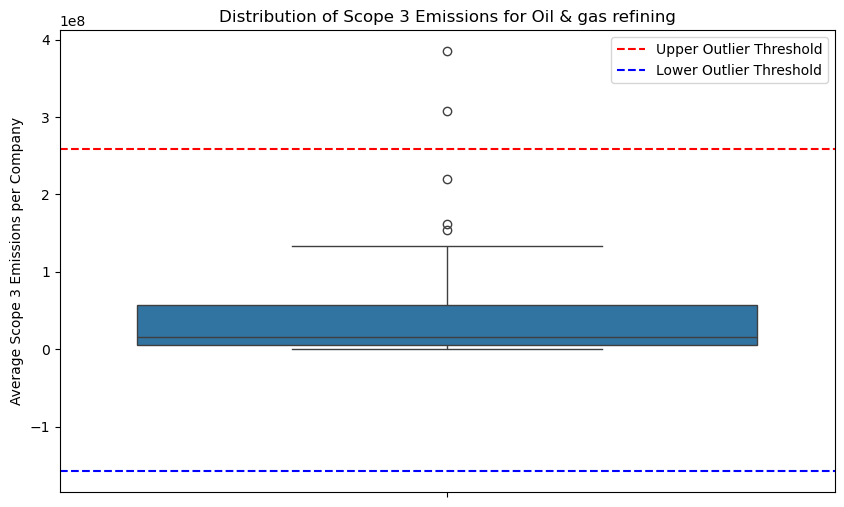

,account_name,Formatted_Emissions
0,BP,384.99M
27,Petroliam Nasional Berhad (PETRONAS),307.61M


In [23]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display

# Load the dataset
file_path = "Mega_merged_all_real_values.csv" 
df = pd.read_csv(file_path)

# Define the primary activity to analyze
activity_to_analyze = "Oil & gas refining"

# Filter the dataset for the selected activity
activity_df = df[df['Primary activity'] == activity_to_analyze]

# Ensure the Scope 3 emissions column is numeric
activity_df['Scope_3_emissions_amount'] = pd.to_numeric(activity_df['Scope_3_emissions_amount'], errors='coerce')

# Drop missing values
activity_df = activity_df.dropna(subset=['Scope_3_emissions_amount'])

# Compute average Scope 3 emissions per company within the selected activity
avg_emissions_per_company = activity_df.groupby('account_name')['Scope_3_emissions_amount'].mean().reset_index()

# Compute the mean and standard deviation for the selected activity
activity_mean = avg_emissions_per_company['Scope_3_emissions_amount'].mean()
activity_std = avg_emissions_per_company['Scope_3_emissions_amount'].std()

# Define outliers using the 2.5 standard deviation threshold
upper_threshold = activity_mean + 2.5 * activity_std
lower_threshold = activity_mean - 2.5 * activity_std

# Identify outliers
outliers = avg_emissions_per_company[
    (avg_emissions_per_company['Scope_3_emissions_amount'] > upper_threshold) |
    (avg_emissions_per_company['Scope_3_emissions_amount'] < lower_threshold)
]

# Format emissions in a readable format
def format_emissions(value):
    if value >= 1e9:
        return f"{value / 1e9:.2f}B"
    elif value >= 1e6:
        return f"{value / 1e6:.2f}M"
    return f"{value:.2f}"

outliers['Formatted_Emissions'] = outliers['Scope_3_emissions_amount'].apply(format_emissions)

# Drop the original column and rename for clarity
outliers_display = outliers[['account_name', 'Formatted_Emissions']]

# Plot the boxplot for this activity
plt.figure(figsize=(10, 6))
sns.boxplot(y=avg_emissions_per_company['Scope_3_emissions_amount'])
plt.axhline(upper_threshold, color='r', linestyle='--', label='Upper Outlier Threshold')
plt.axhline(lower_threshold, color='b', linestyle='--', label='Lower Outlier Threshold')
plt.title(f'Distribution of Scope 3 Emissions for {activity_to_analyze}')
plt.ylabel('Average Scope 3 Emissions per Company')
plt.legend()
plt.show()

# Display the outliers table in Jupyter Notebook
display(outliers_display)

/var/folders/h7/9xqmfqgd45b8j4np0nndf6gw0000gn/T/ipykernel_5713/2585175363.py:8: DtypeWarning:

Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.

/var/folders/h7/9xqmfqgd45b8j4np0nndf6gw0000gn/T/ipykernel_5713/2585175363.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/h7/9xqmfqgd45b8j4np0nndf6gw0000gn/T/ipykernel_5713/2585175363.py:47: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



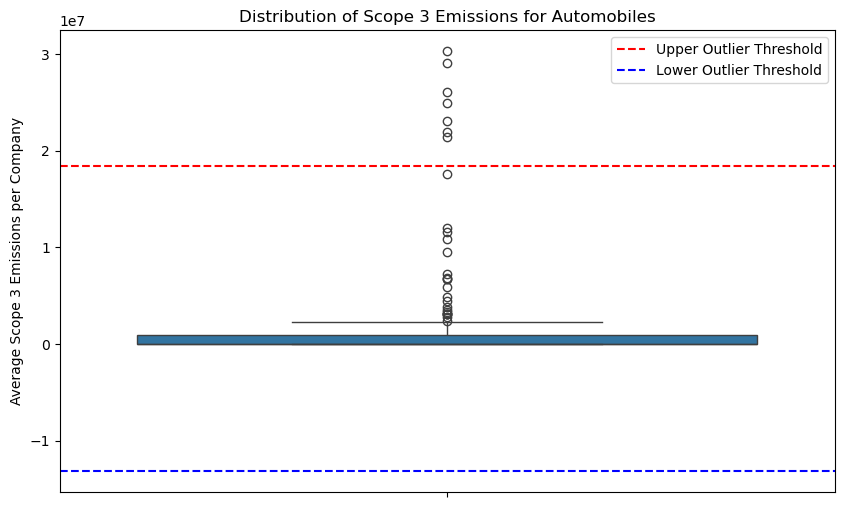

,account_name,Formatted_Emissions
33,Ford Motor Company,26.10M
38,General Motors Company,21.40M
45,"Honda Motor Co., Ltd.",23.03M
46,Honda Motor Company,21.95M
81,Navistar International Corporation,29.09M
111,Toyota Motor Corporation,24.90M
116,Volkswagen AG,30.29M


In [24]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display

# Load the dataset
file_path = "Mega_merged_all_real_values.csv"  # Ensure the correct file path
df = pd.read_csv(file_path)

# Define the primary activity to analyze
activity_to_analyze = "Automobiles"

# Filter the dataset for the selected activity
activity_df = df[df['Primary activity'] == activity_to_analyze]

# Ensure the Scope 3 emissions column is numeric
activity_df['Scope_3_emissions_amount'] = pd.to_numeric(activity_df['Scope_3_emissions_amount'], errors='coerce')

# Drop missing values
activity_df = activity_df.dropna(subset=['Scope_3_emissions_amount'])

# Compute average Scope 3 emissions per company within the selected activity
avg_emissions_per_company = activity_df.groupby('account_name')['Scope_3_emissions_amount'].mean().reset_index()

# Compute the mean and standard deviation for the selected activity
activity_mean = avg_emissions_per_company['Scope_3_emissions_amount'].mean()
activity_std = avg_emissions_per_company['Scope_3_emissions_amount'].std()

# Define outliers using the 2.5 standard deviation threshold
upper_threshold = activity_mean + 2.5 * activity_std
lower_threshold = activity_mean - 2.5 * activity_std

# Identify outliers
outliers = avg_emissions_per_company[
    (avg_emissions_per_company['Scope_3_emissions_amount'] > upper_threshold) |
    (avg_emissions_per_company['Scope_3_emissions_amount'] < lower_threshold)
]

# Format emissions in a readable format
def format_emissions(value):
    if value >= 1e9:
        return f"{value / 1e9:.2f}B"
    elif value >= 1e6:
        return f"{value / 1e6:.2f}M"
    return f"{value:.2f}"

outliers['Formatted_Emissions'] = outliers['Scope_3_emissions_amount'].apply(format_emissions)

# Drop the original column and rename for clarity
outliers_display = outliers[['account_name', 'Formatted_Emissions']]

# Plot the boxplot for this activity
plt.figure(figsize=(10, 6))
sns.boxplot(y=avg_emissions_per_company['Scope_3_emissions_amount'])
plt.axhline(upper_threshold, color='r', linestyle='--', label='Upper Outlier Threshold')
plt.axhline(lower_threshold, color='b', linestyle='--', label='Lower Outlier Threshold')
plt.title(f'Distribution of Scope 3 Emissions for {activity_to_analyze}')
plt.ylabel('Average Scope 3 Emissions per Company')
plt.legend()
plt.show()

# Display the outliers table in Jupyter Notebook
display(outliers_display)

/var/folders/h7/9xqmfqgd45b8j4np0nndf6gw0000gn/T/ipykernel_5713/129029334.py:8: DtypeWarning:

Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.

/var/folders/h7/9xqmfqgd45b8j4np0nndf6gw0000gn/T/ipykernel_5713/129029334.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



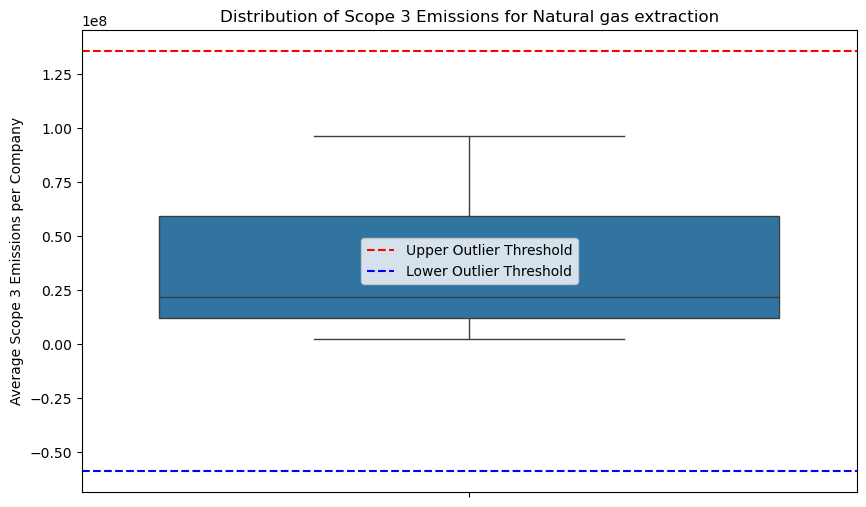

,account_name,Formatted_Emissions


In [25]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display

# Load the dataset
file_path = "Mega_merged_all_real_values.csv"  # Ensure the correct file path
df = pd.read_csv(file_path)

# Define the primary activity to analyze
activity_to_analyze = "Natural gas extraction"

# Filter the dataset for the selected activity
activity_df = df[df['Primary activity'] == activity_to_analyze]

# Ensure the Scope 3 emissions column is numeric
activity_df['Scope_3_emissions_amount'] = pd.to_numeric(activity_df['Scope_3_emissions_amount'], errors='coerce')

# Drop missing values
activity_df = activity_df.dropna(subset=['Scope_3_emissions_amount'])

# Compute average Scope 3 emissions per company within the selected activity
avg_emissions_per_company = activity_df.groupby('account_name')['Scope_3_emissions_amount'].mean().reset_index()

# Compute the mean and standard deviation for the selected activity
activity_mean = avg_emissions_per_company['Scope_3_emissions_amount'].mean()
activity_std = avg_emissions_per_company['Scope_3_emissions_amount'].std()

# Define outliers using the 2.5 standard deviation threshold
upper_threshold = activity_mean + 2.5 * activity_std
lower_threshold = activity_mean - 2.5 * activity_std

# Identify outliers
outliers = avg_emissions_per_company[
    (avg_emissions_per_company['Scope_3_emissions_amount'] > upper_threshold) |
    (avg_emissions_per_company['Scope_3_emissions_amount'] < lower_threshold)
]

# Format emissions in a readable format
def format_emissions(value):
    if value >= 1e9:
        return f"{value / 1e9:.2f}B"
    elif value >= 1e6:
        return f"{value / 1e6:.2f}M"
    return f"{value:.2f}"

outliers['Formatted_Emissions'] = outliers['Scope_3_emissions_amount'].apply(format_emissions)

# Drop the original column and rename for clarity
outliers_display = outliers[['account_name', 'Formatted_Emissions']]

# Plot the boxplot for this activity
plt.figure(figsize=(10, 6))
sns.boxplot(y=avg_emissions_per_company['Scope_3_emissions_amount'])
plt.axhline(upper_threshold, color='r', linestyle='--', label='Upper Outlier Threshold')
plt.axhline(lower_threshold, color='b', linestyle='--', label='Lower Outlier Threshold')
plt.title(f'Distribution of Scope 3 Emissions for {activity_to_analyze}')
plt.ylabel('Average Scope 3 Emissions per Company')
plt.legend()
plt.show()

# Display the outliers table in Jupyter Notebook
display(outliers_display)

/var/folders/h7/9xqmfqgd45b8j4np0nndf6gw0000gn/T/ipykernel_5713/1787518403.py:8: DtypeWarning:

Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.

/var/folders/h7/9xqmfqgd45b8j4np0nndf6gw0000gn/T/ipykernel_5713/1787518403.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/h7/9xqmfqgd45b8j4np0nndf6gw0000gn/T/ipykernel_5713/1787518403.py:47: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



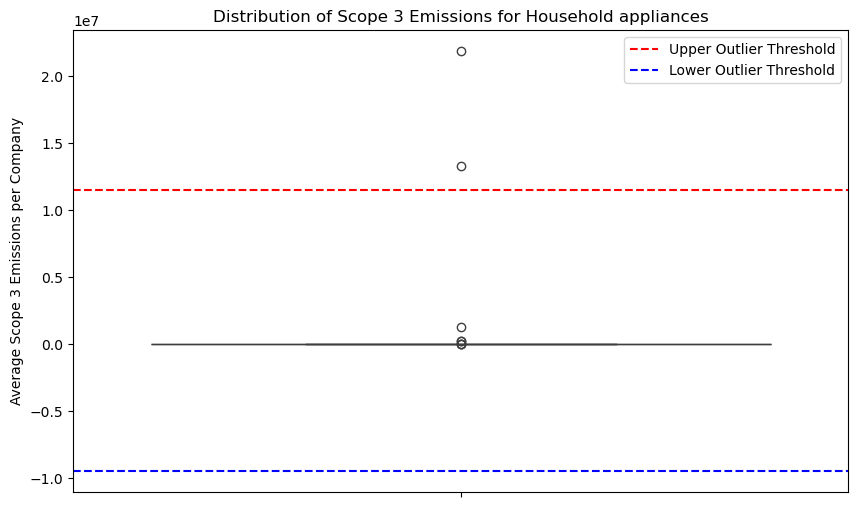

,account_name,Formatted_Emissions
33,Whirlpool Corporation,21.86M
34,XIAMEN INTRETECH INC.,13.25M


In [26]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display

# Load the dataset
file_path = "Mega_merged_all_real_values.csv"  # Ensure the correct file path
df = pd.read_csv(file_path)

# Define the primary activity to analyze
activity_to_analyze = "Household appliances"

# Filter the dataset for the selected activity
activity_df = df[df['Primary activity'] == activity_to_analyze]

# Ensure the Scope 3 emissions column is numeric
activity_df['Scope_3_emissions_amount'] = pd.to_numeric(activity_df['Scope_3_emissions_amount'], errors='coerce')

# Drop missing values
activity_df = activity_df.dropna(subset=['Scope_3_emissions_amount'])

# Compute average Scope 3 emissions per company within the selected activity
avg_emissions_per_company = activity_df.groupby('account_name')['Scope_3_emissions_amount'].mean().reset_index()

# Compute the mean and standard deviation for the selected activity
activity_mean = avg_emissions_per_company['Scope_3_emissions_amount'].mean()
activity_std = avg_emissions_per_company['Scope_3_emissions_amount'].std()

# Define outliers using the 2.5 standard deviation threshold
upper_threshold = activity_mean + 2.5 * activity_std
lower_threshold = activity_mean - 2.5 * activity_std

# Identify outliers
outliers = avg_emissions_per_company[
    (avg_emissions_per_company['Scope_3_emissions_amount'] > upper_threshold) |
    (avg_emissions_per_company['Scope_3_emissions_amount'] < lower_threshold)
]

# Format emissions in a readable format
def format_emissions(value):
    if value >= 1e9:
        return f"{value / 1e9:.2f}B"
    elif value >= 1e6:
        return f"{value / 1e6:.2f}M"
    return f"{value:.2f}"

outliers['Formatted_Emissions'] = outliers['Scope_3_emissions_amount'].apply(format_emissions)

# Drop the original column and rename for clarity
outliers_display = outliers[['account_name', 'Formatted_Emissions']]

# Plot the boxplot for this activity
plt.figure(figsize=(10, 6))
sns.boxplot(y=avg_emissions_per_company['Scope_3_emissions_amount'])
plt.axhline(upper_threshold, color='r', linestyle='--', label='Upper Outlier Threshold')
plt.axhline(lower_threshold, color='b', linestyle='--', label='Lower Outlier Threshold')
plt.title(f'Distribution of Scope 3 Emissions for {activity_to_analyze}')
plt.ylabel('Average Scope 3 Emissions per Company')
plt.legend()
plt.show()

# Display the outliers table in Jupyter Notebook
display(outliers_display)

/var/folders/h7/9xqmfqgd45b8j4np0nndf6gw0000gn/T/ipykernel_5713/3218964753.py:8: DtypeWarning:

Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.

/var/folders/h7/9xqmfqgd45b8j4np0nndf6gw0000gn/T/ipykernel_5713/3218964753.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/h7/9xqmfqgd45b8j4np0nndf6gw0000gn/T/ipykernel_5713/3218964753.py:47: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



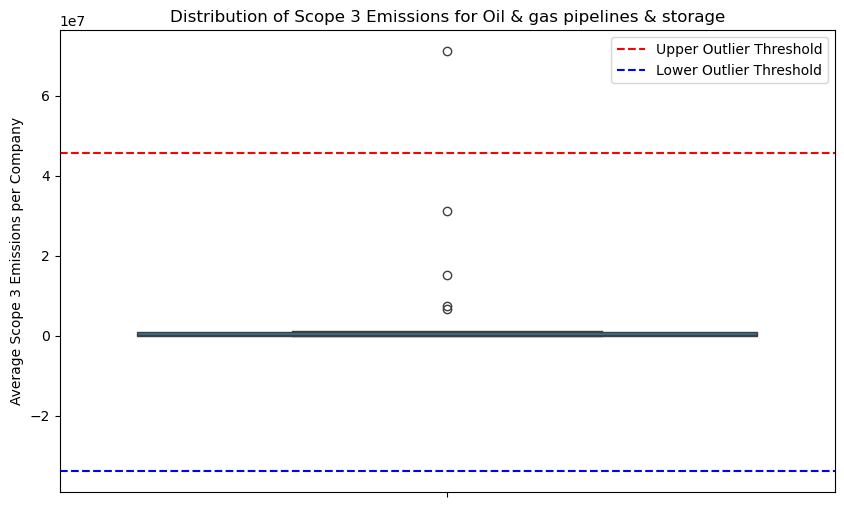

,account_name,Formatted_Emissions
5,Equitrans Midstream,71.09M


In [27]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display

# Load the dataset
file_path = "Mega_merged_all_real_values.csv"  # Ensure the correct file path
df = pd.read_csv(file_path)

# Define the primary activity to analyze
activity_to_analyze = "Oil & gas pipelines & storage"

# Filter the dataset for the selected activity
activity_df = df[df['Primary activity'] == activity_to_analyze]

# Ensure the Scope 3 emissions column is numeric
activity_df['Scope_3_emissions_amount'] = pd.to_numeric(activity_df['Scope_3_emissions_amount'], errors='coerce')

# Drop missing values
activity_df = activity_df.dropna(subset=['Scope_3_emissions_amount'])

# Compute average Scope 3 emissions per company within the selected activity
avg_emissions_per_company = activity_df.groupby('account_name')['Scope_3_emissions_amount'].mean().reset_index()

# Compute the mean and standard deviation for the selected activity
activity_mean = avg_emissions_per_company['Scope_3_emissions_amount'].mean()
activity_std = avg_emissions_per_company['Scope_3_emissions_amount'].std()

# Define outliers using the 2.5 standard deviation threshold
upper_threshold = activity_mean + 2.5 * activity_std
lower_threshold = activity_mean - 2.5 * activity_std

# Identify outliers
outliers = avg_emissions_per_company[
    (avg_emissions_per_company['Scope_3_emissions_amount'] > upper_threshold) |
    (avg_emissions_per_company['Scope_3_emissions_amount'] < lower_threshold)
]

# Format emissions in a readable format
def format_emissions(value):
    if value >= 1e9:
        return f"{value / 1e9:.2f}B"
    elif value >= 1e6:
        return f"{value / 1e6:.2f}M"
    return f"{value:.2f}"

outliers['Formatted_Emissions'] = outliers['Scope_3_emissions_amount'].apply(format_emissions)

# Drop the original column and rename for clarity
outliers_display = outliers[['account_name', 'Formatted_Emissions']]

# Plot the boxplot for this activity
plt.figure(figsize=(10, 6))
sns.boxplot(y=avg_emissions_per_company['Scope_3_emissions_amount'])
plt.axhline(upper_threshold, color='r', linestyle='--', label='Upper Outlier Threshold')
plt.axhline(lower_threshold, color='b', linestyle='--', label='Lower Outlier Threshold')
plt.title(f'Distribution of Scope 3 Emissions for {activity_to_analyze}')
plt.ylabel('Average Scope 3 Emissions per Company')
plt.legend()
plt.show()

# Display the outliers table in Jupyter Notebook
display(outliers_display)

### Here I got tired doing them one by one and split up the data by the primary activities total emissions, top third would be the primary acitivity with the most scope 3 emissions amounts! This was something I thought would work but eventually did not because the z-score can not be used when we split the data into thirds!

In [28]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display

# Load the dataset
file_path = "Mega_merged_all_real_values.csv"  # Ensure the correct file path
df = pd.read_csv(file_path)

# Step 1: Compute total Scope 3 emissions per Primary Activity
total_emissions_per_activity = df.groupby('Primary activity')['Scope_3_emissions_amount'].sum().reset_index()

# Step 2: Sort activities by total emissions
total_emissions_per_activity = total_emissions_per_activity.sort_values(by='Scope_3_emissions_amount', ascending=False)

# Step 3: Split into three equal-sized groups (top third, middle third, bottom third)
num_activities = len(total_emissions_per_activity)
top_third_cutoff = num_activities // 3
middle_third_cutoff = 2 * (num_activities // 3)

top_third = total_emissions_per_activity.iloc[:top_third_cutoff]
middle_third = total_emissions_per_activity.iloc[top_third_cutoff:middle_third_cutoff]
bottom_third = total_emissions_per_activity.iloc[middle_third_cutoff:]

# Display the data in Jupyter Notebook
display(top_third)  # Top third activities
display(middle_third)  # Middle third activities
display(bottom_third)  # Bottom third activities

/var/folders/h7/9xqmfqgd45b8j4np0nndf6gw0000gn/T/ipykernel_5713/1305397264.py:8: DtypeWarning:

Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.



,Primary activity,Scope_3_emissions_amount
190,"Supermarkets, food & drugstores",1.364318e+11
32,CCGT generation,4.429523e+10
126,Oil & gas refining,4.129179e+10
60,Electronic components,3.319522e+10
61,Electronic equipment,2.712381e+10
...,...,...
22,Baked goods & cereals,7.201587e+08
67,Fast food,7.114149e+08
166,Real estate services,7.013121e+08
104,Logistics - transport,6.896694e+08


,Primary activity,Scope_3_emissions_amount
201,Transportation infrastructure & other construc...,6.819776e+08
78,Glass products,6.753633e+08
10,Aluminium refining,6.505679e+08
88,Household appliances,6.245043e+08
148,Passenger airlines,5.960498e+08
...,...,...
37,Chocolate confection,6.024939e+07
13,Animal products wholesale,6.002789e+07
81,Health care facilities,6.000305e+07
154,Pollution control equipment,4.978810e+07


,Primary activity,Scope_3_emissions_amount
84,Heavy vehicles,4.970293e+07
75,Gambling,4.834724e+07
80,Grain & corn milling,4.676847e+07
144,Palm oil farming,4.439258e+07
176,Seafood processing,4.058451e+07
...,...,...
205,Vegetable farming,1.097439e+04
72,Fruit farming,1.777160e+03
191,Supranationals,1.397000e+03
101,Land sales & leasing,3.240000e+02


/var/folders/h7/9xqmfqgd45b8j4np0nndf6gw0000gn/T/ipykernel_5713/3379819897.py:8: DtypeWarning:

Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.



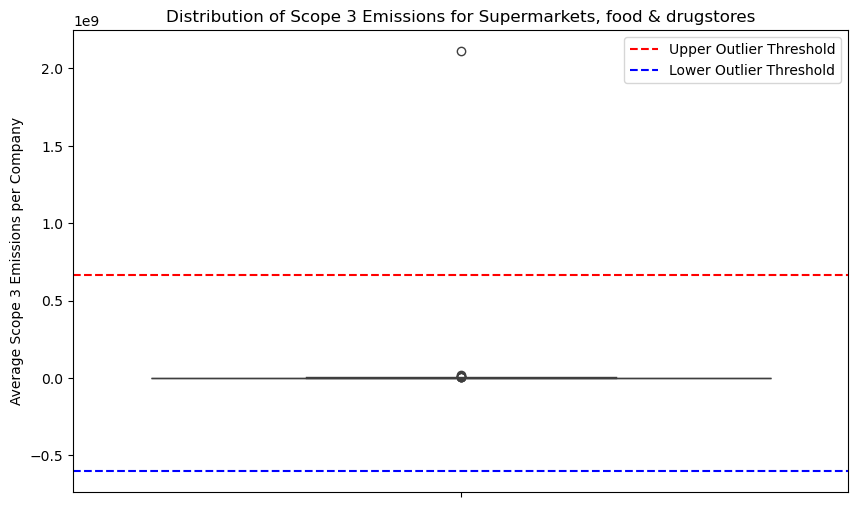

,account_name,Scope_3_emissions_amount
11,Cia. Brasileira de Distribuicao (CBD) Grupo Pa...,2.112058e+09


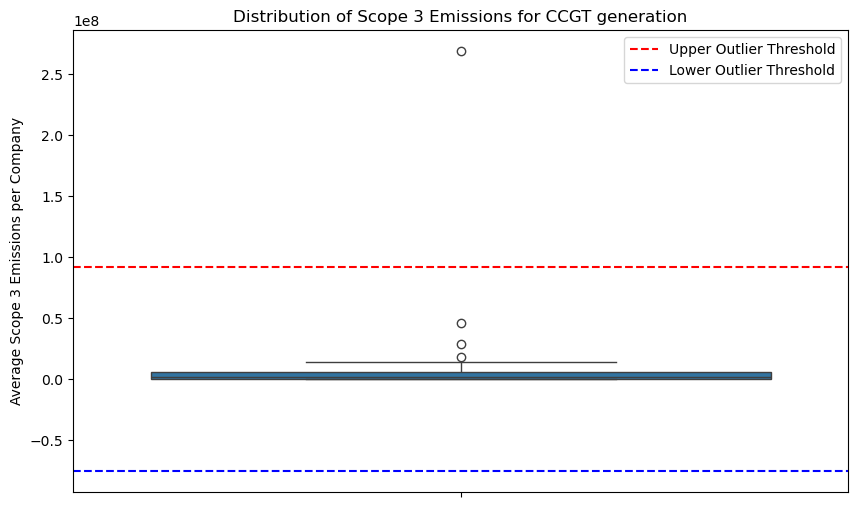

,account_name,Scope_3_emissions_amount
38,Korea District Heating Corp.,2.690380e+08


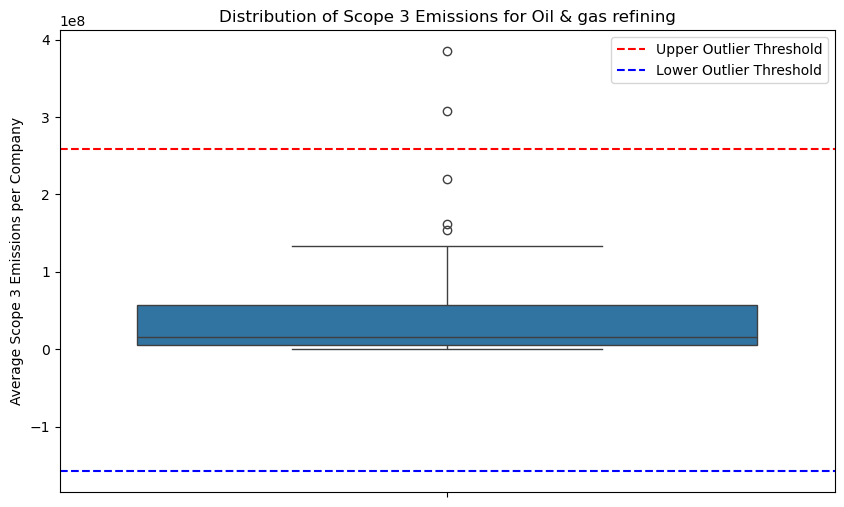

,account_name,Scope_3_emissions_amount
0,BP,384987500.0
27,Petroliam Nasional Berhad (PETRONAS),307610000.0


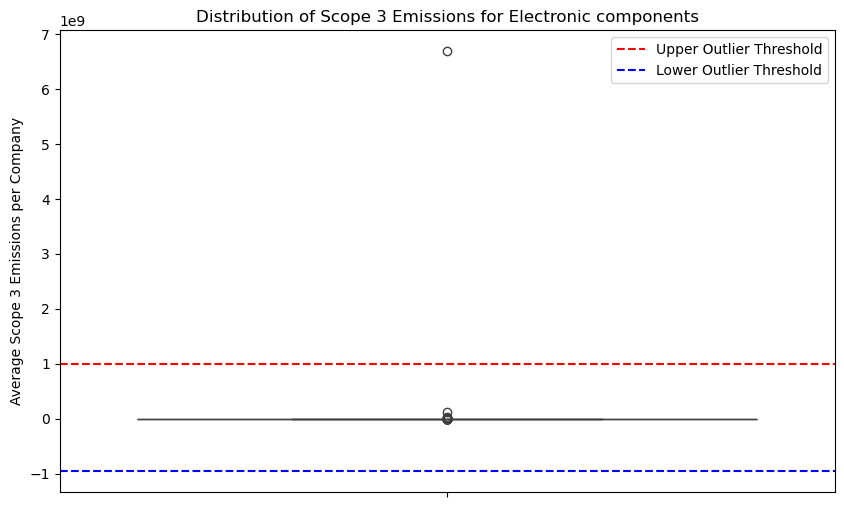

,account_name,Scope_3_emissions_amount
82,Everlight Electronics Co Ltd,6.685695e+09


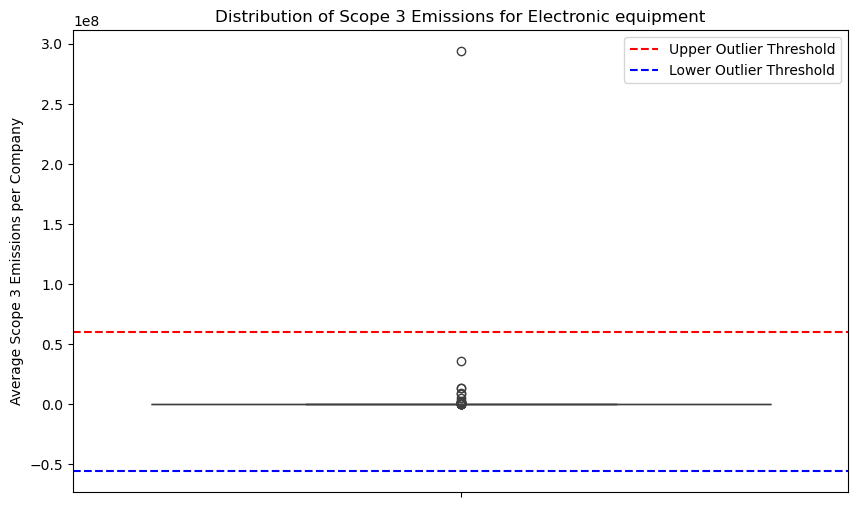

,account_name,Scope_3_emissions_amount
150,VESTEL ELEKTRONIK SANAYI VE TICARET A.S.,2.938952e+08


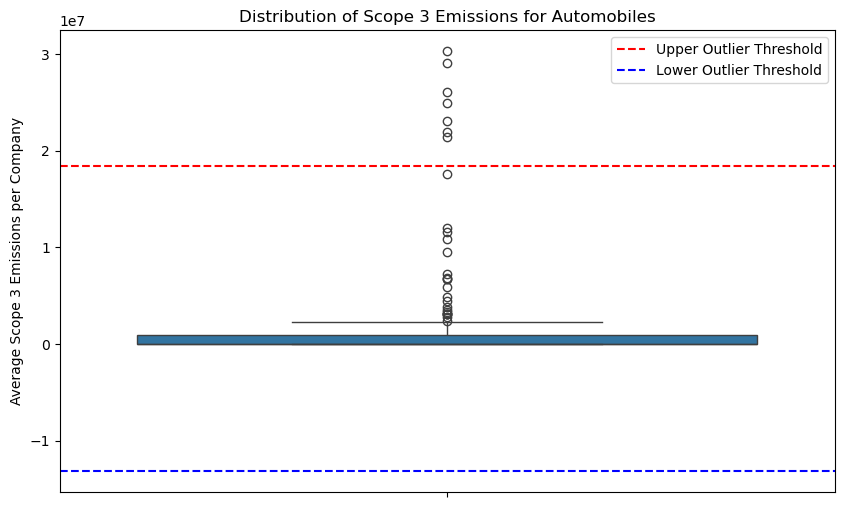

,account_name,Scope_3_emissions_amount
33,Ford Motor Company,2.609772e+07
38,General Motors Company,2.139613e+07
45,"Honda Motor Co., Ltd.",2.303328e+07
46,Honda Motor Company,2.195185e+07
81,Navistar International Corporation,2.909108e+07
111,Toyota Motor Corporation,2.489943e+07
116,Volkswagen AG,3.028623e+07


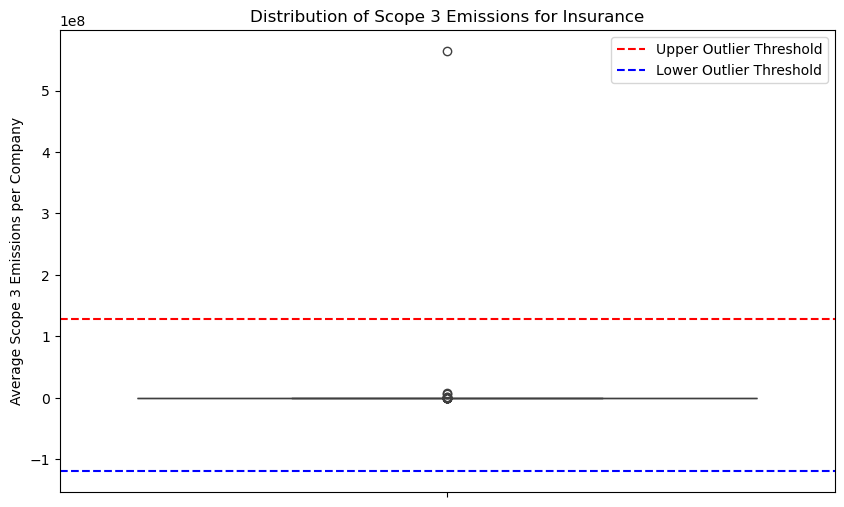

,account_name,Scope_3_emissions_amount
61,Legal and General,5.641278e+08


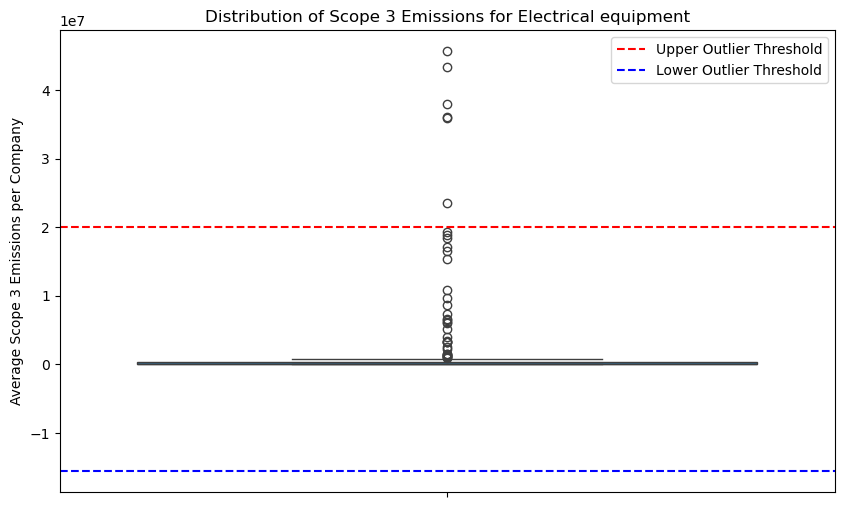

,account_name,Scope_3_emissions_amount
24,Carrier Global Corp,4.331617e+07
42,Emerson Electric Co.,3.605001e+07
63,Hellenic Cables S.A.,2.358389e+07
65,Hitachi Energy,4.565905e+07
154,Signify N.V.,3.794981e+07
168,Trane Technologies,3.597065e+07


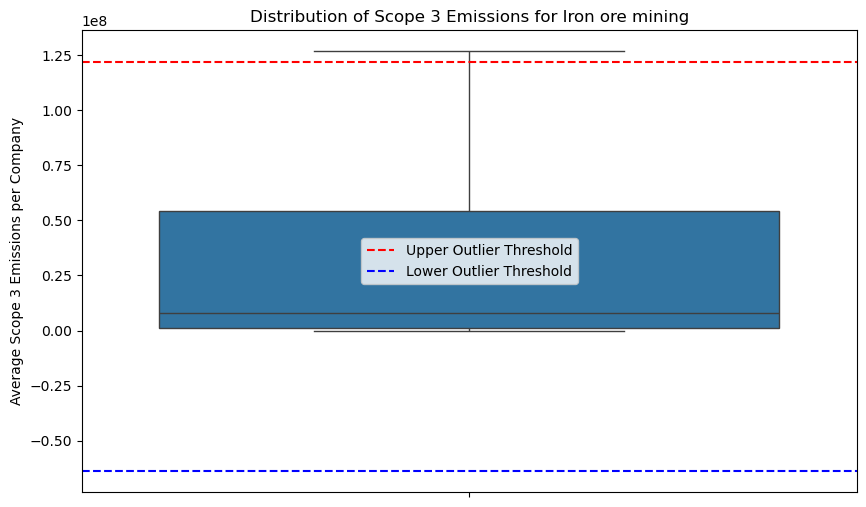

,account_name,Scope_3_emissions_amount
2,BHP Billiton,126840187.5


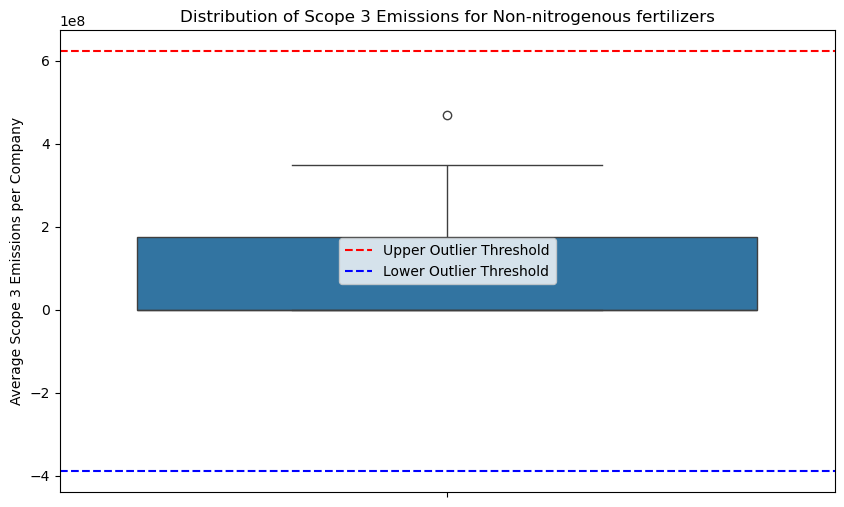

,account_name,Scope_3_emissions_amount


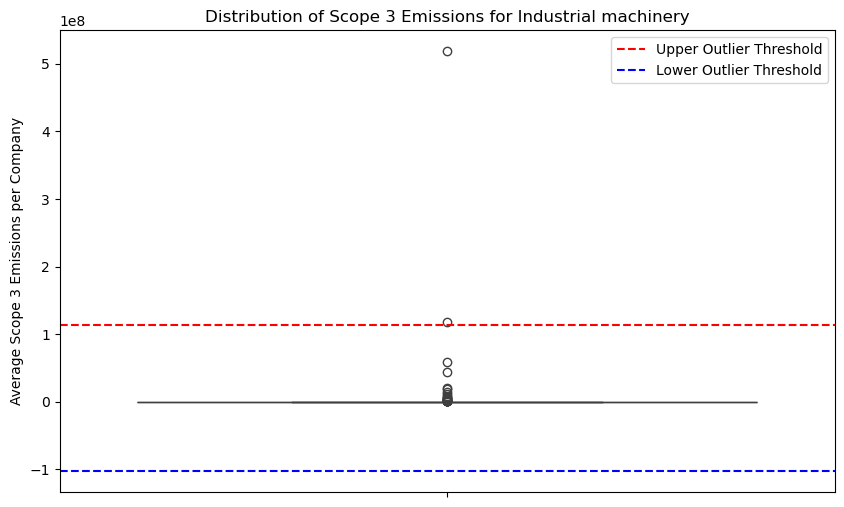

,account_name,Scope_3_emissions_amount
32,GE Aerospace,1.183387e+08
117,Siemens Energy AG,5.184949e+08


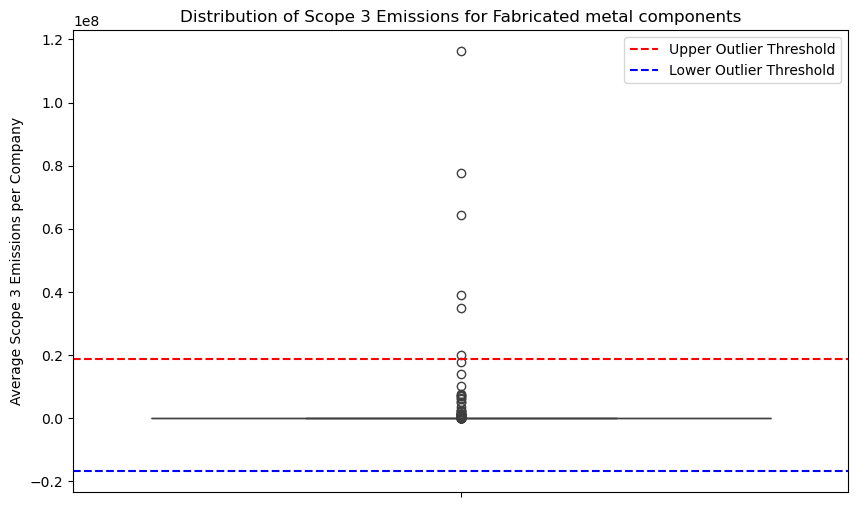

,account_name,Scope_3_emissions_amount
83,Corning Incorporated,1.163047e+08
261,Kongsberg Automotive Holding ASA,1.997907e+07
306,Magna International Inc.,7.772066e+07
358,"PANDROL USA, LP",3.894689e+07
390,Robert Bosch GmbH,6.433237e+07
437,Shanghai Essenway Technology Development Co Ltd,3.504584e+07


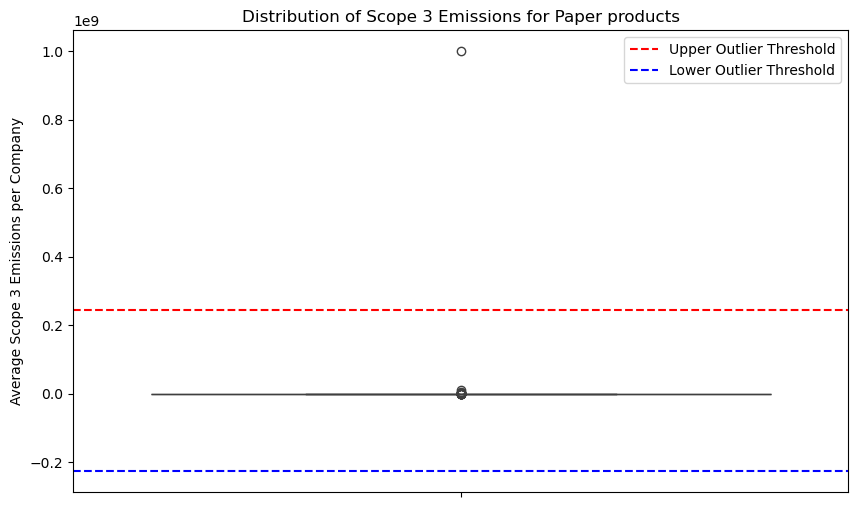

,account_name,Scope_3_emissions_amount
17,CTY TNHH MTV CHAMPION LEE GROUP VIET NAM,1.000000e+09


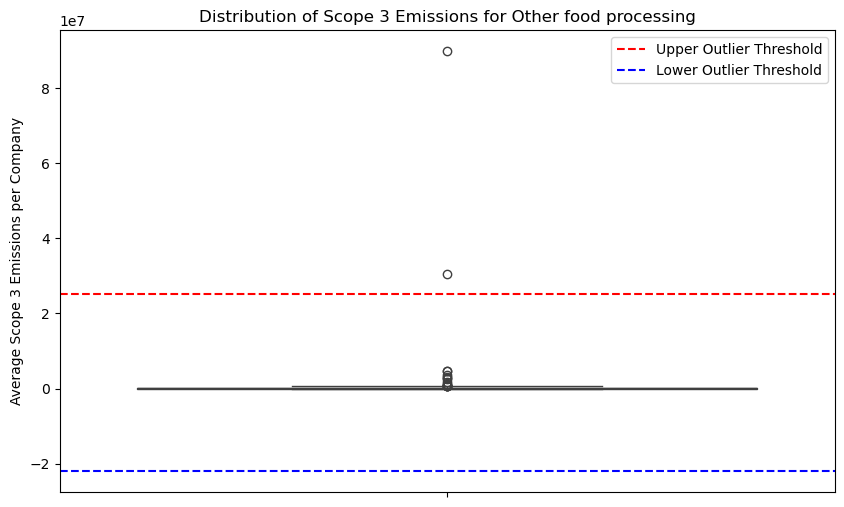

,account_name,Scope_3_emissions_amount
20,Campbell Soup Company,8.977215e+07
42,INDUSTRIAS COR SA DE CV,3.056967e+07


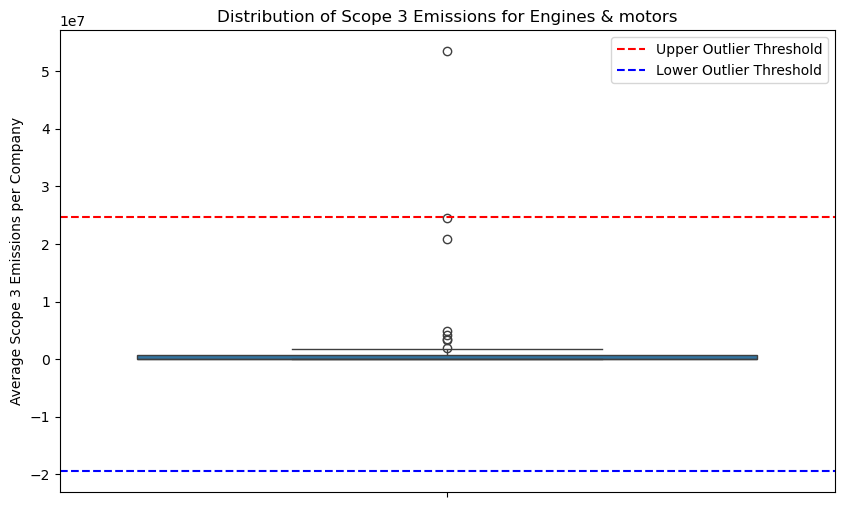

,account_name,Scope_3_emissions_amount
7,Cummins Inc.,5.348450e+07


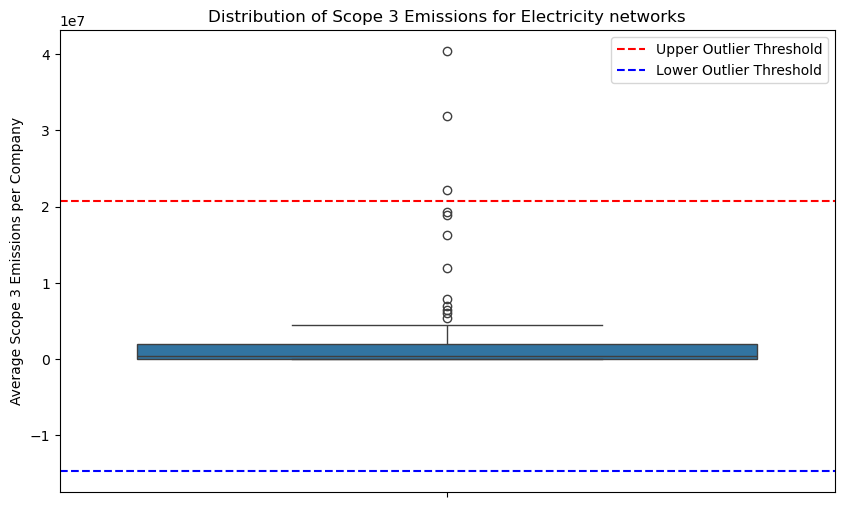

,account_name,Scope_3_emissions_amount
49,Korea Electric Power Corp,4.040301e+07
50,Korea South-East Power,3.191163e+07
66,Sempra,2.221644e+07


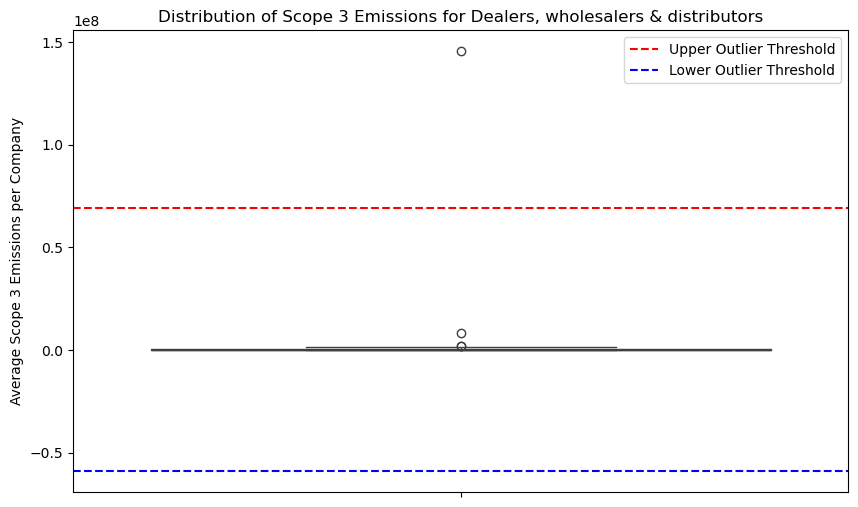

,account_name,Scope_3_emissions_amount
25,Sojitz Corporation,1.456166e+08


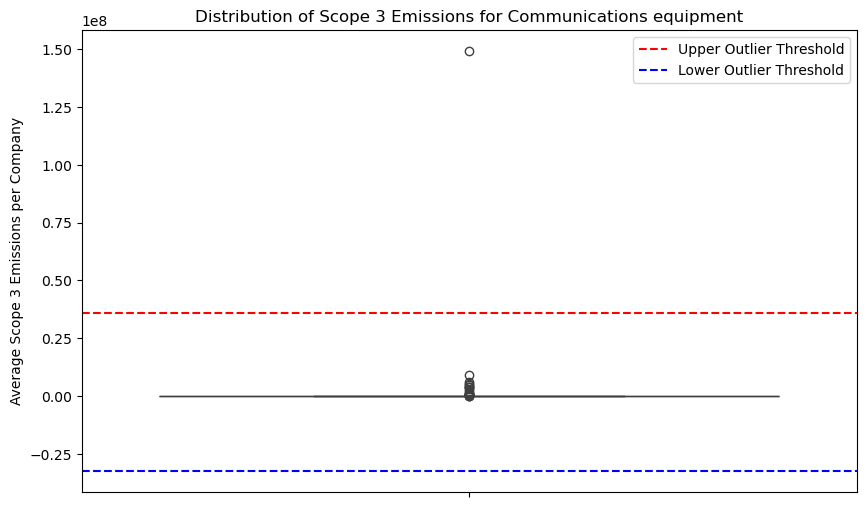

,account_name,Scope_3_emissions_amount
104,TPV Technology Limited,1.491828e+08


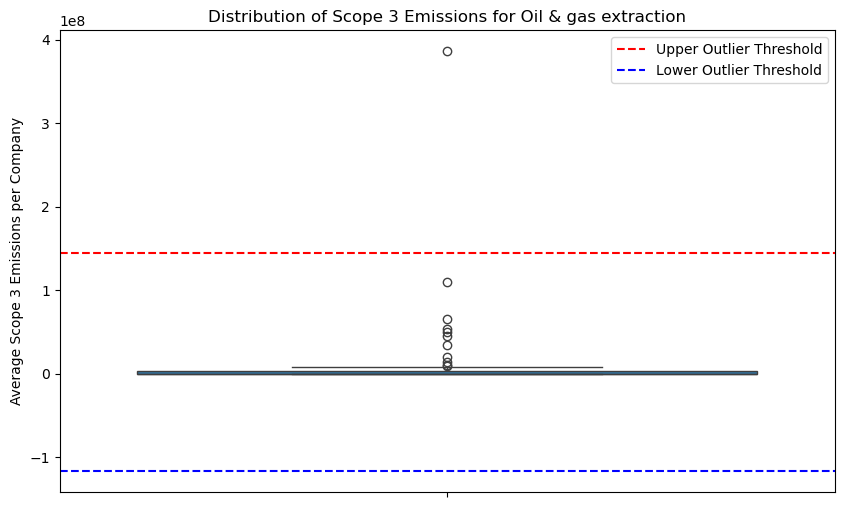

,account_name,Scope_3_emissions_amount
48,Pemex – Petroleos Mexicanos,386330409.0


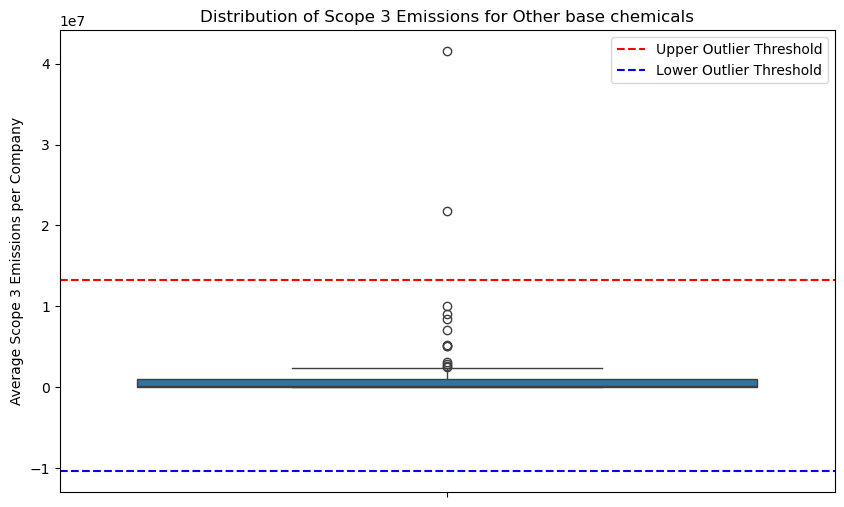

,account_name,Scope_3_emissions_amount
78,Sabará Participações Ltda,4.155169e+07
85,Sumitomo Bakelite Company Limited,2.173005e+07


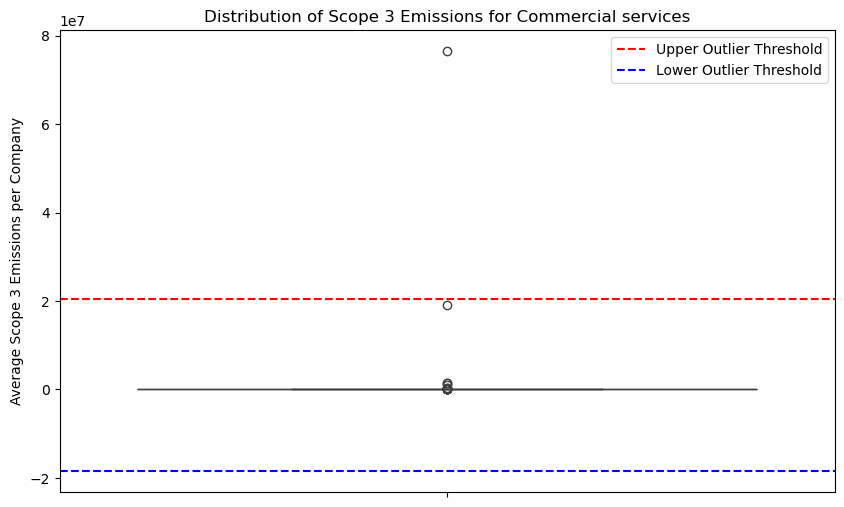

,account_name,Scope_3_emissions_amount
101,thyssenkrupp AG,7.652211e+07


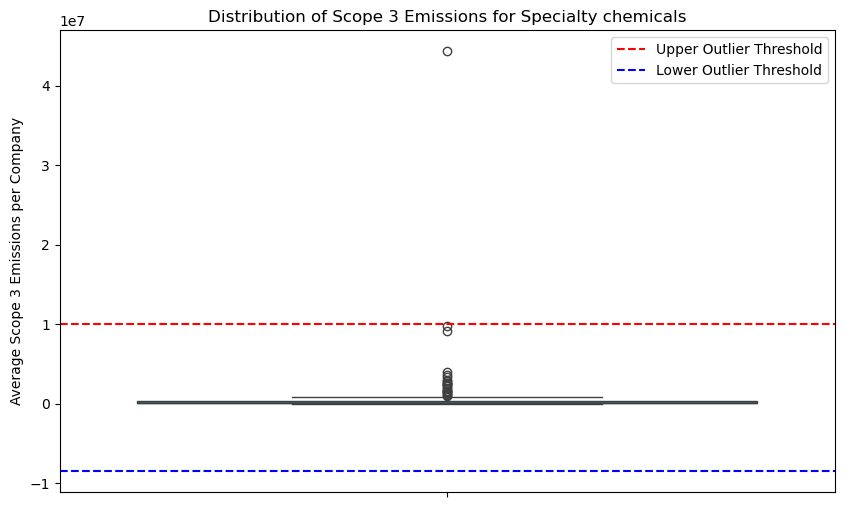

,account_name,Scope_3_emissions_amount
10,Ashland Global Holdings Inc,4.434760e+07


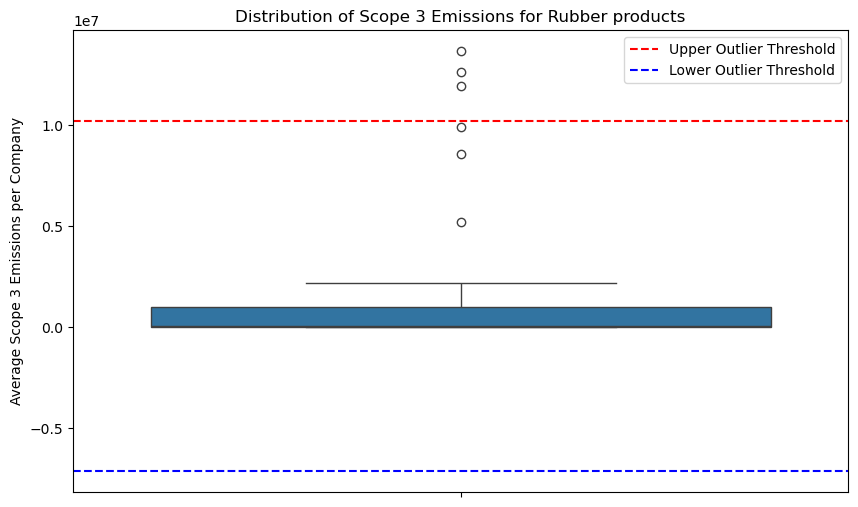

,account_name,Scope_3_emissions_amount
17,Goodyear Tire & Rubber Company,1.364879e+07
28,Michelin,1.260526e+07
40,The Goodyear Tire & Rubber Company,1.192886e+07


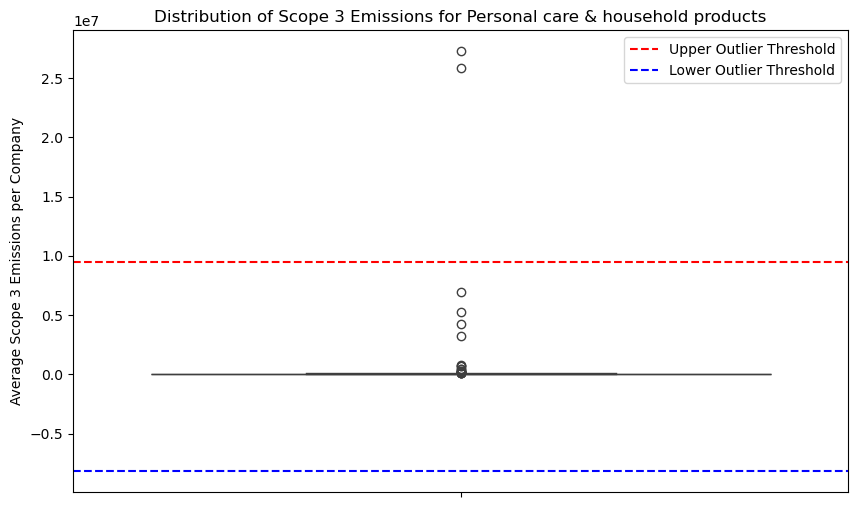

,account_name,Scope_3_emissions_amount
10,C CARE LLC,2.581950e+07
94,Procter & Gamble Company,2.727249e+07


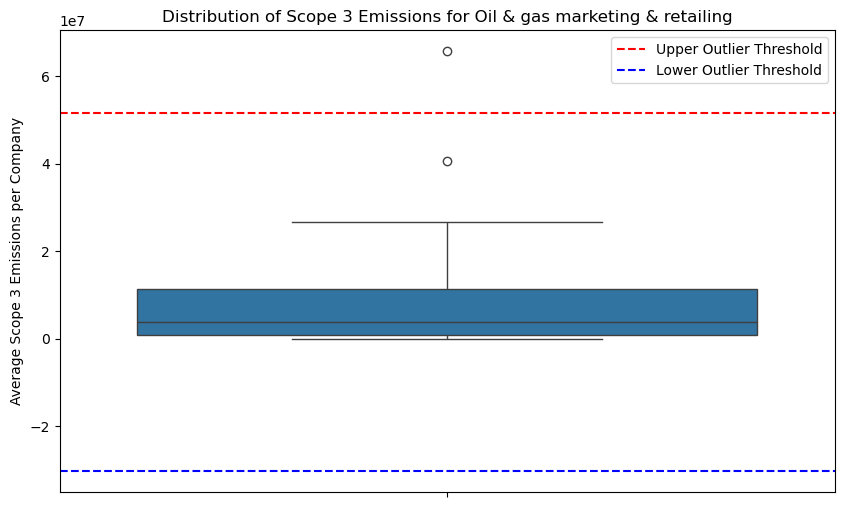

,account_name,Scope_3_emissions_amount
9,PTT Oil and Retail Business PCL,65762718.0


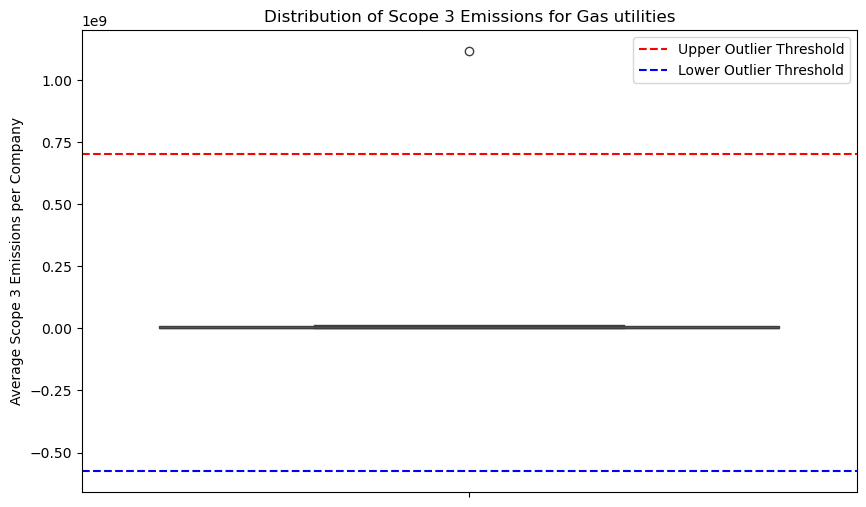

,account_name,Scope_3_emissions_amount
14,PJSC Gazprom,1.116519e+09


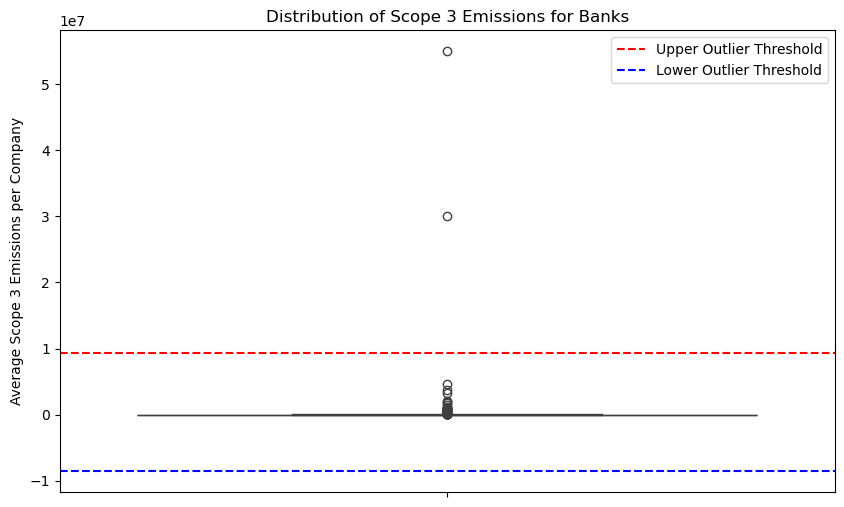

,account_name,Scope_3_emissions_amount
98,Credit Agricole,3.002069e+07
140,HSBC Holdings plc,5.500648e+07


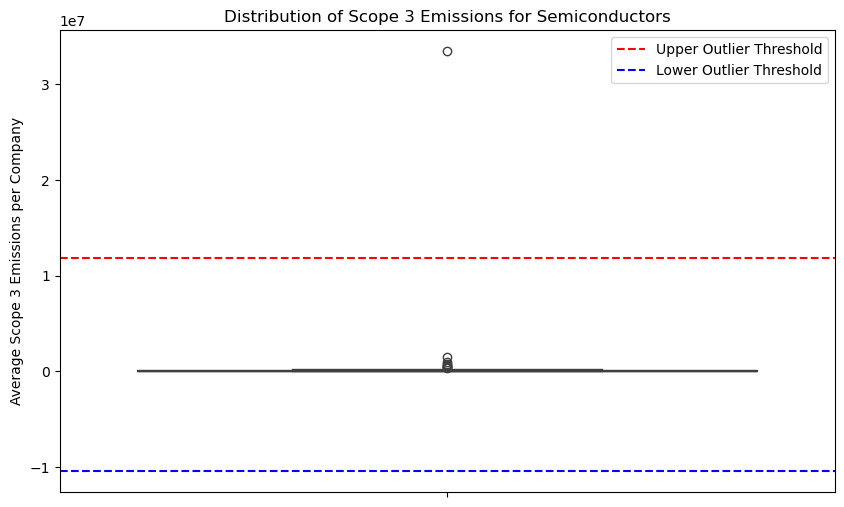

,account_name,Scope_3_emissions_amount
40,Siliconware Precision Industries Co.,3.344142e+07


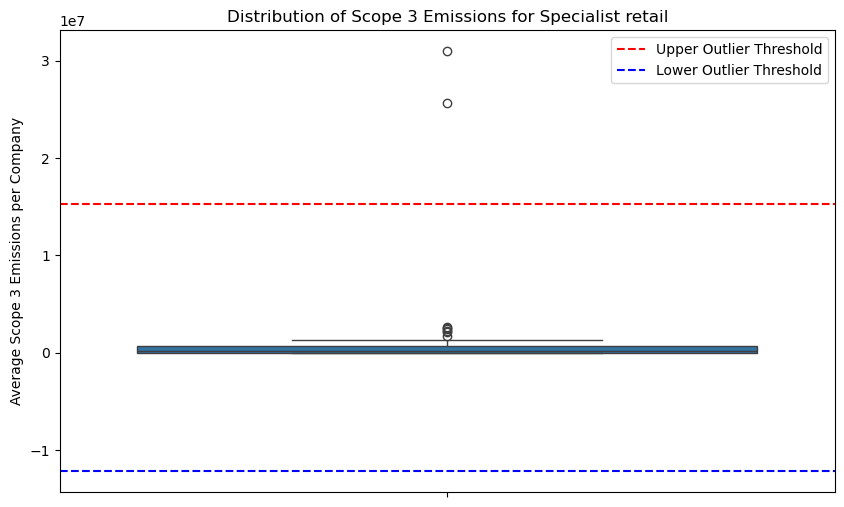

,account_name,Scope_3_emissions_amount
24,"Lowe's Companies, Inc.",2.565031e+07
41,"The Home Depot, Inc.",3.097165e+07


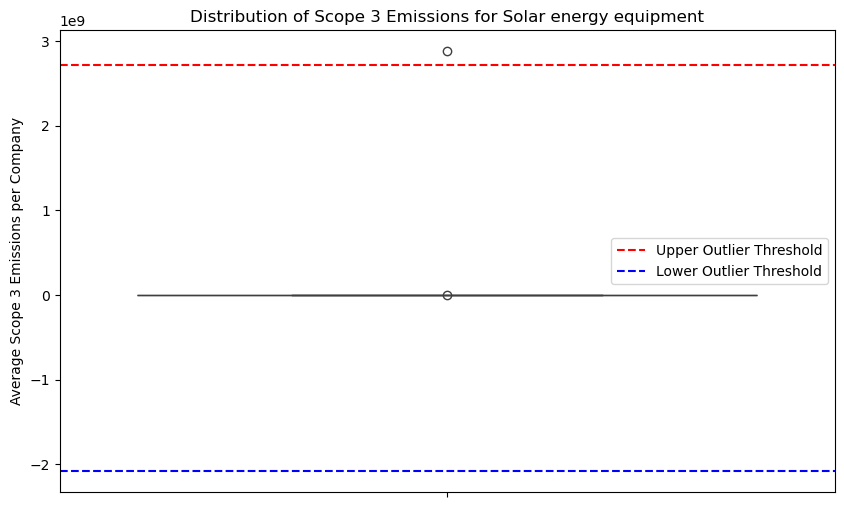

,account_name,Scope_3_emissions_amount
1,DADU PRECISION FASTENERS PVT LTD,2.880000e+09


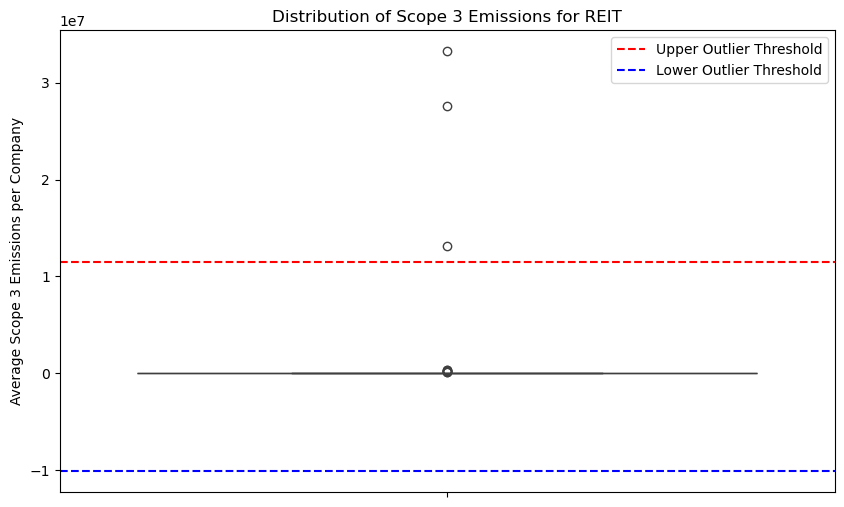

,account_name,Scope_3_emissions_amount
51,Hudson Pacific Properties,2.756668e+07
61,Kilroy Realty,3.324928e+07
67,Mercialys,1.312499e+07


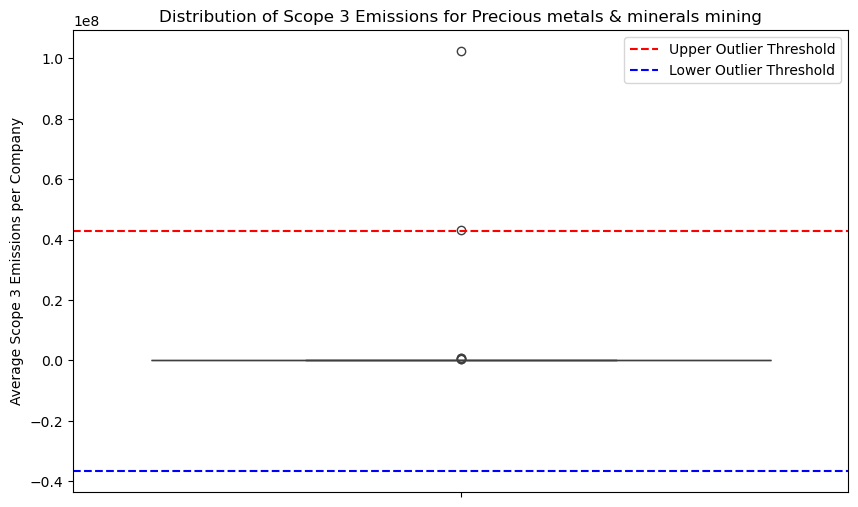

,account_name,Scope_3_emissions_amount
1,Agnico-Eagle Mines Limited,4.329009e+07
4,Alumeco,1.024131e+08


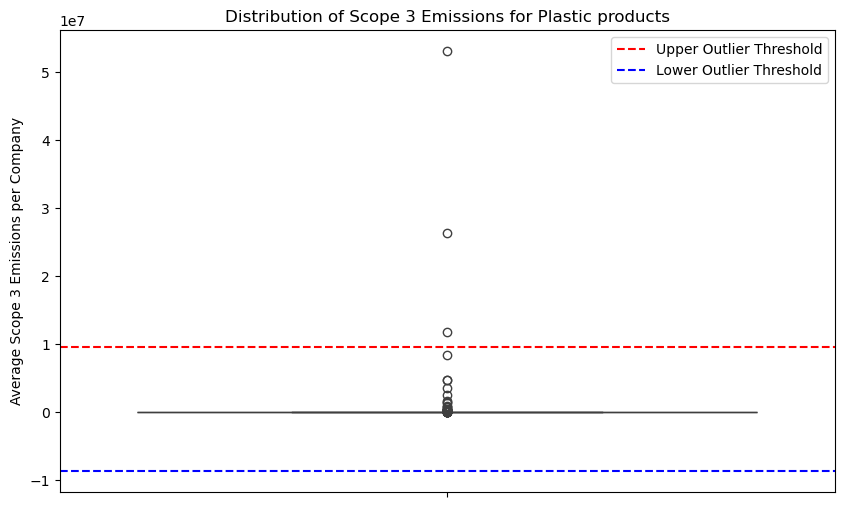

,account_name,Scope_3_emissions_amount
60,FLOREMPAQUE CIA LTDA,2.634407e+07
65,FU YU,5.307868e+07
240,Sonoco Products Company,1.180476e+07


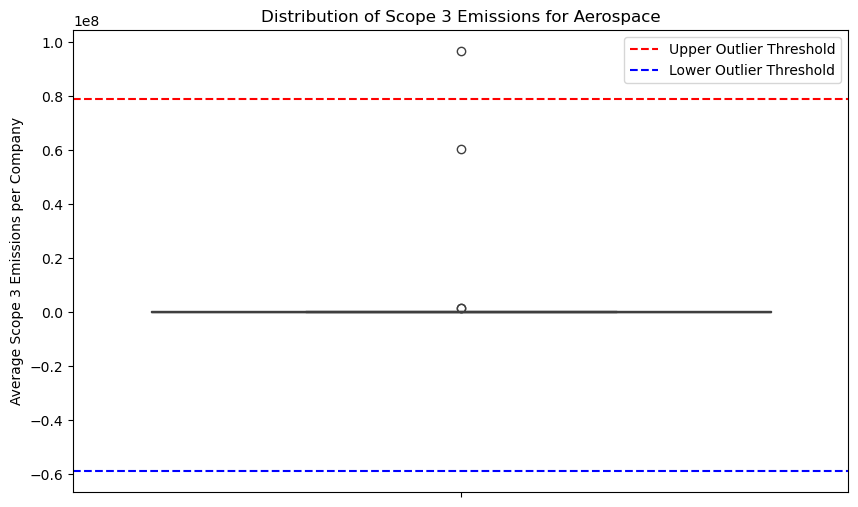

,account_name,Scope_3_emissions_amount
3,Airbus SE,9.672532e+07


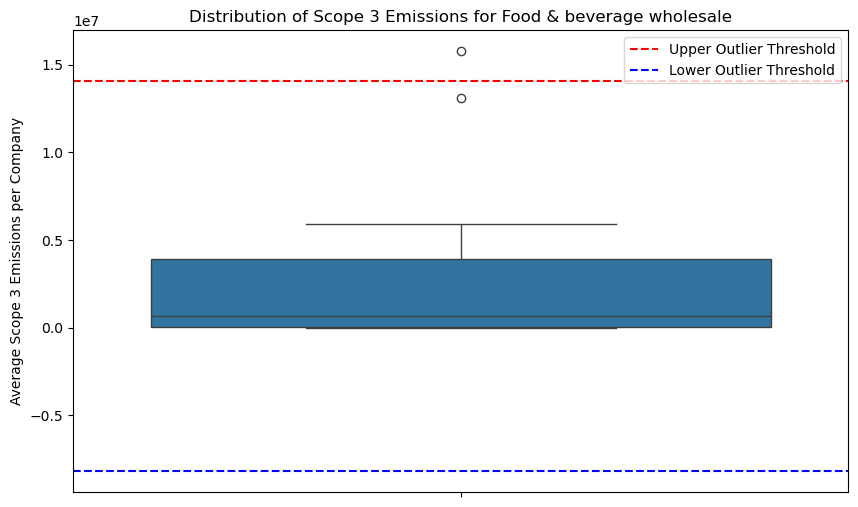

,account_name,Scope_3_emissions_amount
5,Cargill,15766730.7


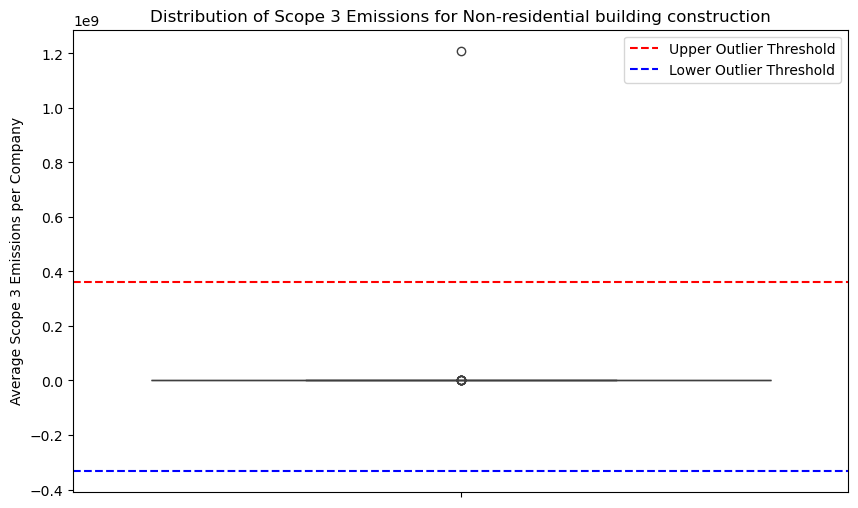

,account_name,Scope_3_emissions_amount
61,TORCON,1.210304e+09


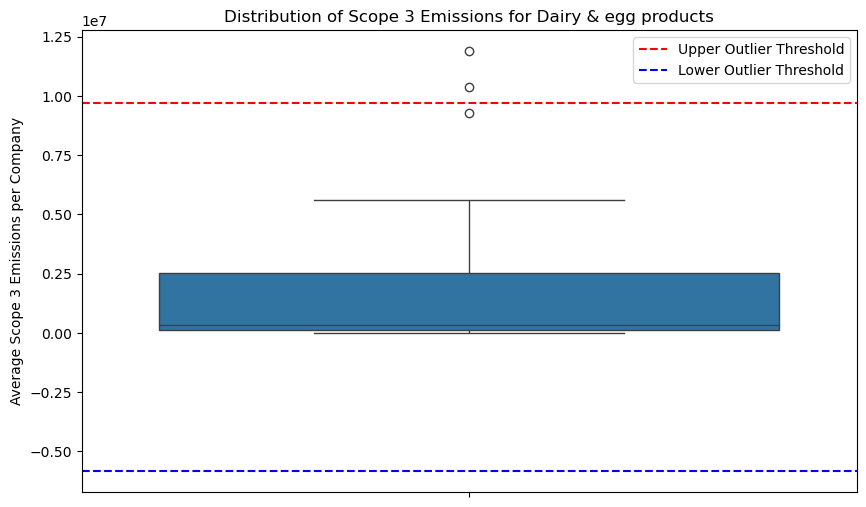

,account_name,Scope_3_emissions_amount
28,Royal Friesland Campina,1.189257e+07
31,Saputo Inc.,1.038458e+07


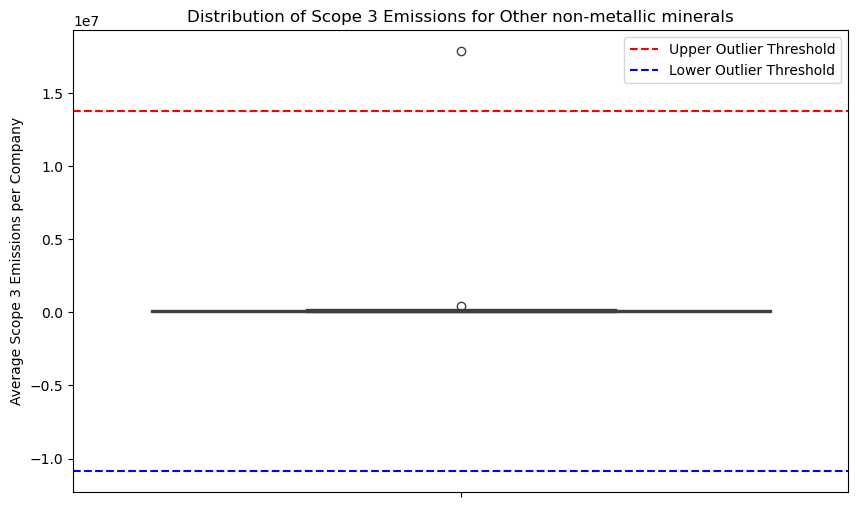

,account_name,Scope_3_emissions_amount
0,Anglo American,1.784876e+07


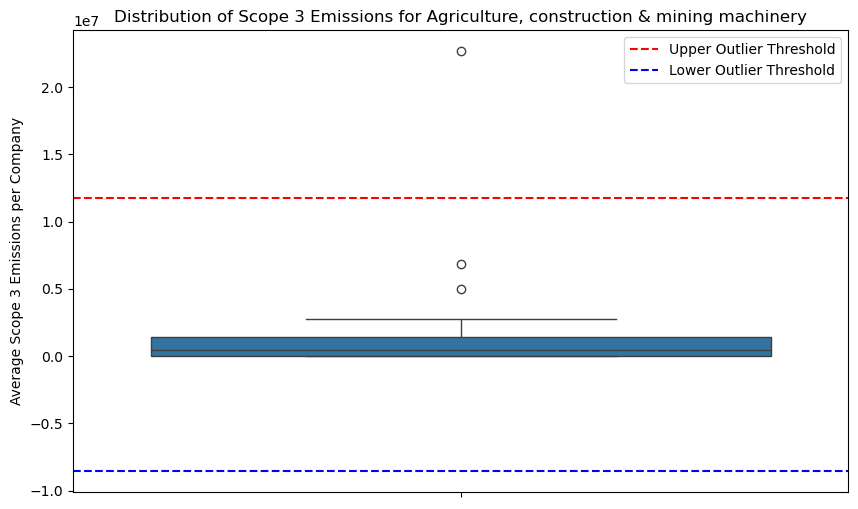

,account_name,Scope_3_emissions_amount
8,FLSmidth & Co. A/S,2.266982e+07


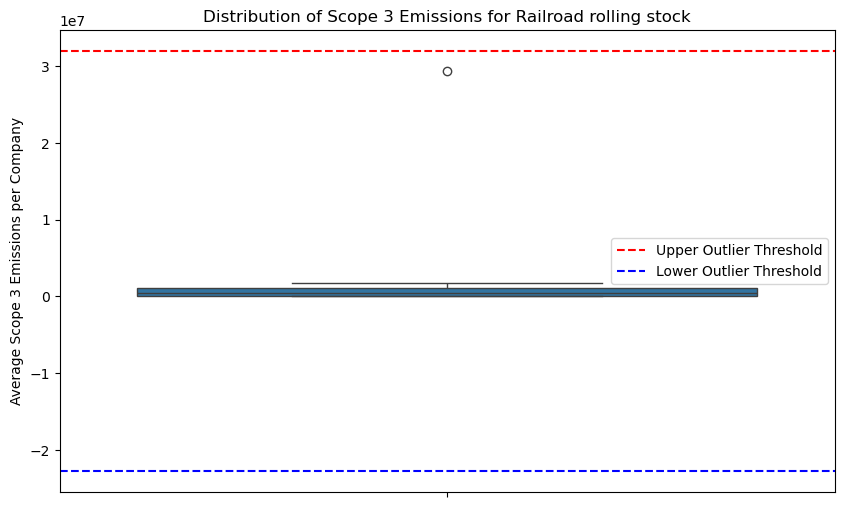

,account_name,Scope_3_emissions_amount


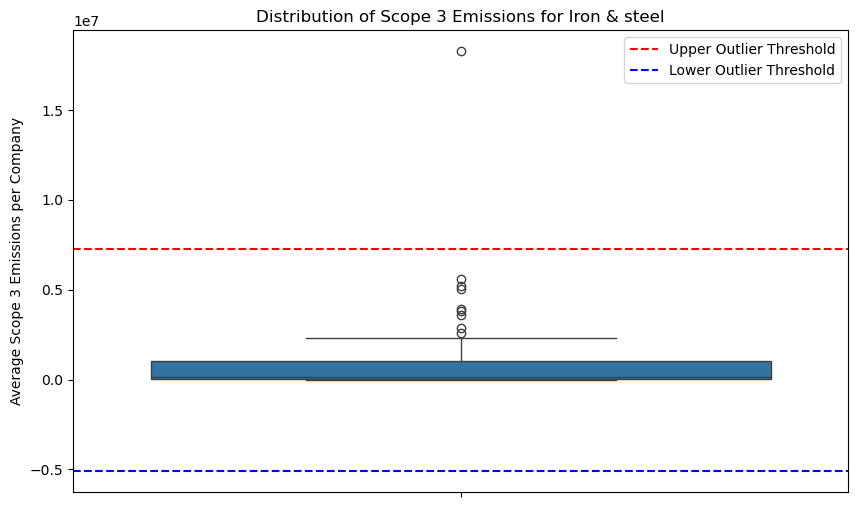

,account_name,Scope_3_emissions_amount
21,HOLDING COMPANY METALLOINVEST AO,1.827091e+07


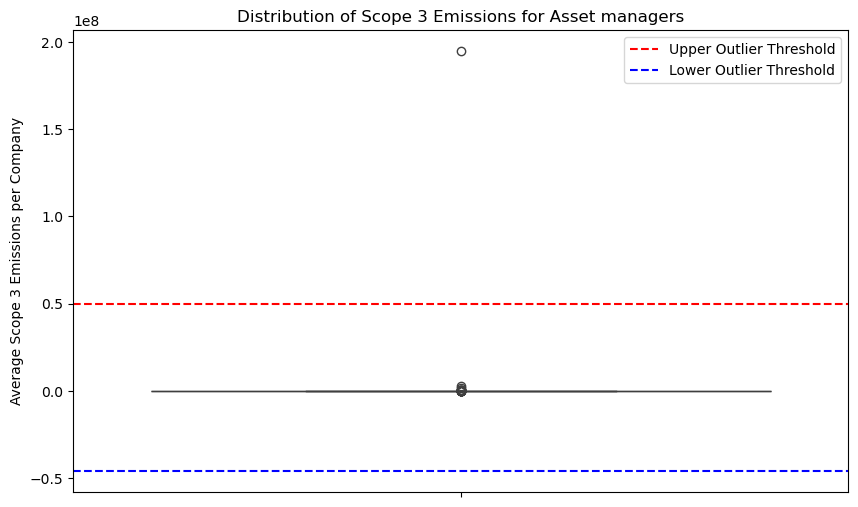

,account_name,Scope_3_emissions_amount
1,ALELO S.A,1.946598e+08


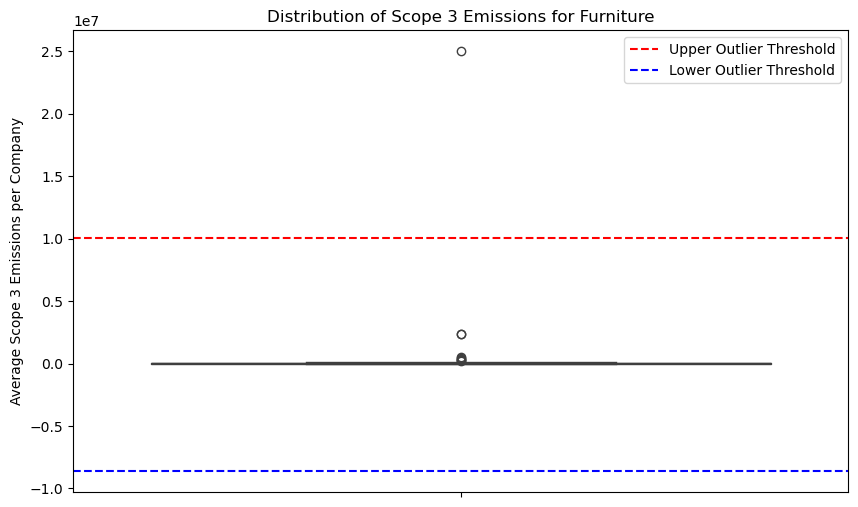

,account_name,Scope_3_emissions_amount
10,HNI Corporation,2.501186e+07


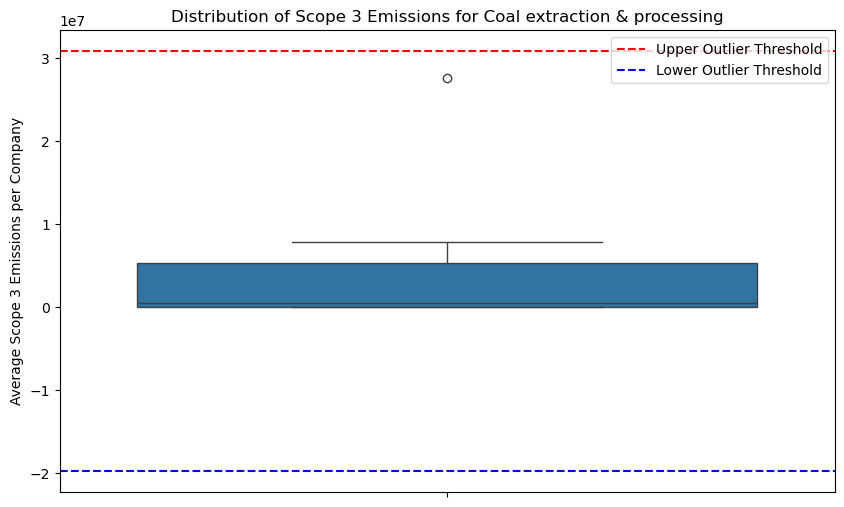

,account_name,Scope_3_emissions_amount


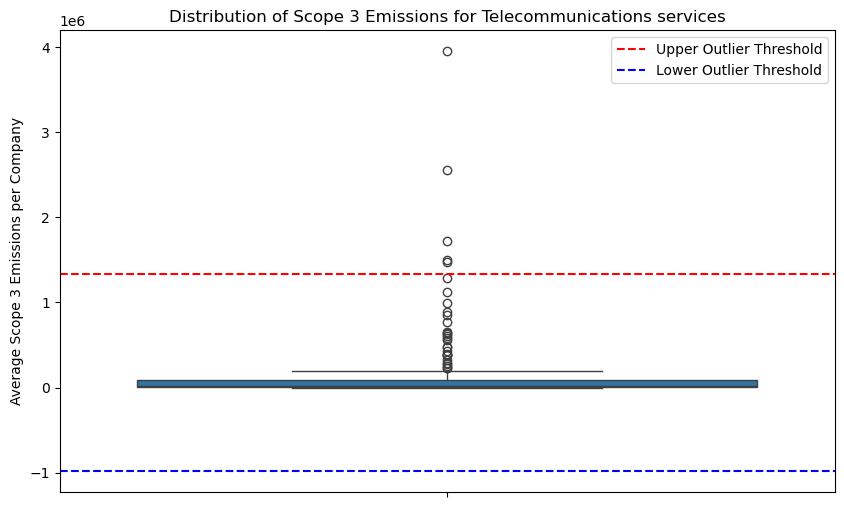

,account_name,Scope_3_emissions_amount
23,CenturyLink,3.949436e+06
24,China Mobile,1.718890e+06
43,GTT COMMUNICATIONS INC,1.479668e+06
80,Nippon Telegraph & Telephone Corporation (NTT),1.501842e+06
150,Verizon Communications Inc.,2.551644e+06


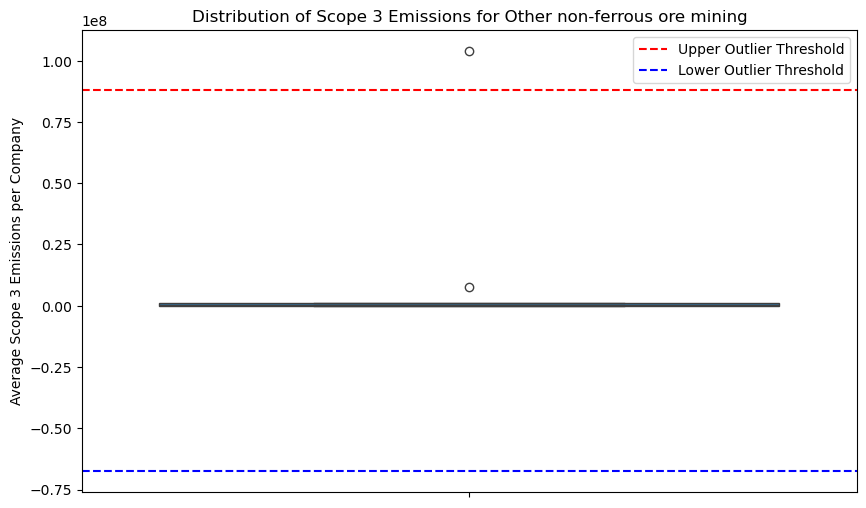

,account_name,Scope_3_emissions_amount
4,HudBay Minerals Inc.,1.039924e+08


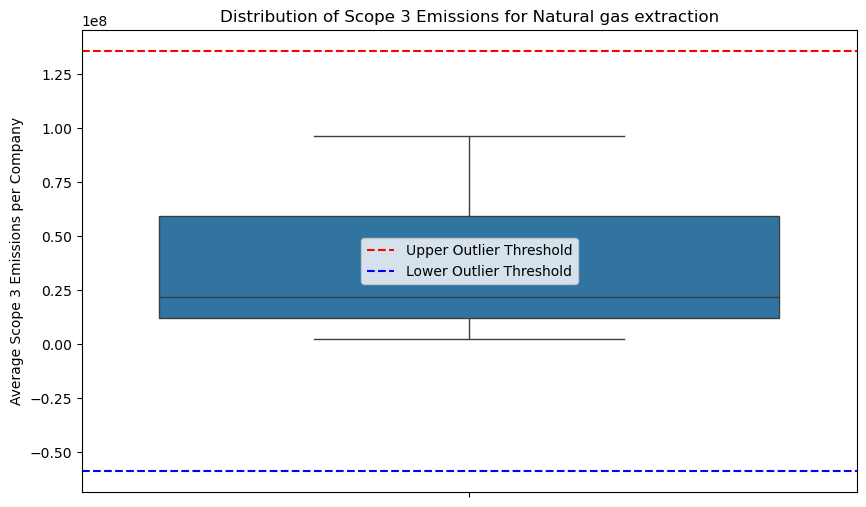

,account_name,Scope_3_emissions_amount


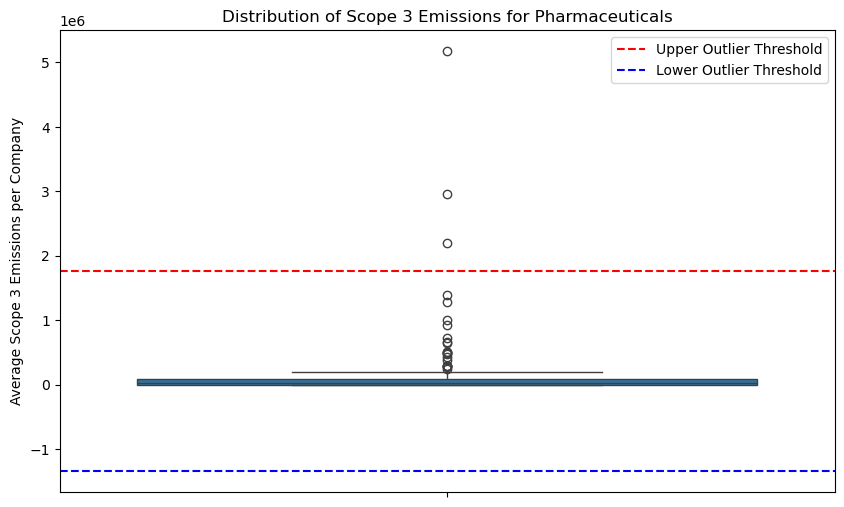

,account_name,Scope_3_emissions_amount
21,Bayer AG,2.194419e+06
23,Bristol-Myers Squibb,5.174519e+06
90,"SINOCHEM GROUP - NINGBO NUOBAI - LINHAI, ZHEJI...",2.959651e+06


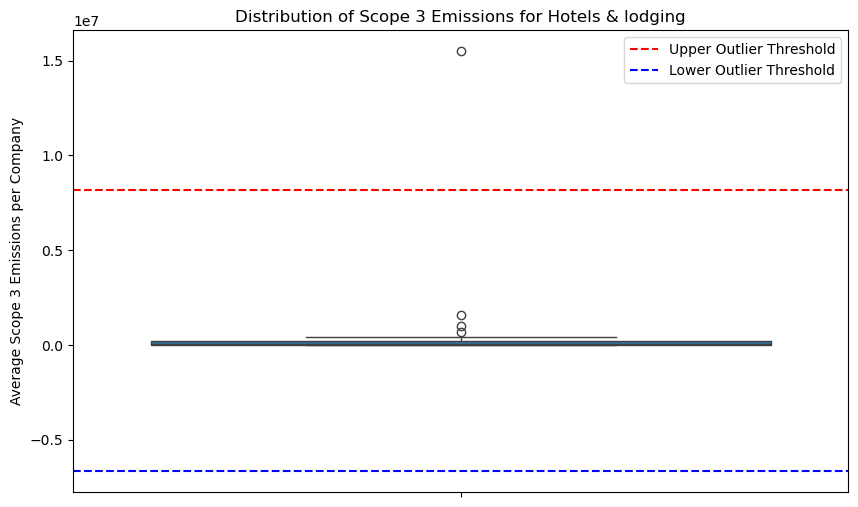

,account_name,Scope_3_emissions_amount
13,NH Hotel Group,1.550363e+07


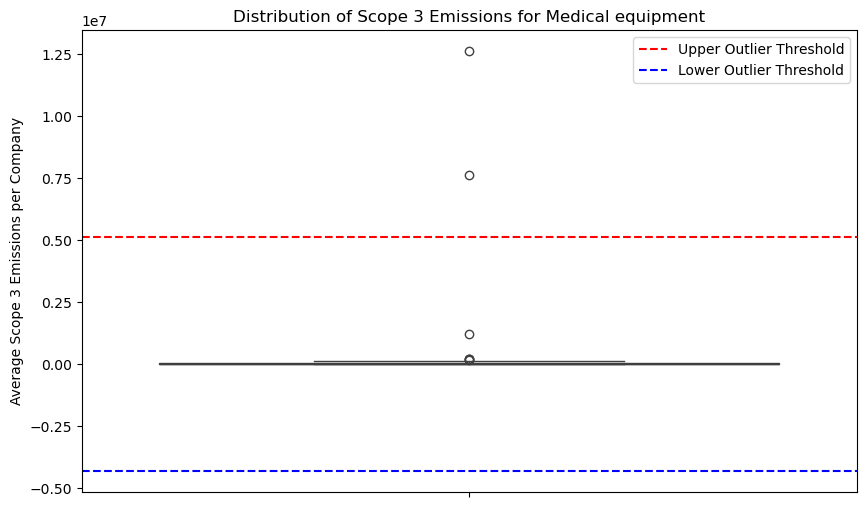

,account_name,Scope_3_emissions_amount
25,Jiangsu Zhongjin Matai Medicinal Packaging Co....,7.633059e+06
26,Koninklijke Philips NV,1.262947e+07


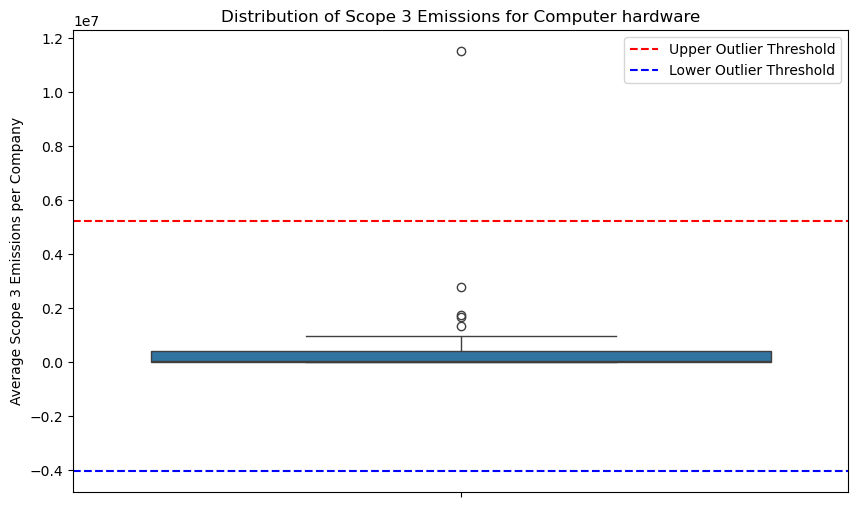

,account_name,Scope_3_emissions_amount
1,ASUSTeK Computer Inc,1.151617e+07


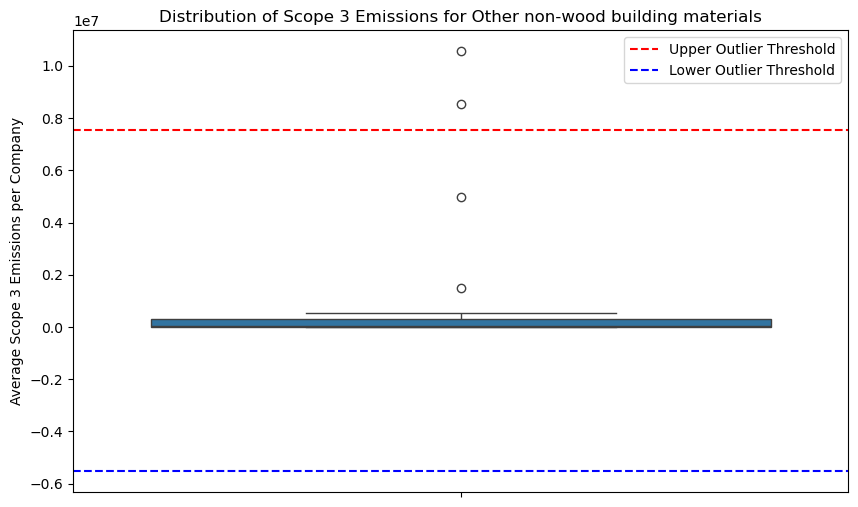

,account_name,Scope_3_emissions_amount
10,LIXIL Corporation,1.056113e+07
22,SAIFU CHEMICAL DEVELOPMENT CO,8.537671e+06


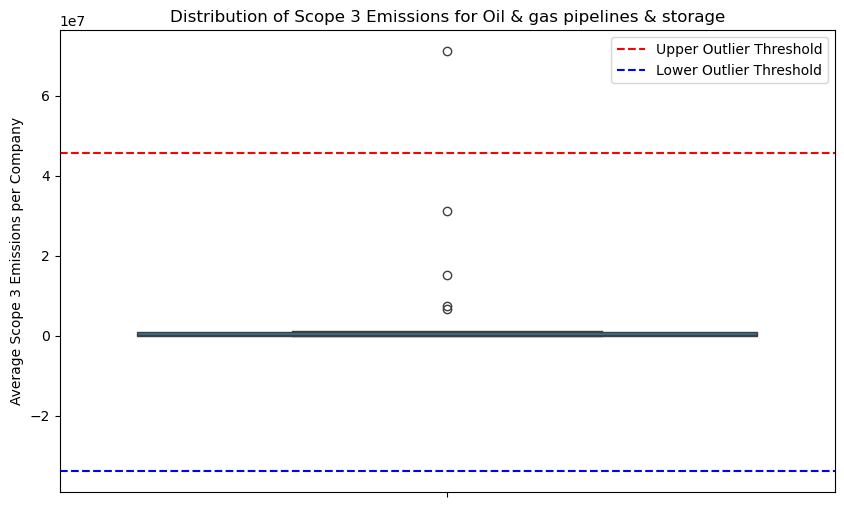

,account_name,Scope_3_emissions_amount
5,Equitrans Midstream,7.108742e+07


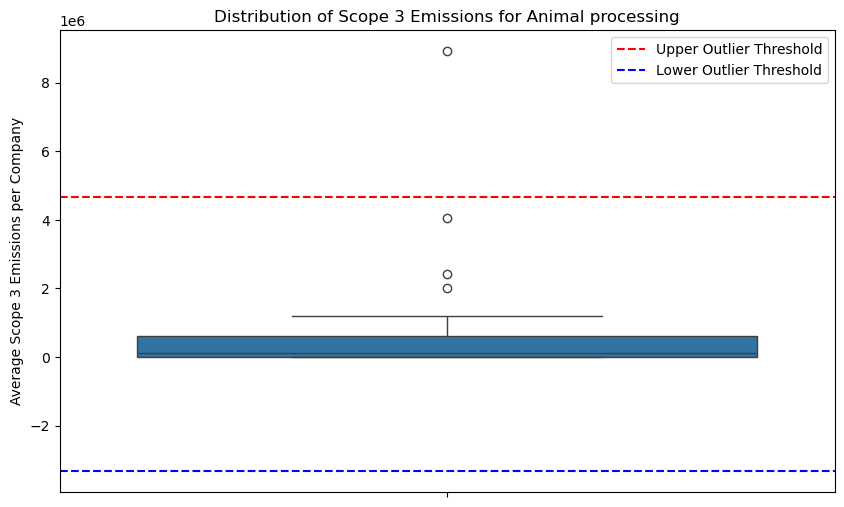

,account_name,Scope_3_emissions_amount
2,BRF S.A,8.923725e+06


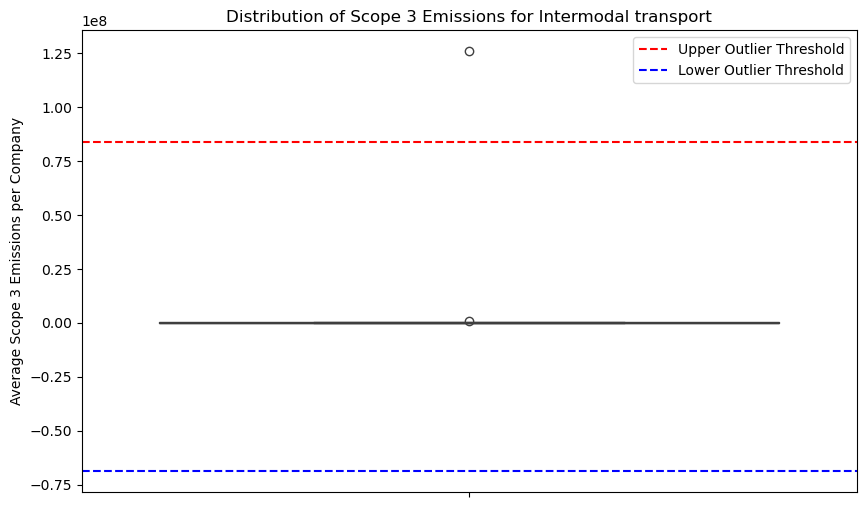

,account_name,Scope_3_emissions_amount
6,"GINGER LOGISTICS INT`L CO.,LTD",1.259310e+08


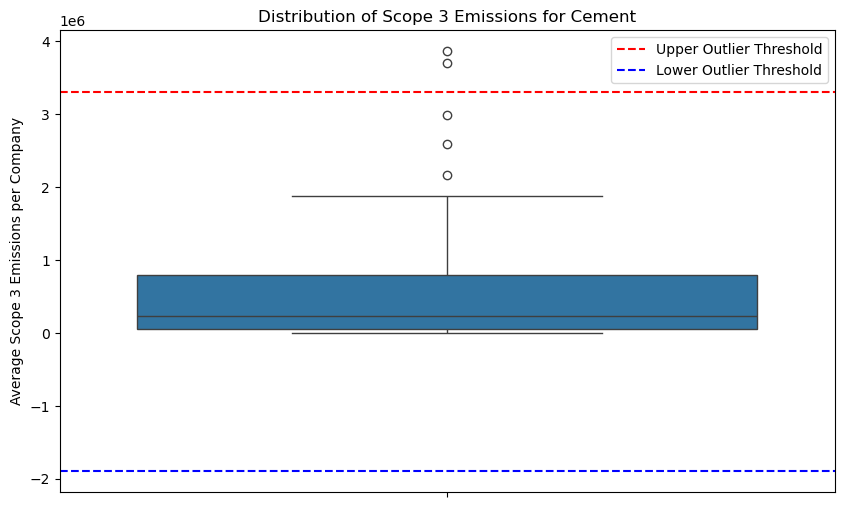

,account_name,Scope_3_emissions_amount
0,ACC,3.708645e+06
21,Holcim Ltd.,3.865825e+06


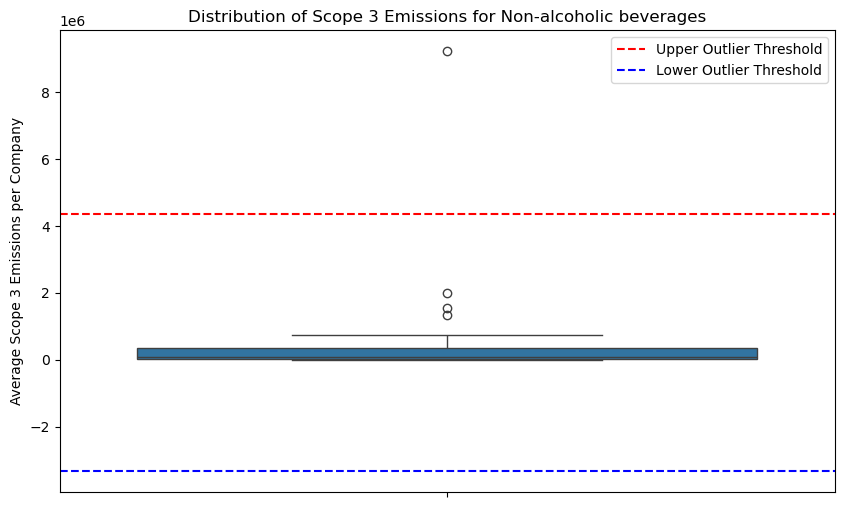

,account_name,Scope_3_emissions_amount
34,The Coca-Cola Company,9.218150e+06


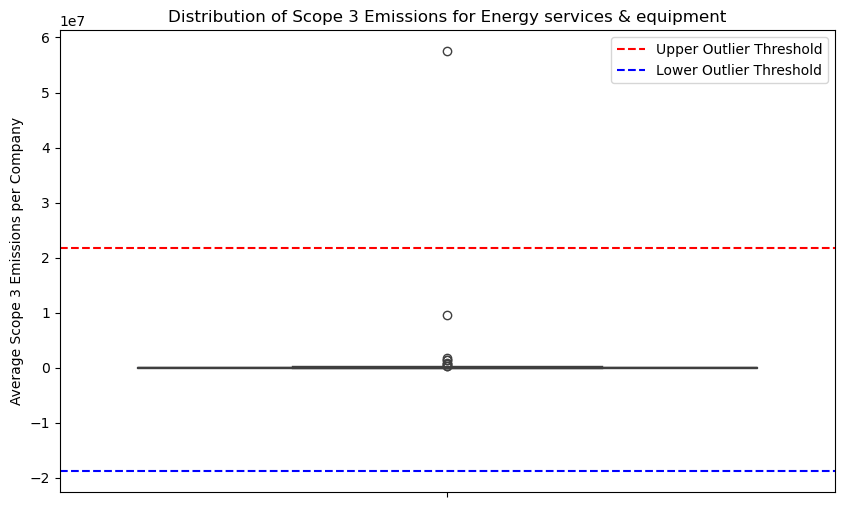

,account_name,Scope_3_emissions_amount
31,SBM Offshore,57519365.2


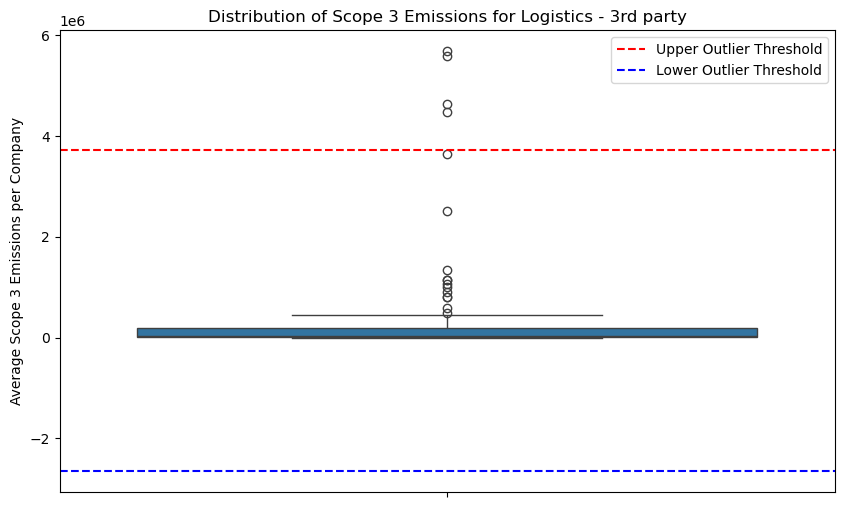

,account_name,Scope_3_emissions_amount
18,DHL Group,5.685000e+06
21,Deutsche Post DHL Group,5.591667e+06
39,"Landstar System, Inc.",4.480582e+06
49,Panalpina Welttransport Holding AG,4.638983e+06


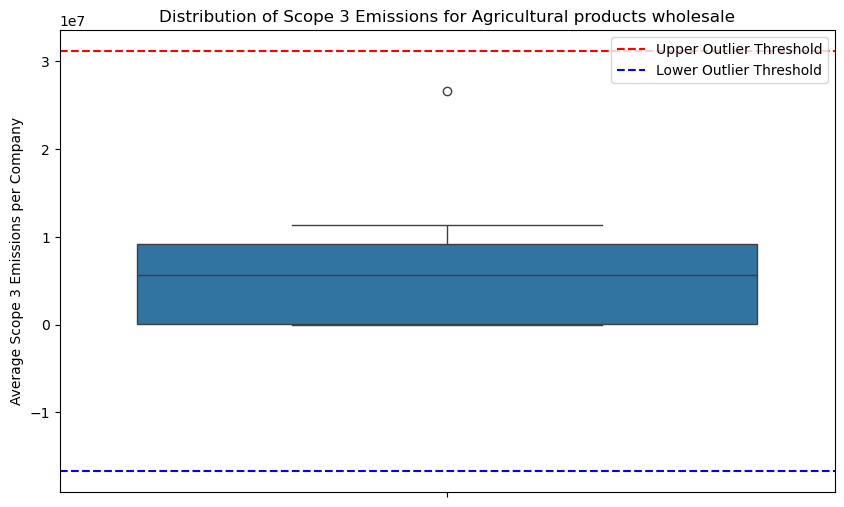

,account_name,Scope_3_emissions_amount


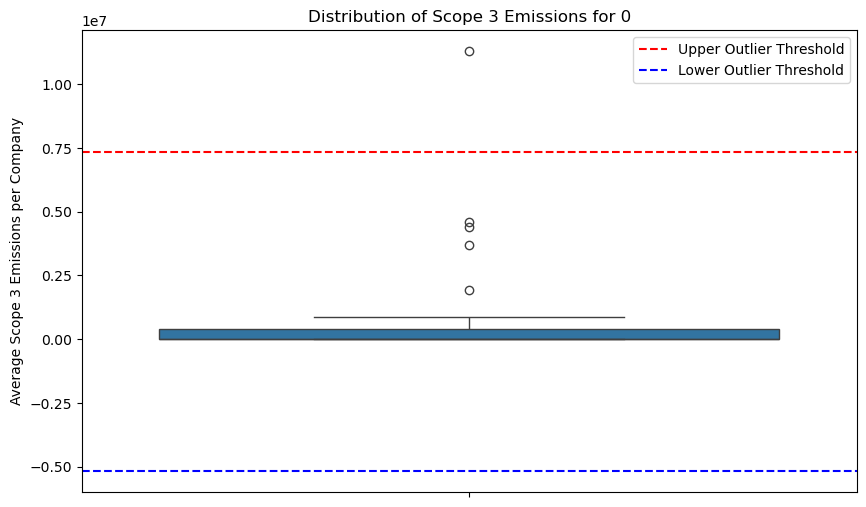

,account_name,Scope_3_emissions_amount
11,Ivanhoe Mines,1.130650e+07


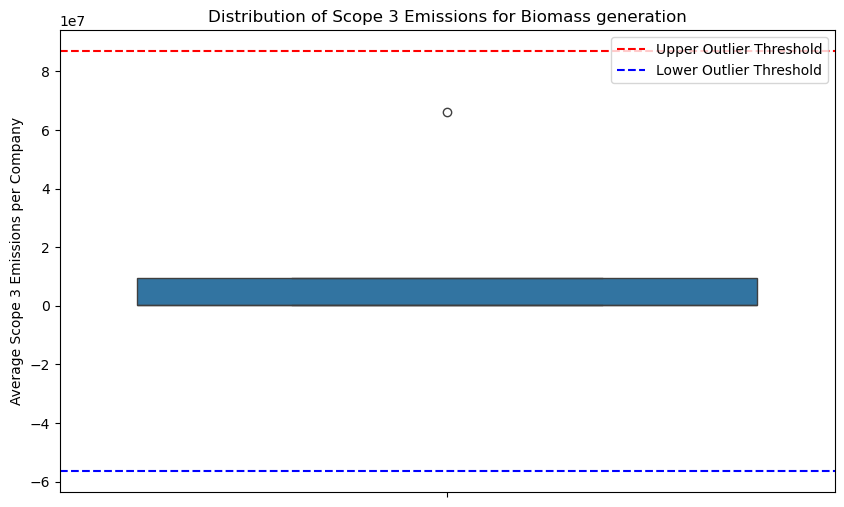

,account_name,Scope_3_emissions_amount


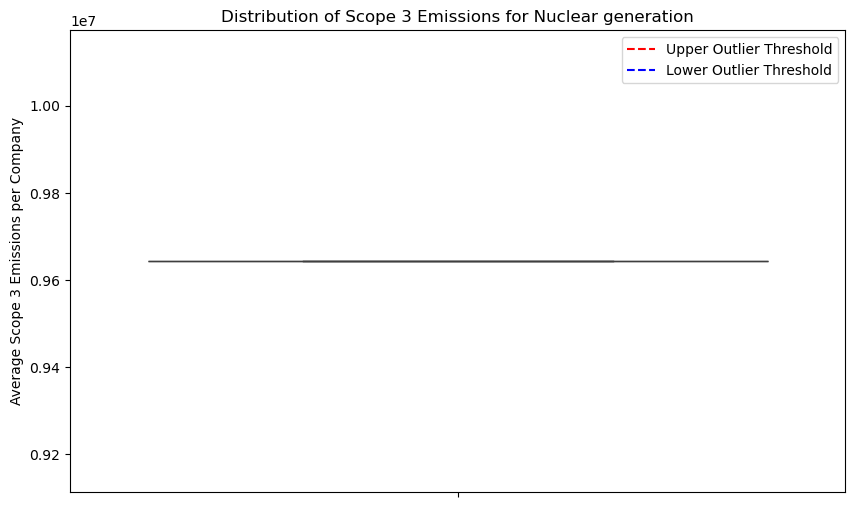

,account_name,Scope_3_emissions_amount


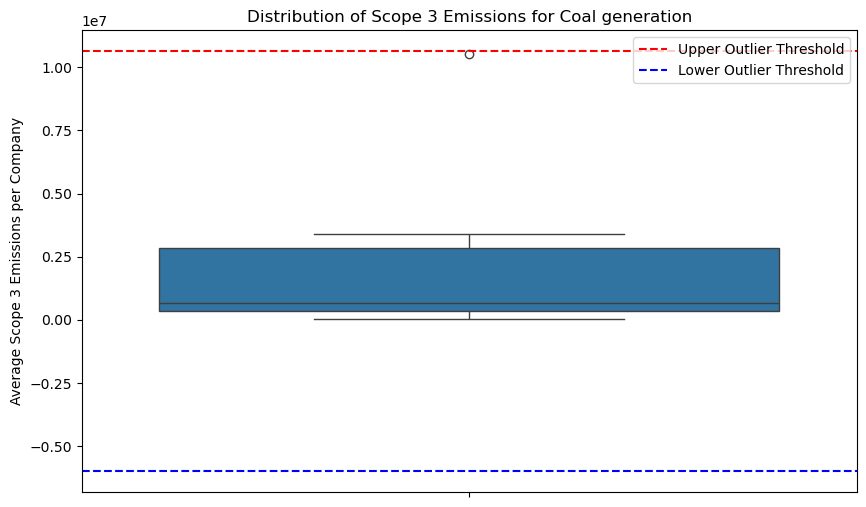

,account_name,Scope_3_emissions_amount


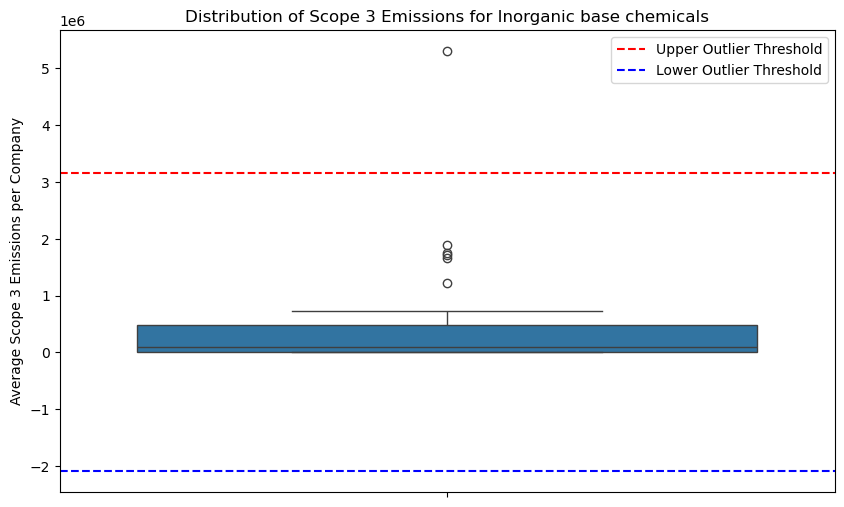

,account_name,Scope_3_emissions_amount
27,Showa Denko K.K.,5.305327e+06


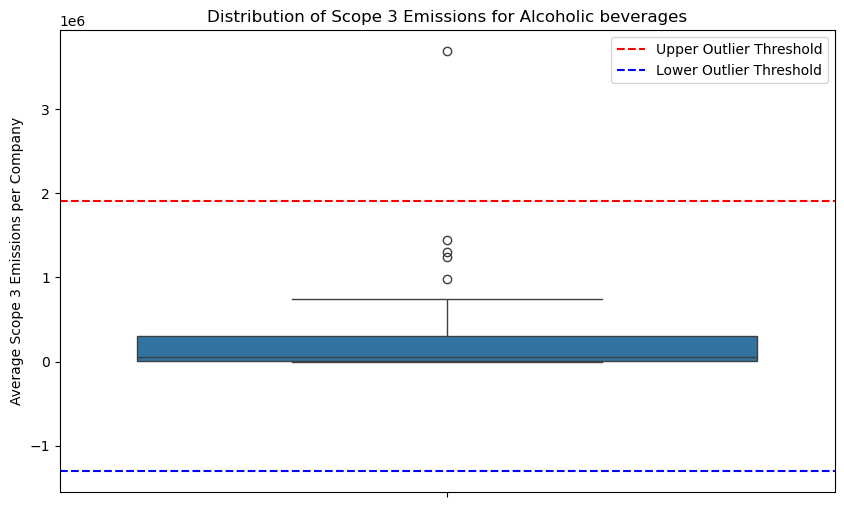

,account_name,Scope_3_emissions_amount
4,Anheuser Busch InBev,3.689514e+06


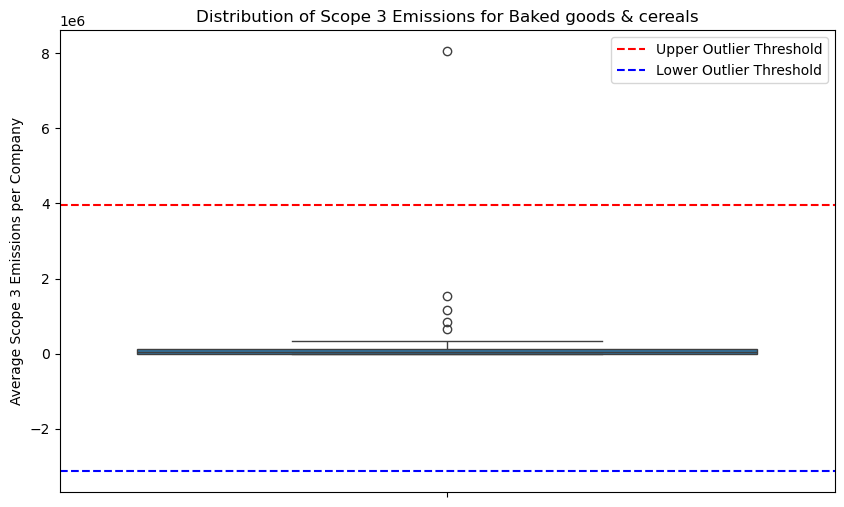

,account_name,Scope_3_emissions_amount
21,Nisshin Seifun Group Inc.,8.057070e+06


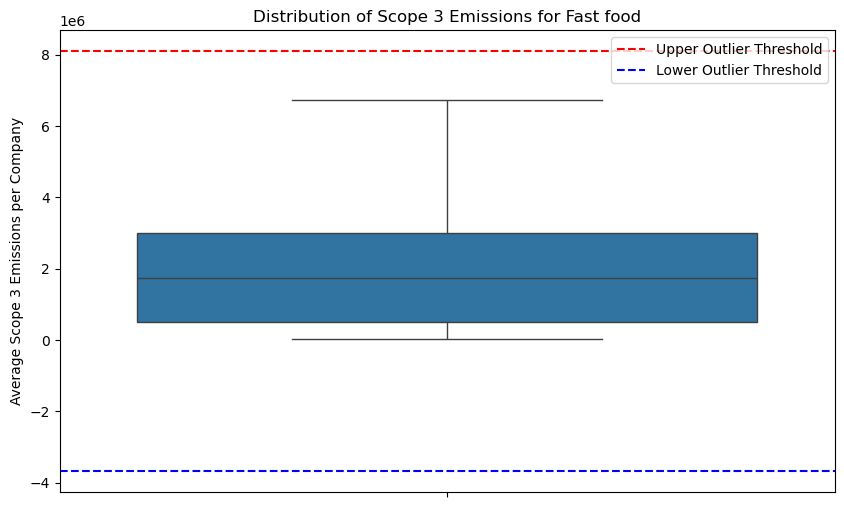

,account_name,Scope_3_emissions_amount


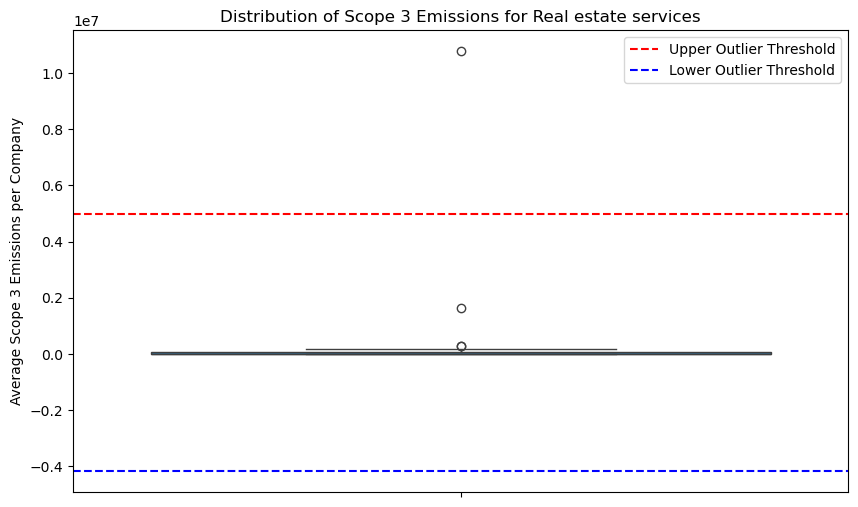

,account_name,Scope_3_emissions_amount
5,"CBRE Group, Inc.",10784525.5


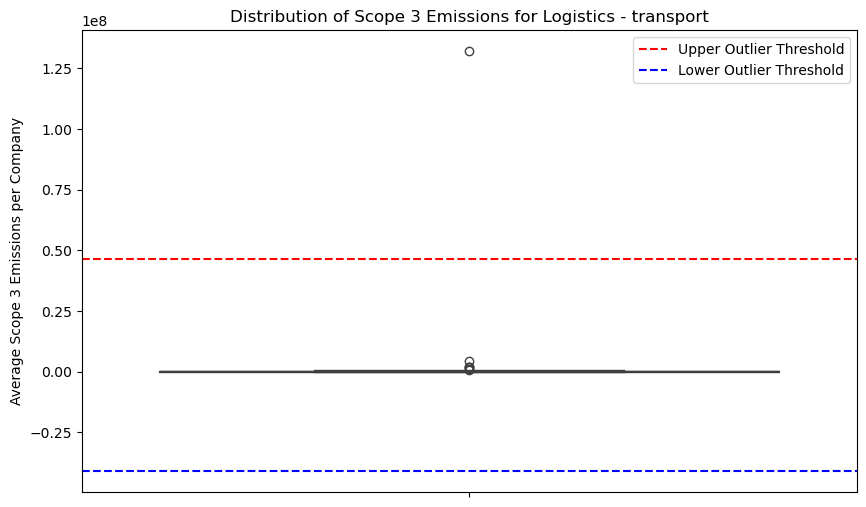

,account_name,Scope_3_emissions_amount
36,SERVICIOS INTEGRALES MAYTRAS SA DE CV,132026800.0


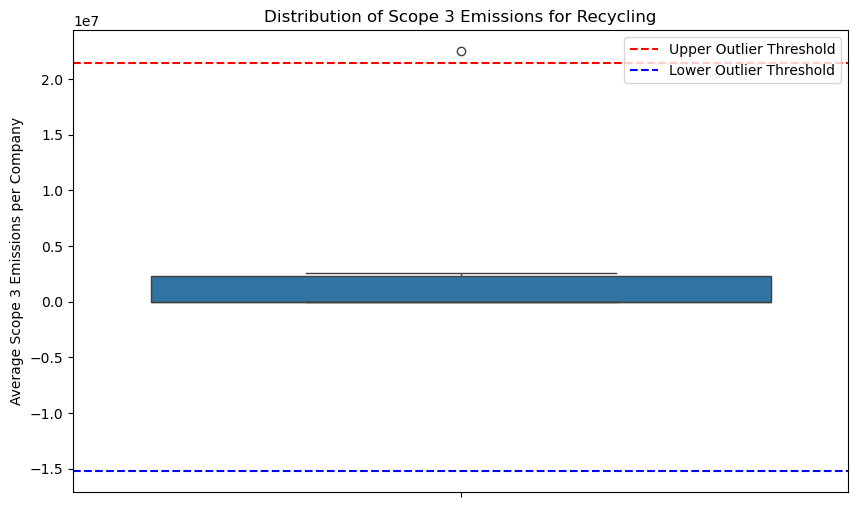

,account_name,Scope_3_emissions_amount
6,Sims Limited,2.251425e+07


In [30]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display

# Load the dataset
file_path = "Mega_merged_all_real_values.csv"  # Ensure the correct file path
df = pd.read_csv(file_path)

# Step 1: Compute total Scope 3 emissions per Primary Activity
total_emissions_per_activity = df.groupby('Primary activity')['Scope_3_emissions_amount'].sum().reset_index()

# Step 2: Sort activities by total emissions
total_emissions_per_activity = total_emissions_per_activity.sort_values(by='Scope_3_emissions_amount', ascending=False)

# Step 3: Split into three equal-sized groups (top third, middle third, bottom third)
num_activities = len(total_emissions_per_activity)
top_third_cutoff = num_activities // 3

top_third = total_emissions_per_activity.iloc[:top_third_cutoff]

# Select a batch size (change this number as needed)
batch_size = 71  # Adjust to display more/less at a time
top_third_activities = top_third['Primary activity'].tolist()[:batch_size]

# Function to plot batch of boxplots
def plot_top_third_boxplots(df, activities):
    for activity in activities:
        subset = df[df['Primary activity'] == activity]

        # Ensure only one dot per company (average emissions per company)
        avg_emissions_per_company = subset.groupby('account_name')['Scope_3_emissions_amount'].mean().reset_index()

        # Compute mean and standard deviation for outlier detection
        activity_mean = avg_emissions_per_company['Scope_3_emissions_amount'].mean()
        activity_std = avg_emissions_per_company['Scope_3_emissions_amount'].std()

        upper_threshold = activity_mean + 2.5 * activity_std
        lower_threshold = activity_mean - 2.5 * activity_std

        # Identify outliers
        outliers = avg_emissions_per_company[
            (avg_emissions_per_company['Scope_3_emissions_amount'] > upper_threshold) |
            (avg_emissions_per_company['Scope_3_emissions_amount'] < lower_threshold)
        ]

        # Plot boxplot
        plt.figure(figsize=(10, 6))
        sns.boxplot(y=avg_emissions_per_company['Scope_3_emissions_amount'])
        plt.axhline(upper_threshold, color='r', linestyle='--', label='Upper Outlier Threshold')
        plt.axhline(lower_threshold, color='b', linestyle='--', label='Lower Outlier Threshold')
        plt.title(f'Distribution of Scope 3 Emissions for {activity}')
        plt.ylabel('Average Scope 3 Emissions per Company')
        plt.legend()
        plt.show()

        # Display the outliers in Jupyter Notebook
        outliers_display = outliers[['account_name', 'Scope_3_emissions_amount']]
        display(outliers_display)

# Generate boxplots for the first batch of the Top Third activities
plot_top_third_boxplots(df, top_third_activities)

/var/folders/h7/9xqmfqgd45b8j4np0nndf6gw0000gn/T/ipykernel_5713/3550841256.py:8: DtypeWarning:

Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.



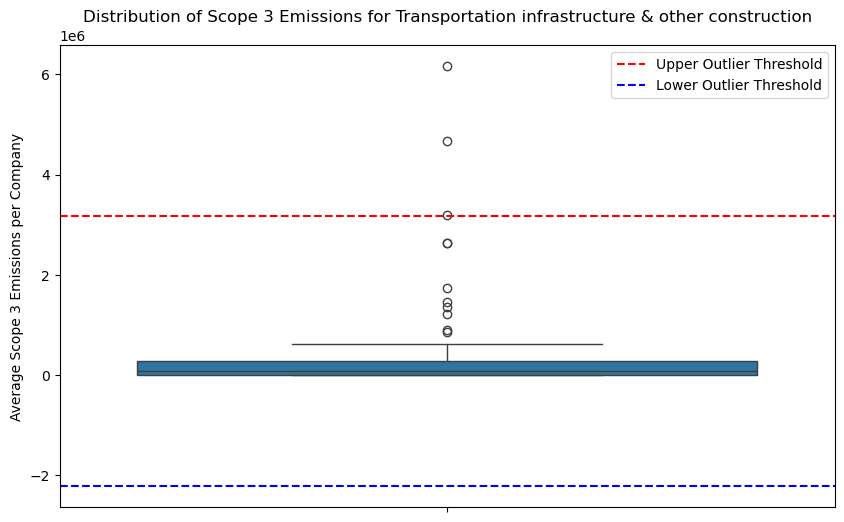

,account_name,Scope_3_emissions_amount
4,Abertis Infraestructuras,3.183626e+06
16,Camargo Correa,6.162293e+06
24,Eiffage,4.663400e+06


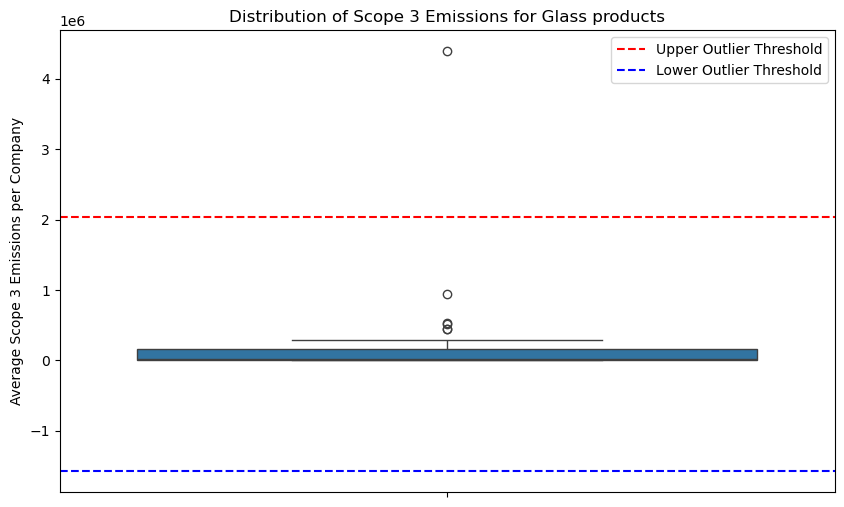

,account_name,Scope_3_emissions_amount
28,Saint-Gobain,4.393083e+06


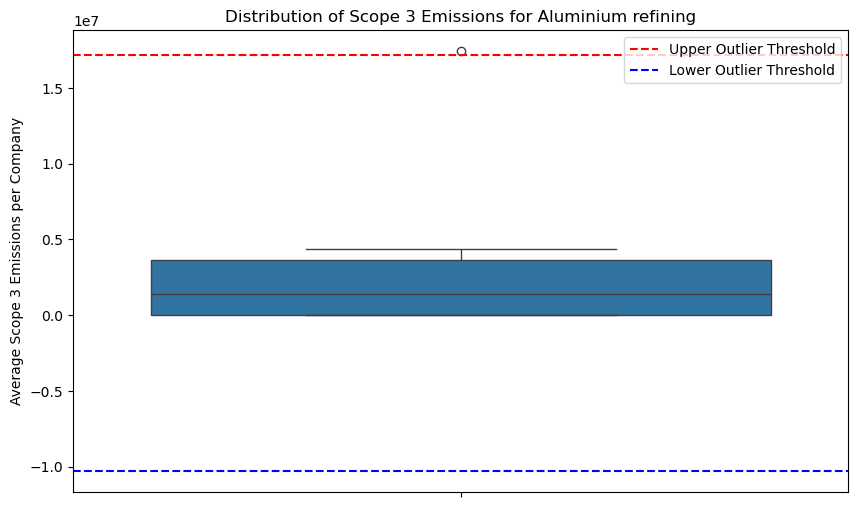

,account_name,Scope_3_emissions_amount
7,South32,17439484.6


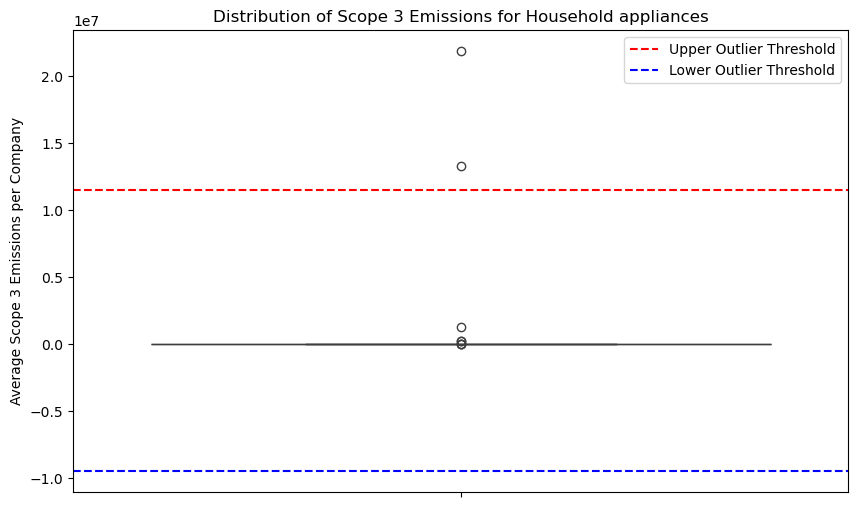

,account_name,Scope_3_emissions_amount
33,Whirlpool Corporation,2.185928e+07
34,XIAMEN INTRETECH INC.,1.325451e+07


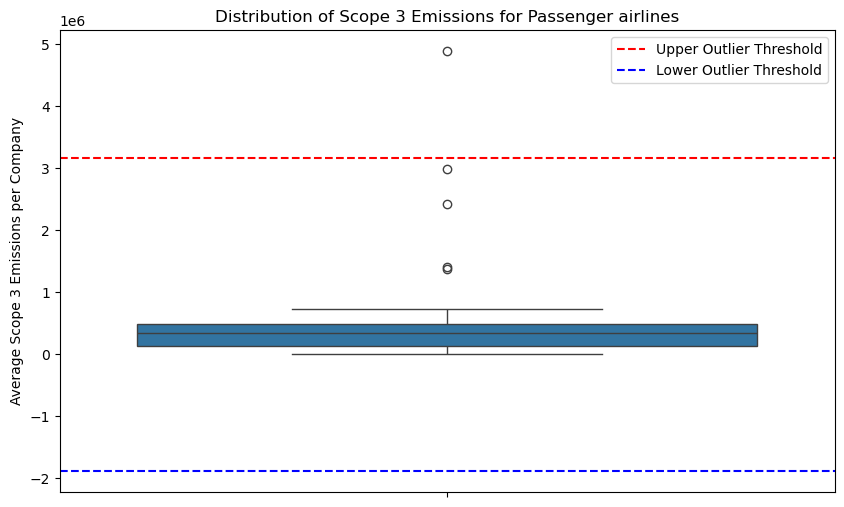

,account_name,Scope_3_emissions_amount
29,United Continental Holdings,4.887718e+06


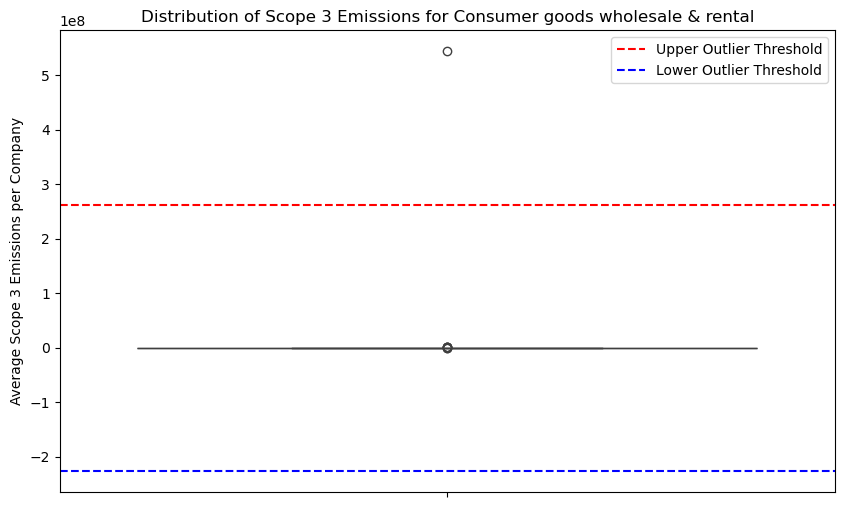

,account_name,Scope_3_emissions_amount
3,BERLIN PACKAGING LLC,544436404.0


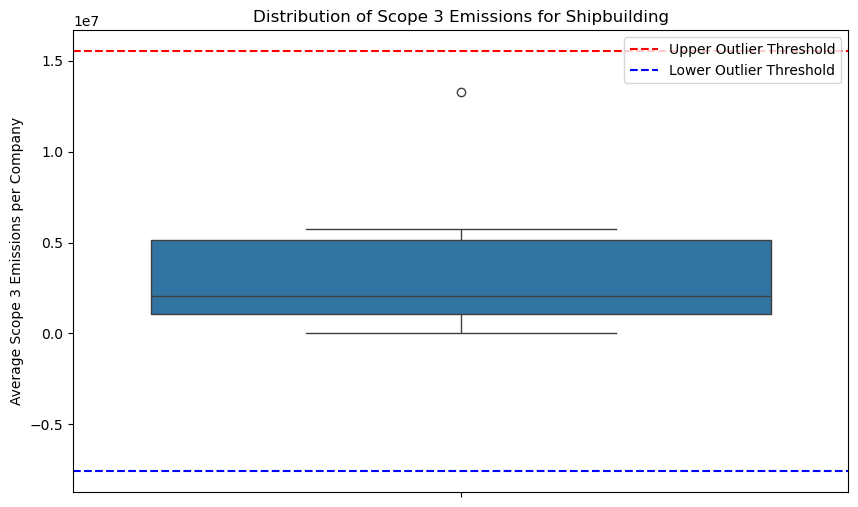

,account_name,Scope_3_emissions_amount


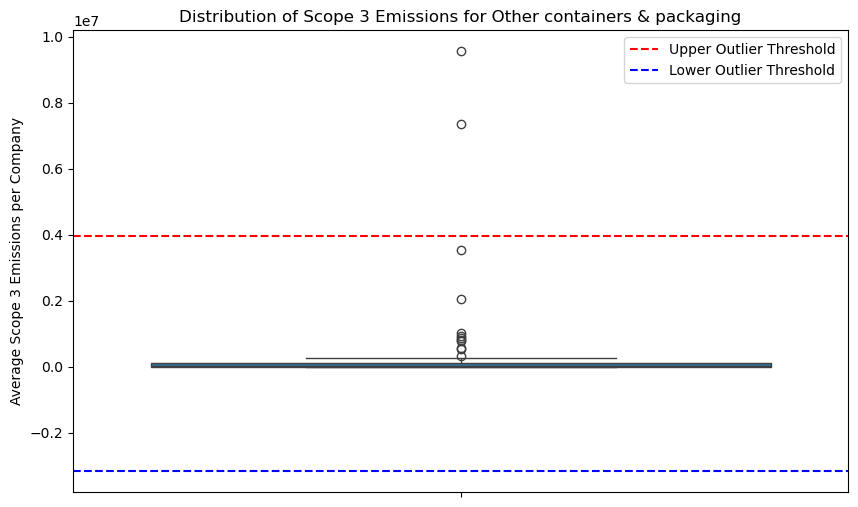

,account_name,Scope_3_emissions_amount
19,Cartwood S.A de C.V,7.346557e+06
61,"SHYA HSIN PACKAGING INDUSTRY(CHINA)CO.,LTD.",9.559703e+06


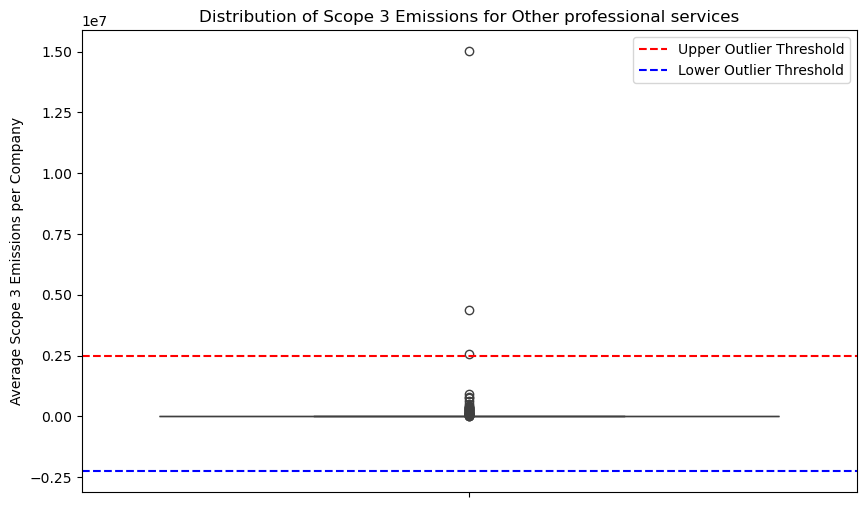

,account_name,Scope_3_emissions_amount
51,CS BRASIL TRANSPORTES DE PASSAGEIROS E SERVIÇO...,2.550225e+06
168,MCI GROUP CANADA INC,1.501507e+07
250,THE SPUR GROUP INC,4.375557e+06


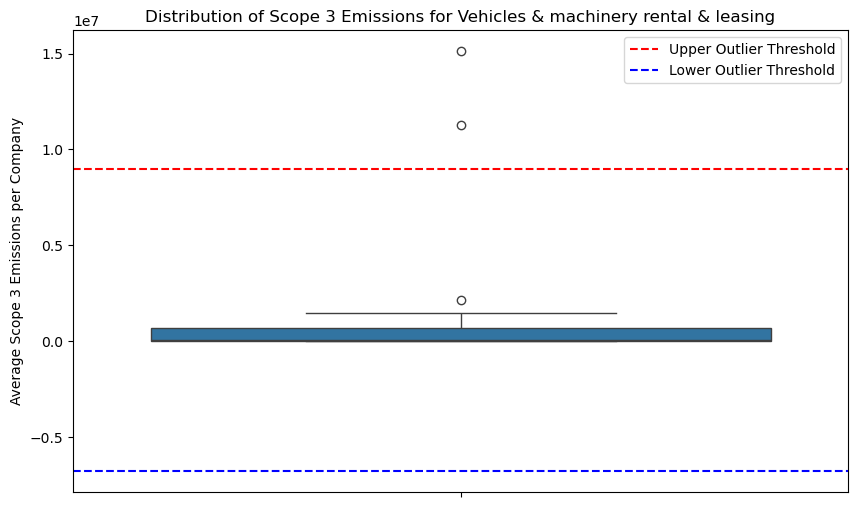

,account_name,Scope_3_emissions_amount
1,AerCap Holdings NV,1.512626e+07
32,"VAMOS LOCACAO DE CAMINHOES, MAQUINAS E EQUIPAM...",1.125865e+07


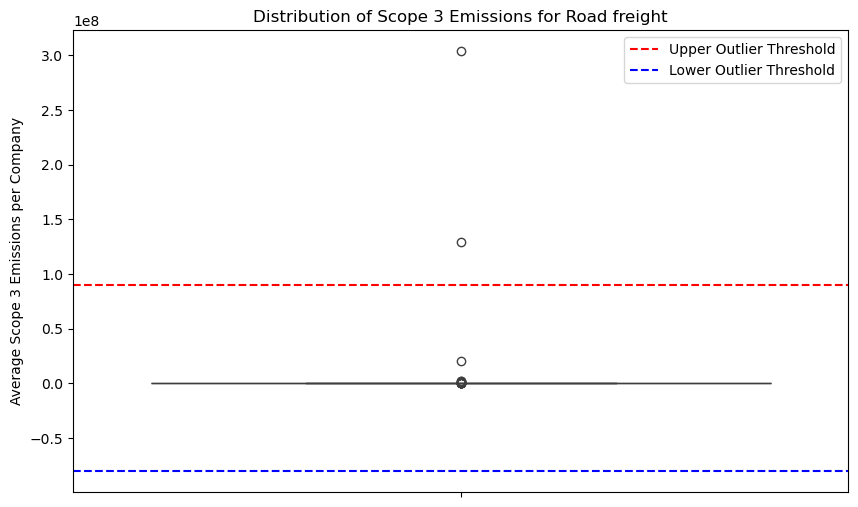

,account_name,Scope_3_emissions_amount
12,Braanker Transport BV,303791600.0
13,COLTANQUES S A S,128993476.0


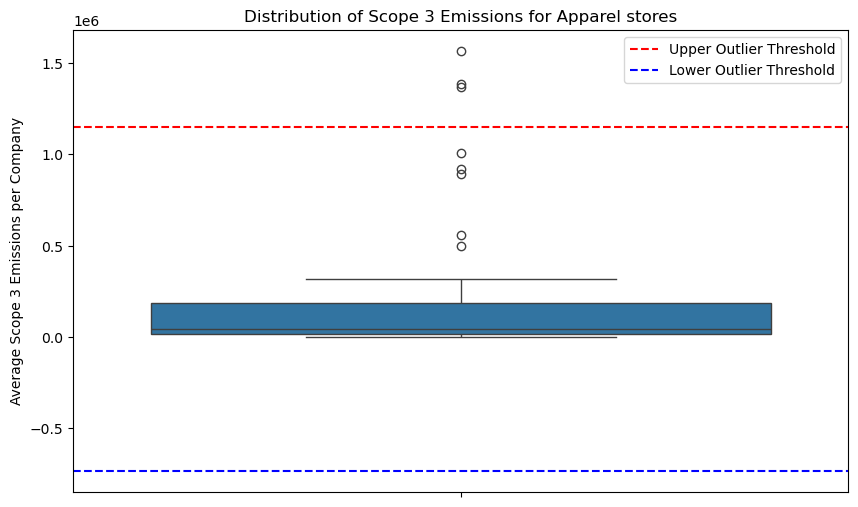

,account_name,Scope_3_emissions_amount
25,H&M Hennes & Mauritz AB,1.383926e+06
27,Inditex,1.371388e+06
28,Inditex S.A.,1.565771e+06


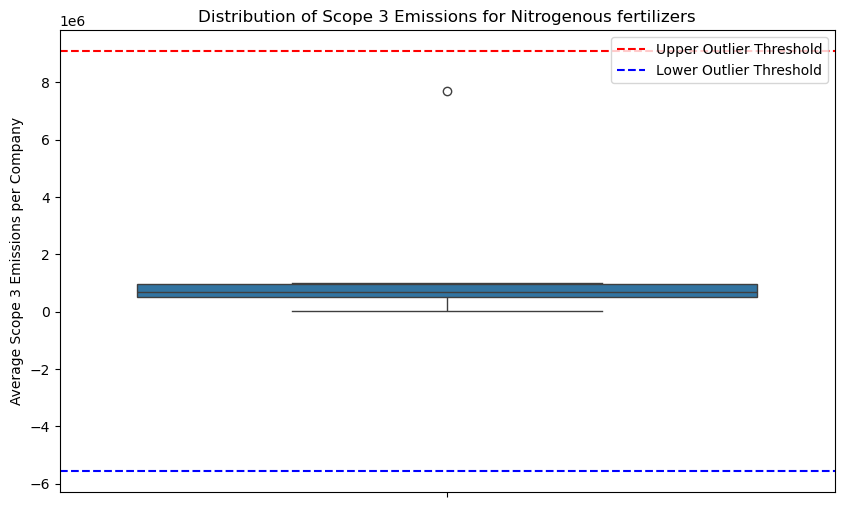

,account_name,Scope_3_emissions_amount


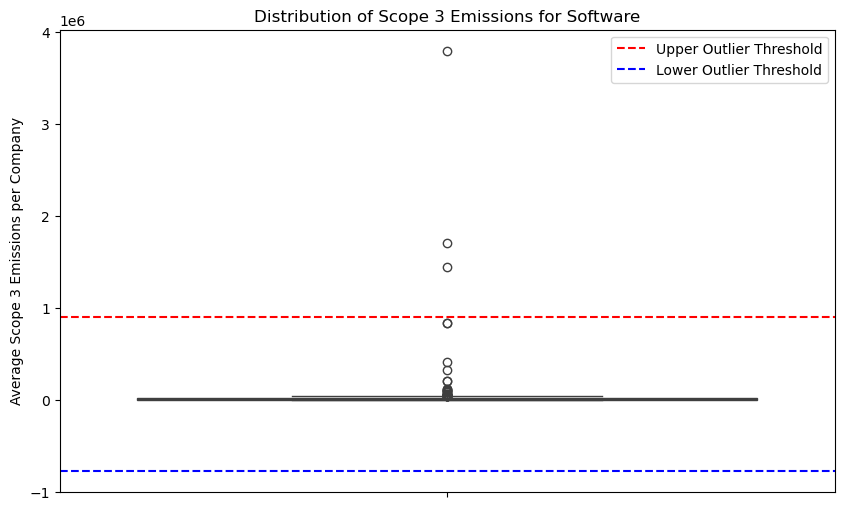

,account_name,Scope_3_emissions_amount
49,Dell Technologies,3.796007e+06
81,MEDABLE INC,1.706235e+06
85,Microsoft Corporation,1.437405e+06


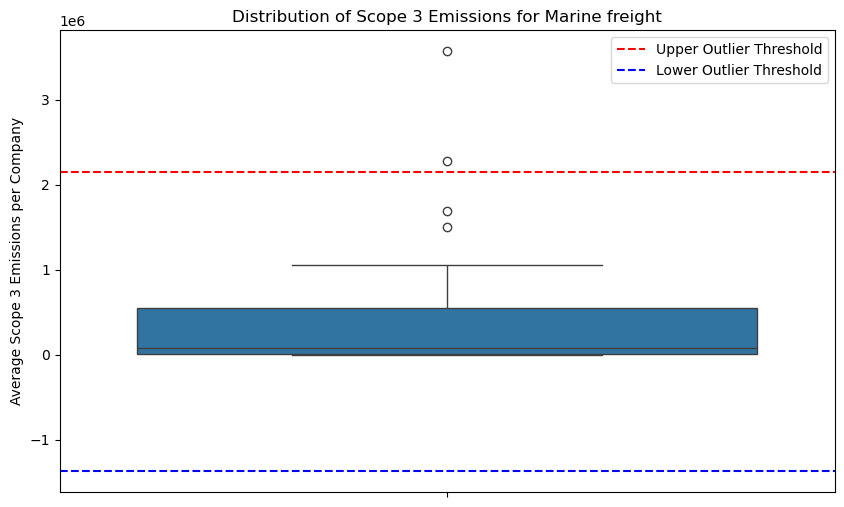

,account_name,Scope_3_emissions_amount
0,A.P. Moller - Maersk,2.283312e+06
26,NAIGAI TRANS LINE LTD.,3.572500e+06


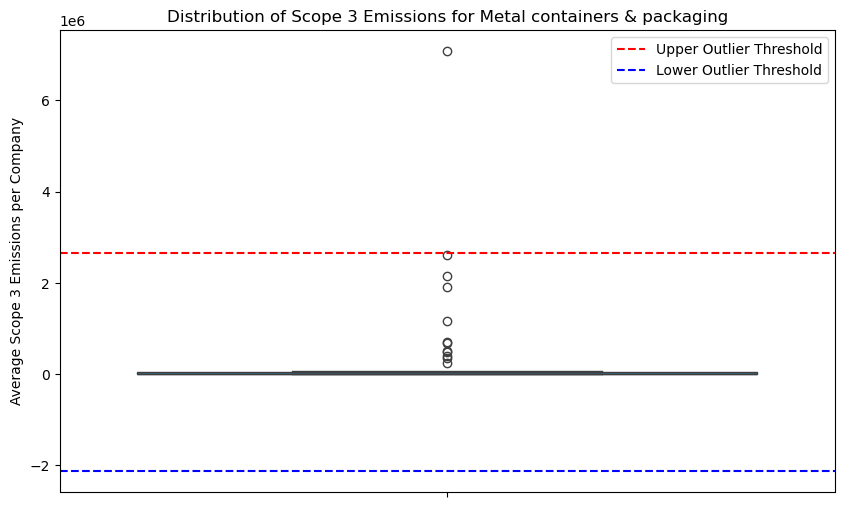

,account_name,Scope_3_emissions_amount
61,Sarten Packaging,7080638.875


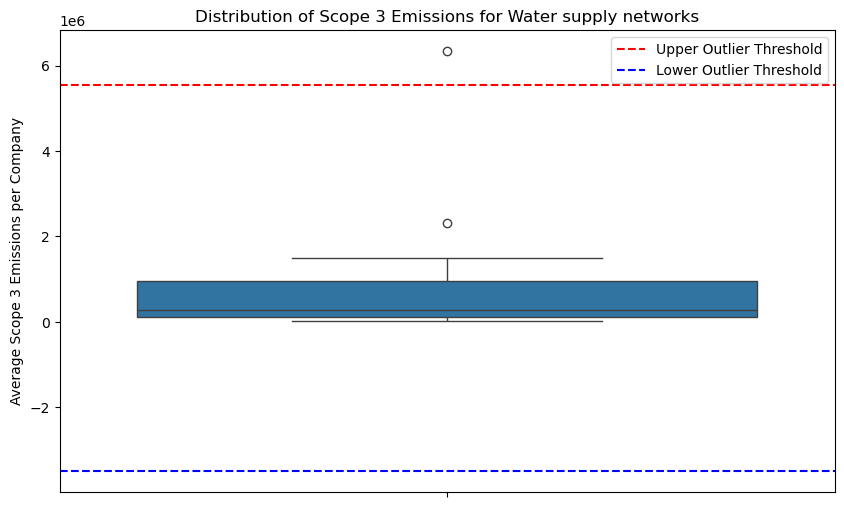

,account_name,Scope_3_emissions_amount
5,Metro Pacific Investments,6338867.108


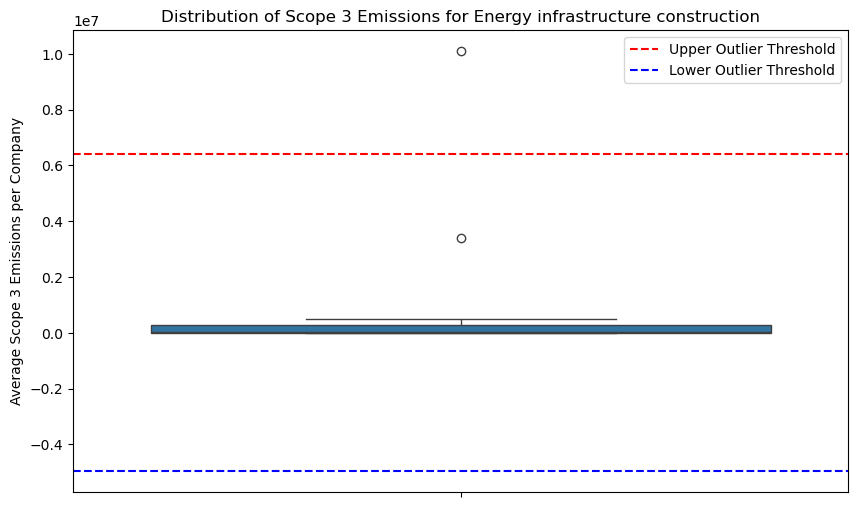

,account_name,Scope_3_emissions_amount
16,SUPREME INDUSTRIES INC,1.009782e+07


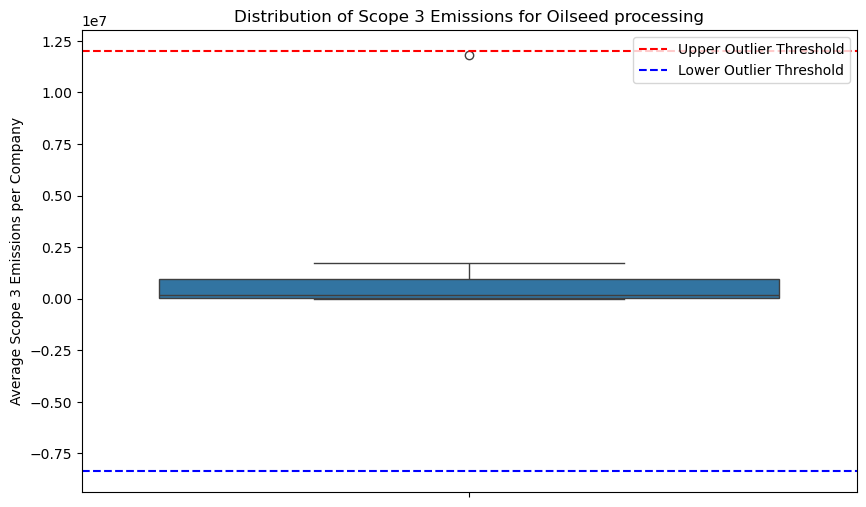

,account_name,Scope_3_emissions_amount


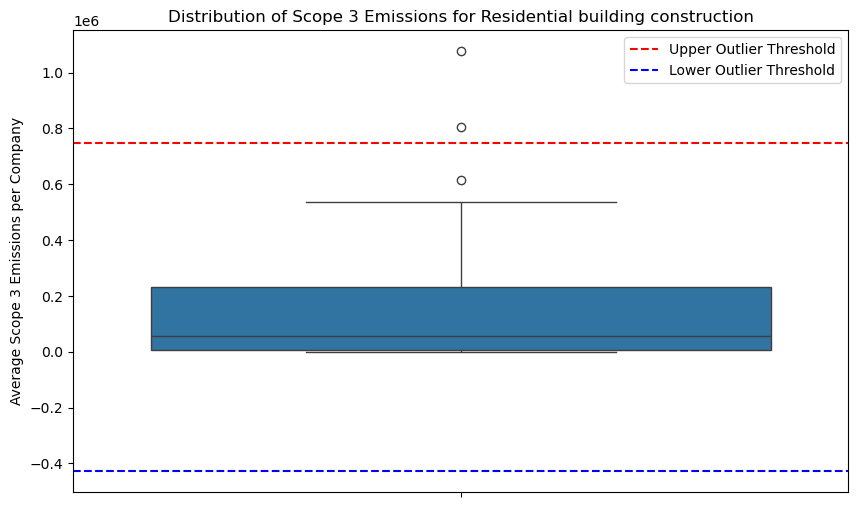

,account_name,Scope_3_emissions_amount
10,"Daiwa House Industry Co., Ltd.",1.076829e+06
28,PulteGroup Inc,8.060481e+05


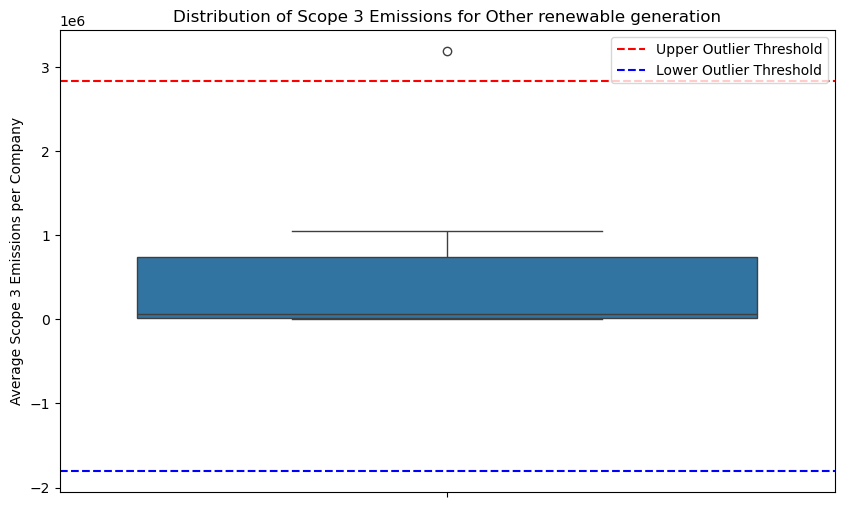

,account_name,Scope_3_emissions_amount
9,SSE,3.188526e+06


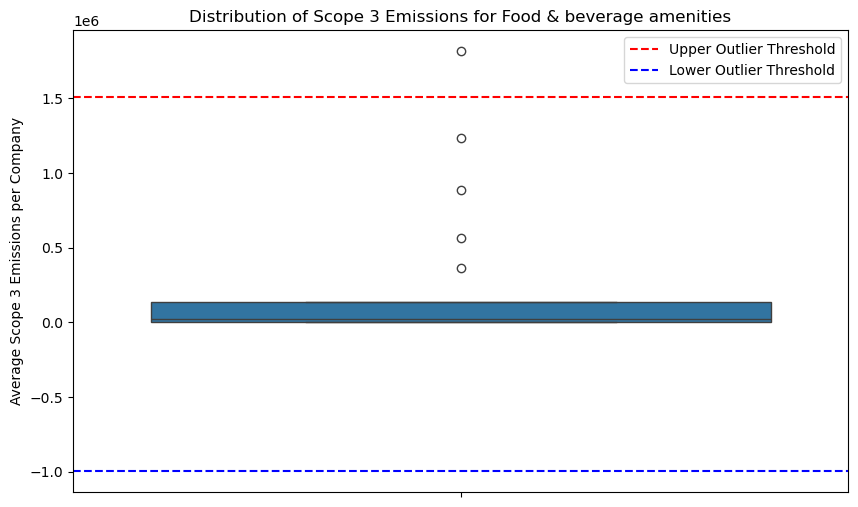

,account_name,Scope_3_emissions_amount
15,Sodexo,1.814840e+06


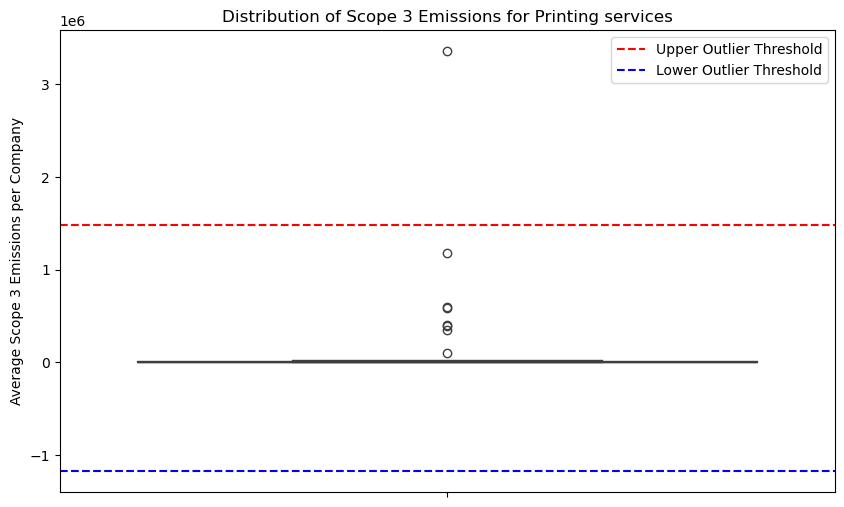

,account_name,Scope_3_emissions_amount
12,De La Rue,3.360192e+06


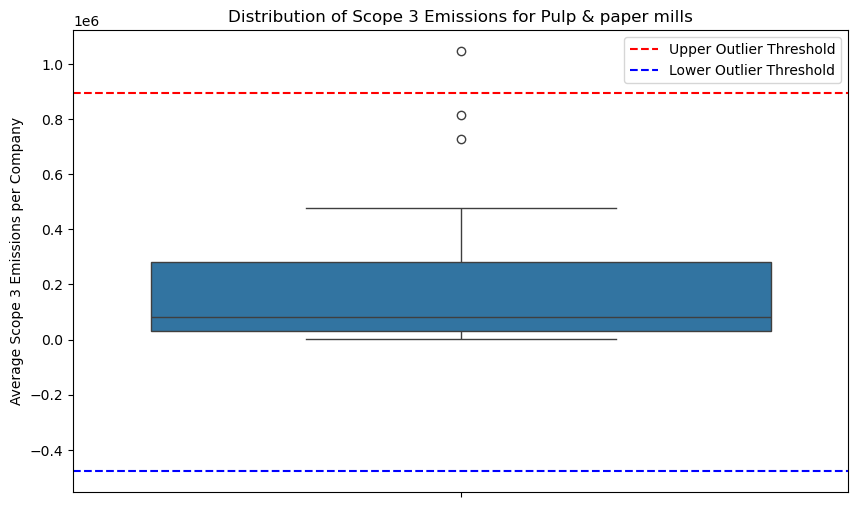

,account_name,Scope_3_emissions_amount
22,Stora Enso Oyj,1.046656e+06


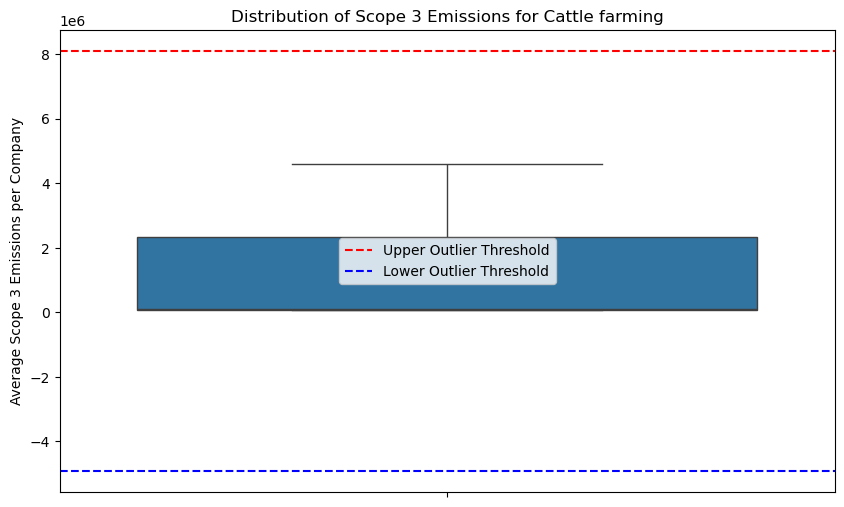

,account_name,Scope_3_emissions_amount


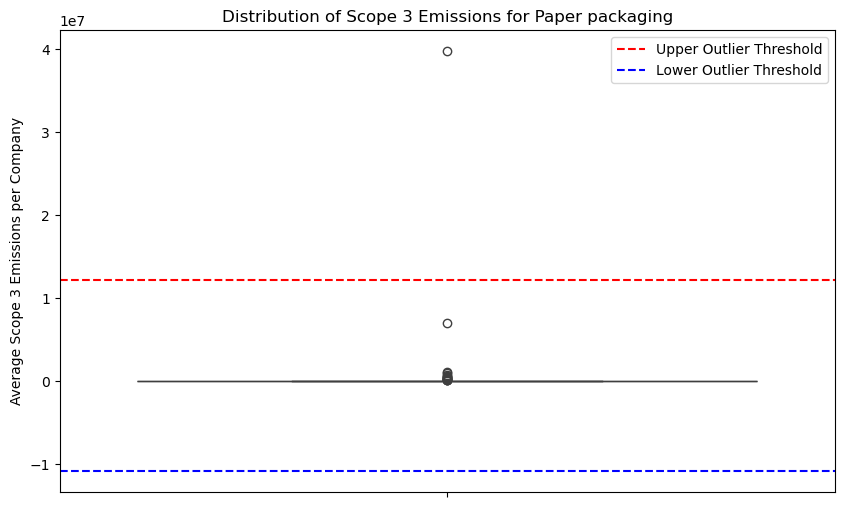

,account_name,Scope_3_emissions_amount
23,EDIPRINT SA DE CV,39751475.0


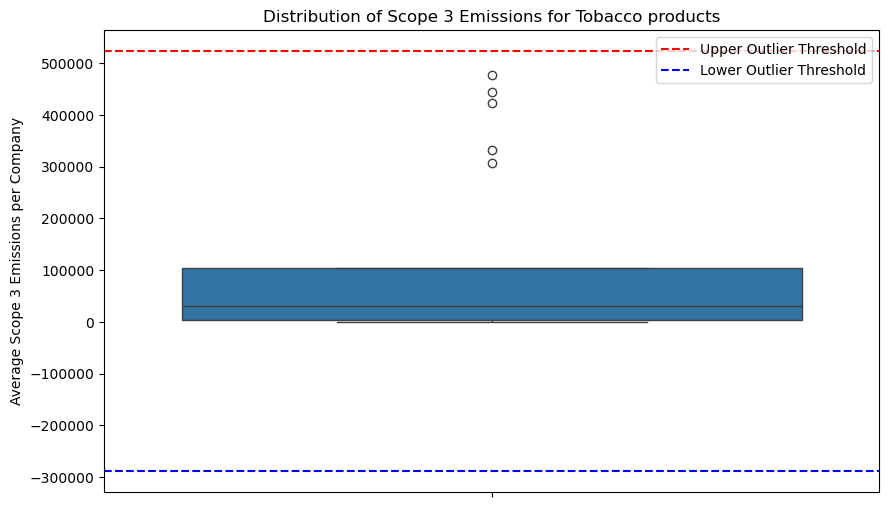

,account_name,Scope_3_emissions_amount


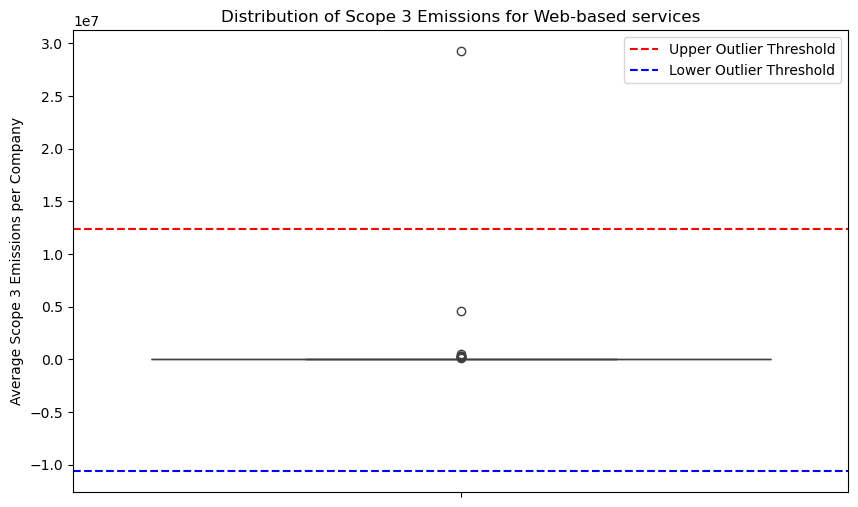

,account_name,Scope_3_emissions_amount
16,"LIFULL Co., Ltd.",2.926669e+07


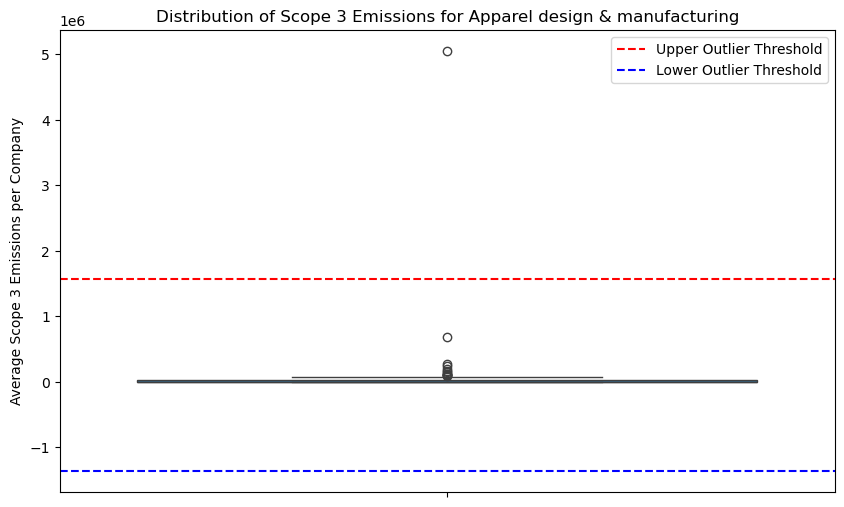

,account_name,Scope_3_emissions_amount
5,CHANEL,5.048813e+06


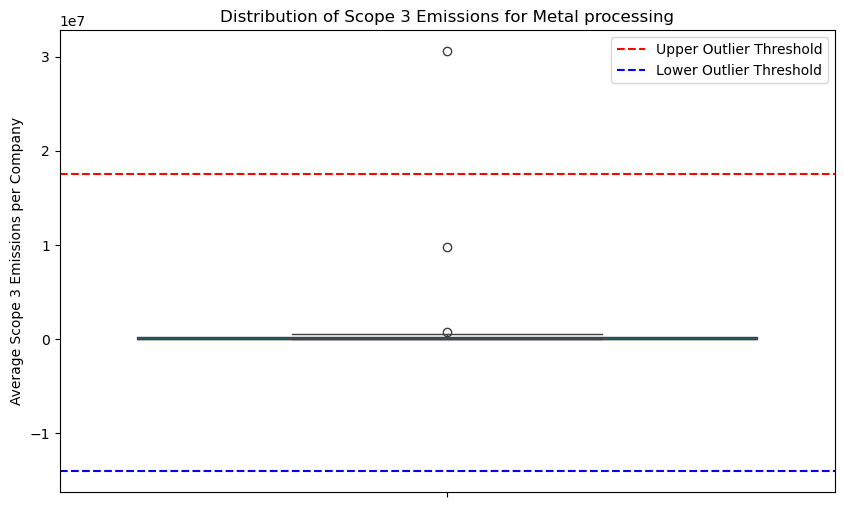

,account_name,Scope_3_emissions_amount
16,S&S INC,30588695.0


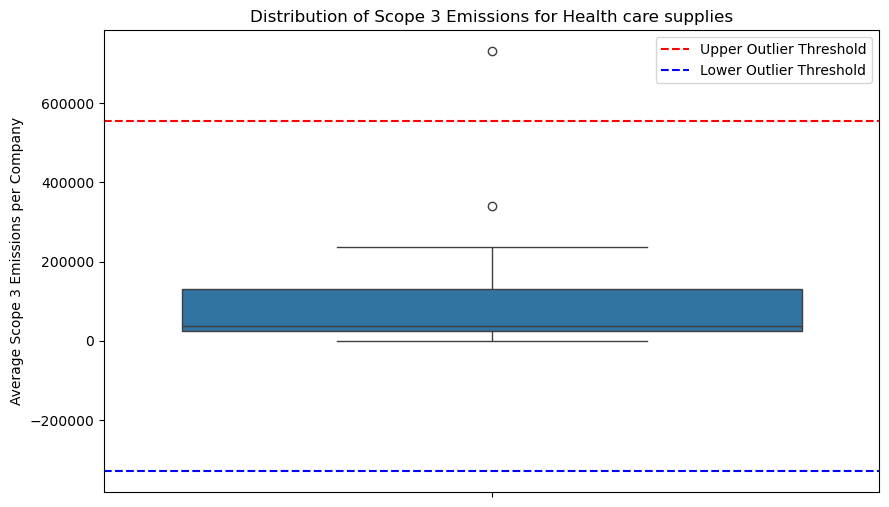

,account_name,Scope_3_emissions_amount
0,Abbott Laboratories,731508.910345


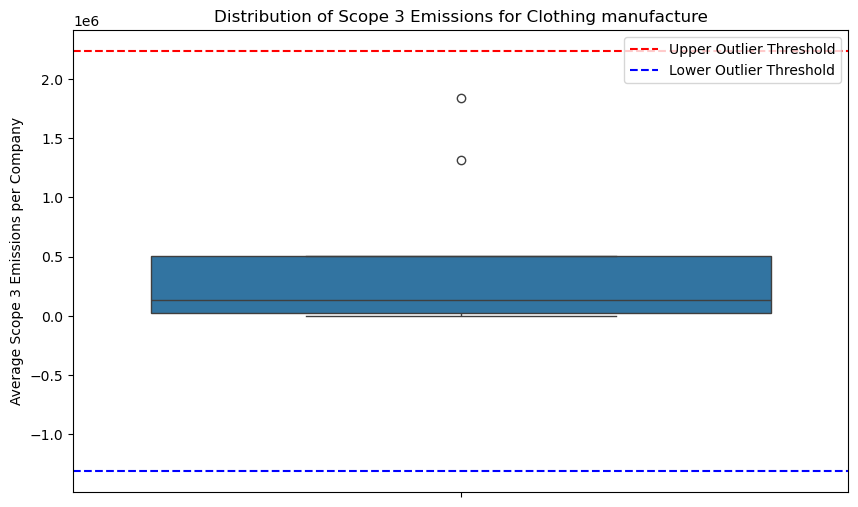

,account_name,Scope_3_emissions_amount


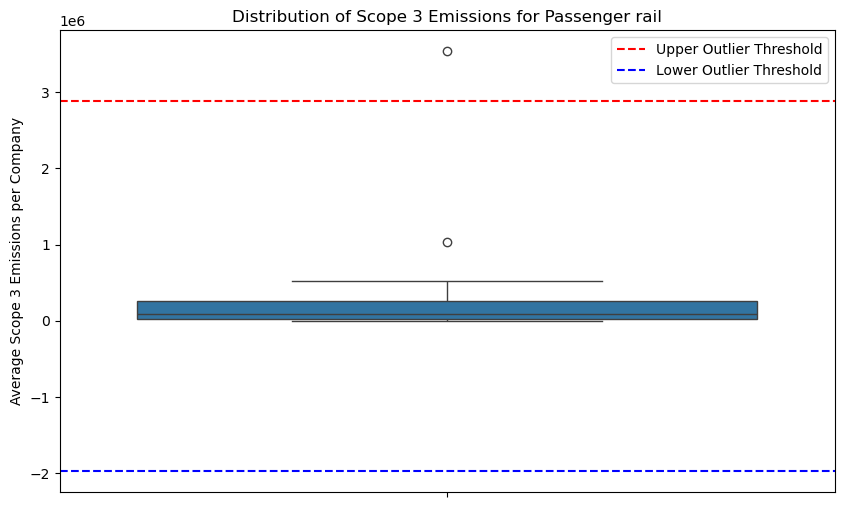

,account_name,Scope_3_emissions_amount
0,Deutsche Bahn AG,3.540258e+06


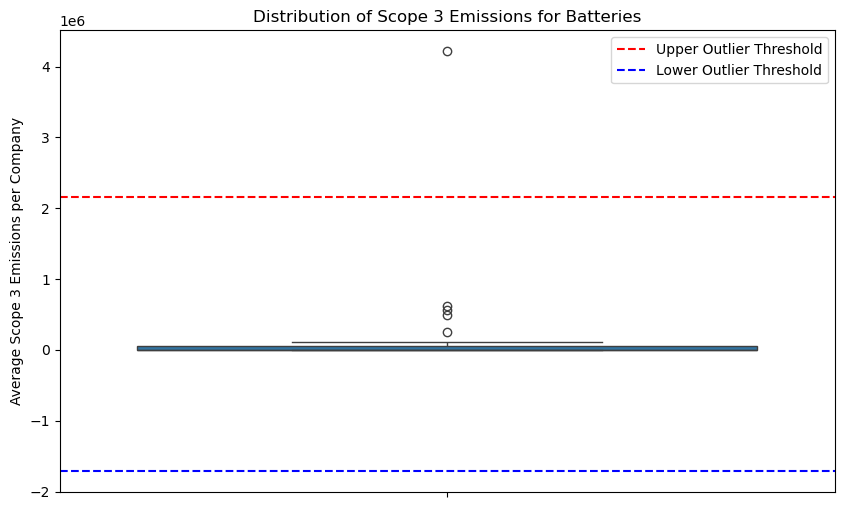

,account_name,Scope_3_emissions_amount
8,Dynapack International Technology Corporation,4214940.81


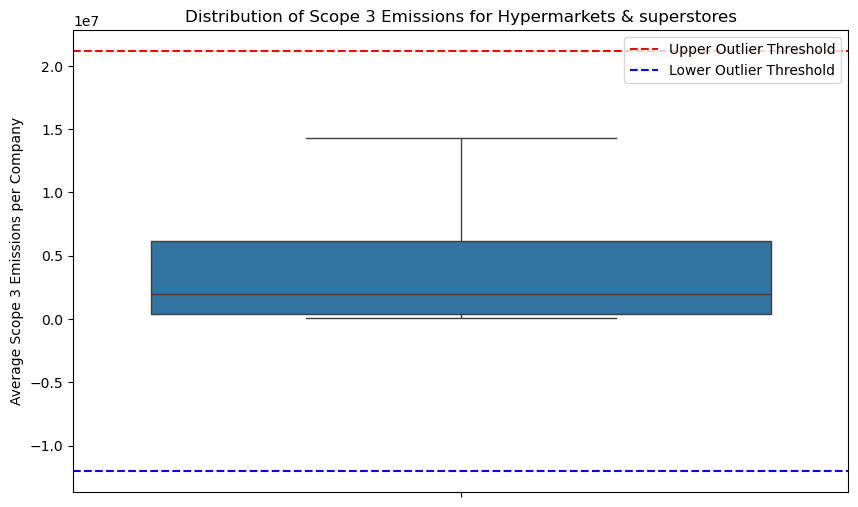

,account_name,Scope_3_emissions_amount


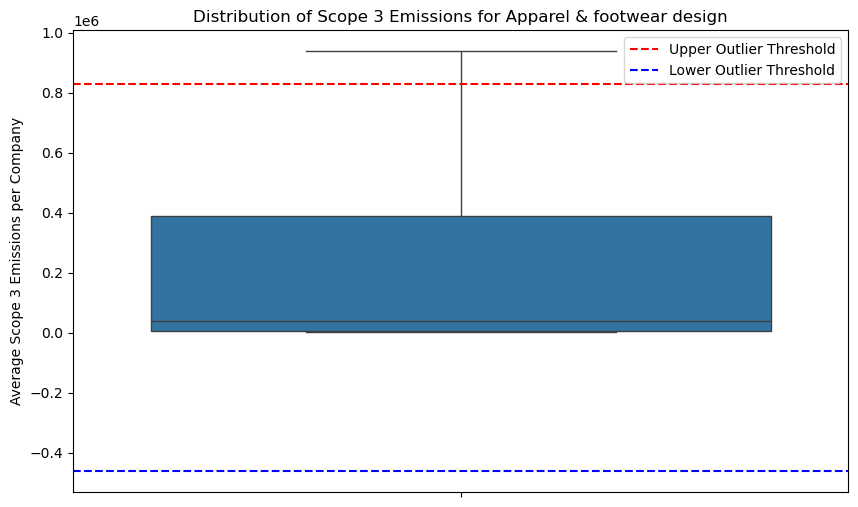

,account_name,Scope_3_emissions_amount
17,adidas AG,938267.551467


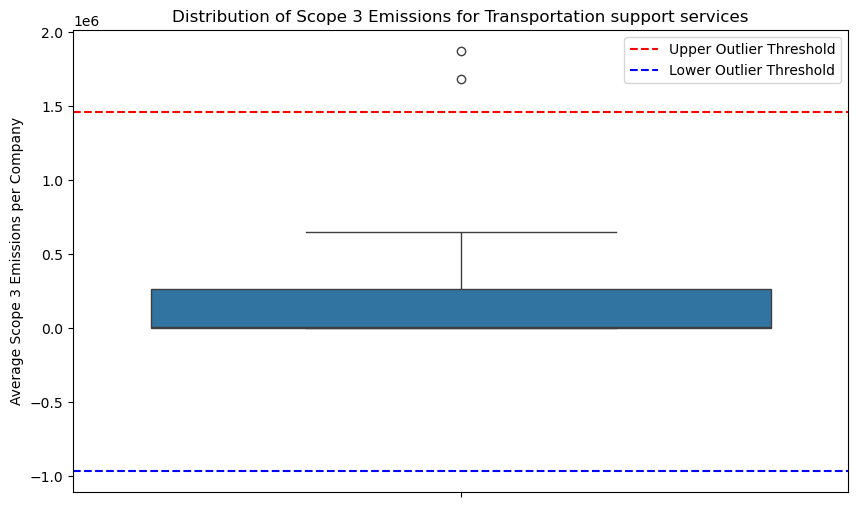

,account_name,Scope_3_emissions_amount
13,NATS,1.870346e+06
14,NATS Holdings Limited,1.679123e+06


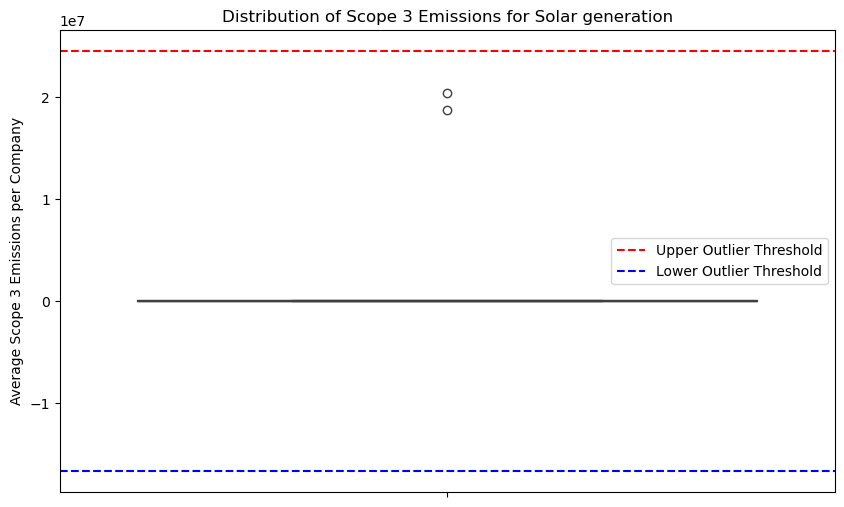

,account_name,Scope_3_emissions_amount


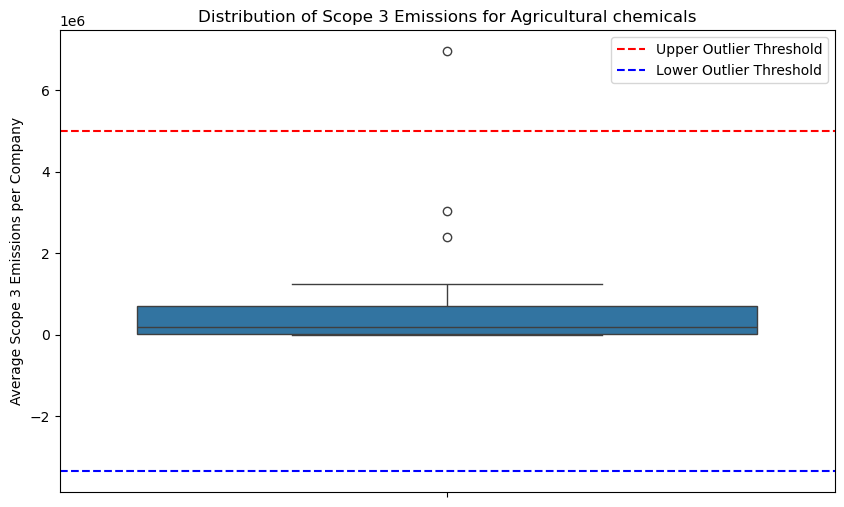

,account_name,Scope_3_emissions_amount
13,Nutrien Ltd.,6957249.5


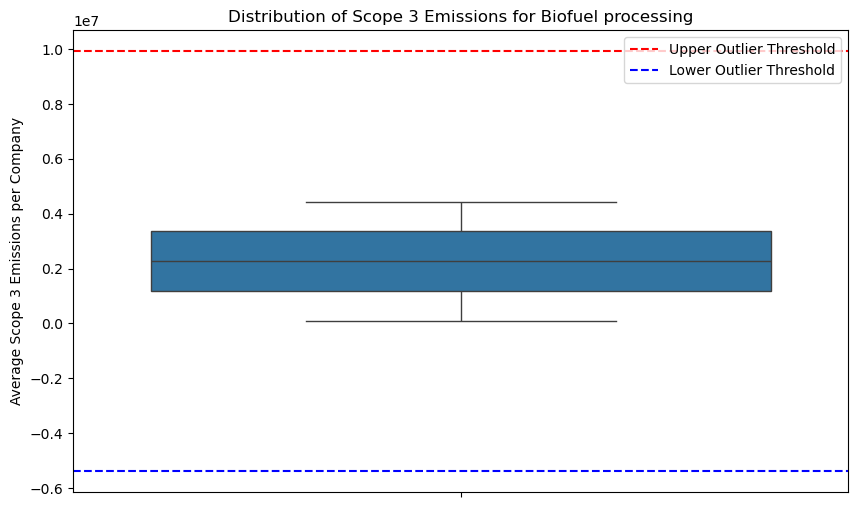

,account_name,Scope_3_emissions_amount


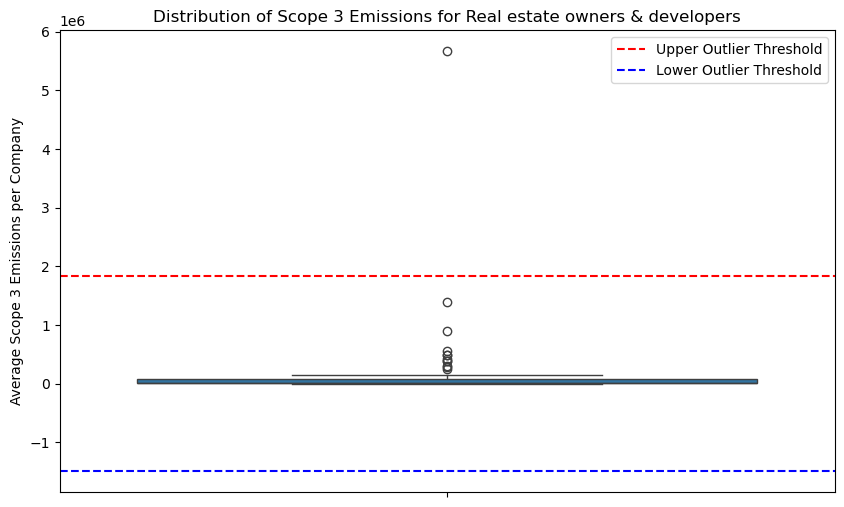

,account_name,Scope_3_emissions_amount
16,Corporación Inmobiliaria Vesta S.A.B de C.V.,5.666562e+06


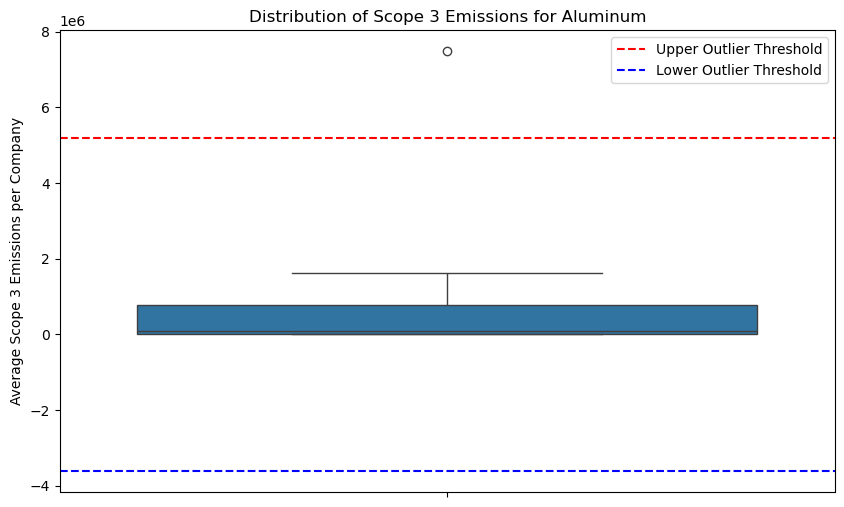

,account_name,Scope_3_emissions_amount
10,Norsk Hydro ASA,7.486667e+06


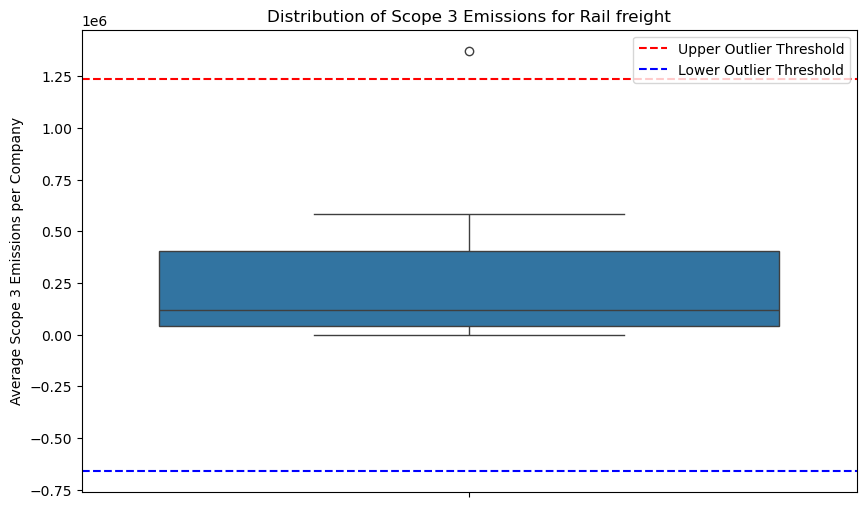

,account_name,Scope_3_emissions_amount
5,Hellmann Worldwide Logistics,1373163.0


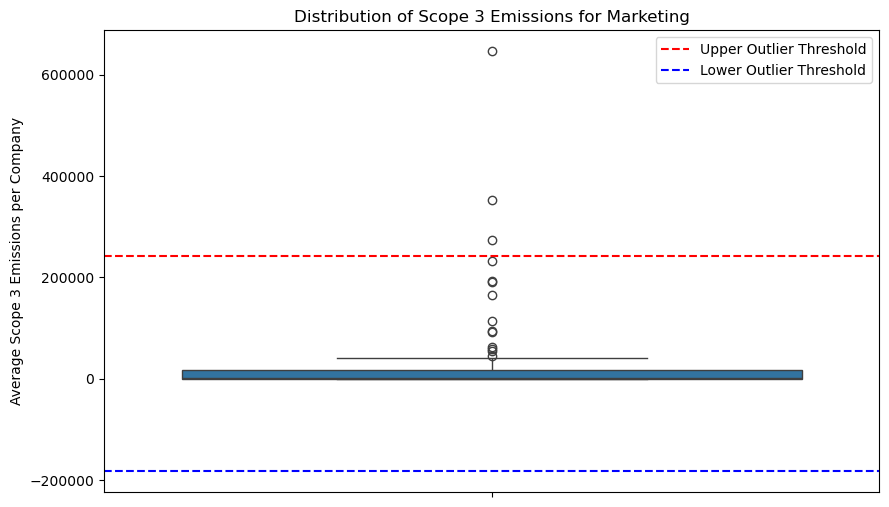

,account_name,Scope_3_emissions_amount
12,"Alphabet, Inc.",646371.978261
78,Paramount Global,273425.733333
98,WPP Group,352846.832800


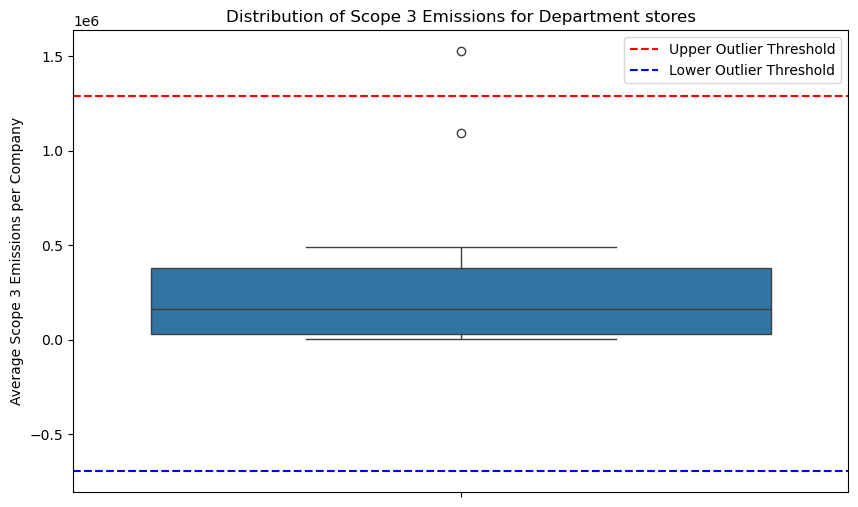

,account_name,Scope_3_emissions_amount
6,Kmart Australia Limited,1526351.6


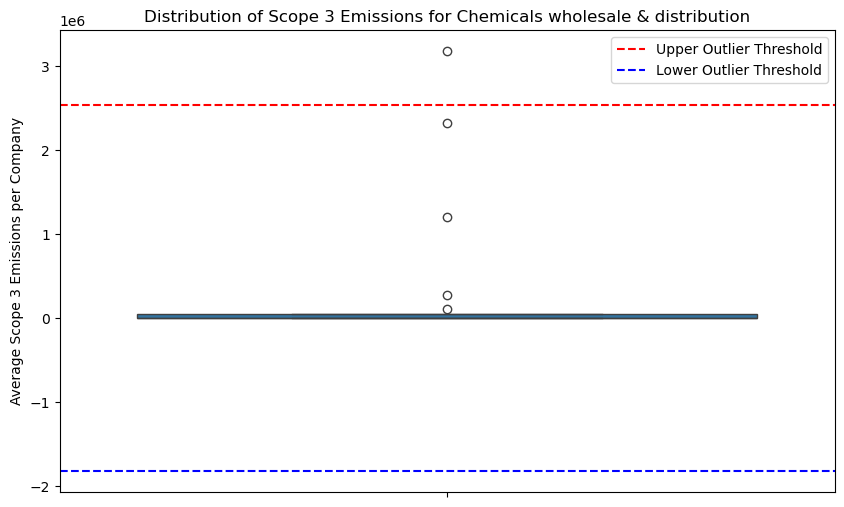

,account_name,Scope_3_emissions_amount
12,"Mitsui & Co., Ltd.",3.180029e+06


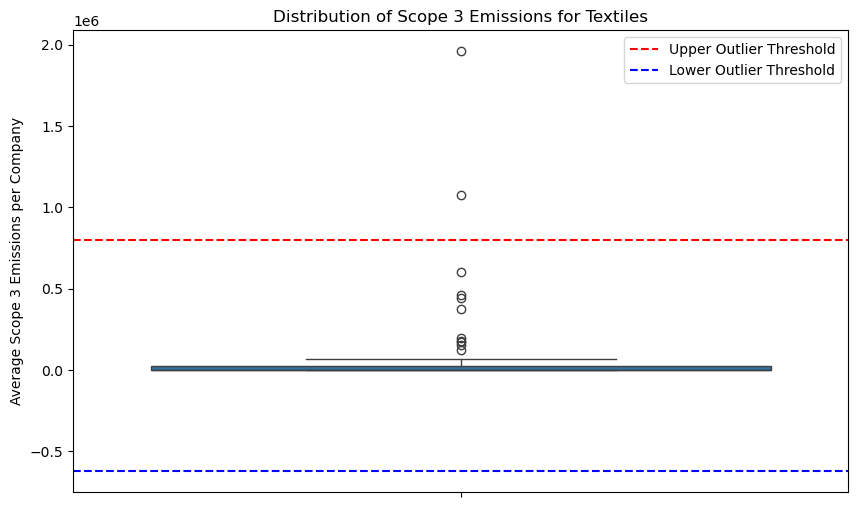

,account_name,Scope_3_emissions_amount
1,AKARTEKS TEKSTIL ÜRÜNLERİ SANAYI PAZARLAMA VE ...,1.961036e+06
54,Sateri,1.076392e+06


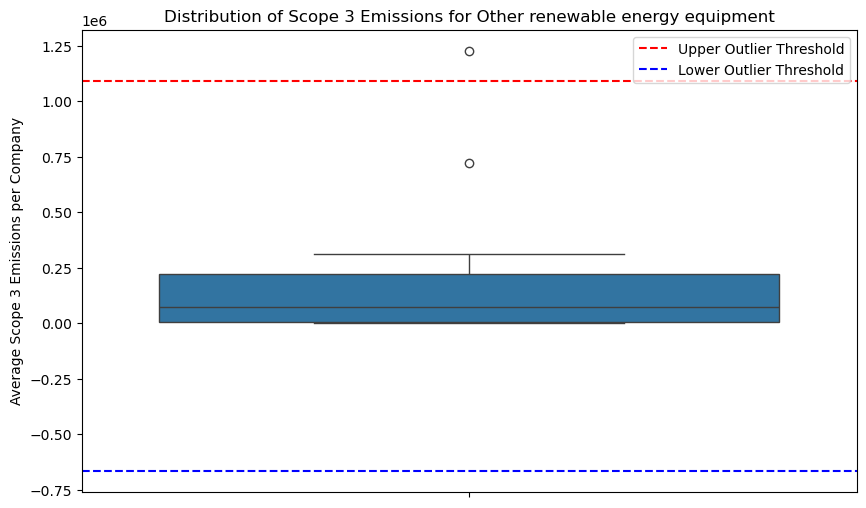

,account_name,Scope_3_emissions_amount
2,Alfa Laval Corporate AB,1227456.5


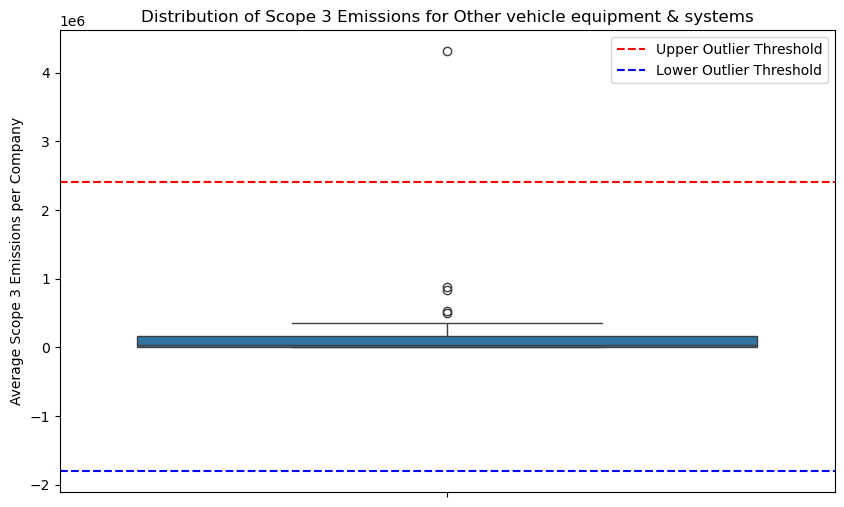

,account_name,Scope_3_emissions_amount
25,"Wuxi Xizhou Machinery Co.,Ltd.",4.314725e+06


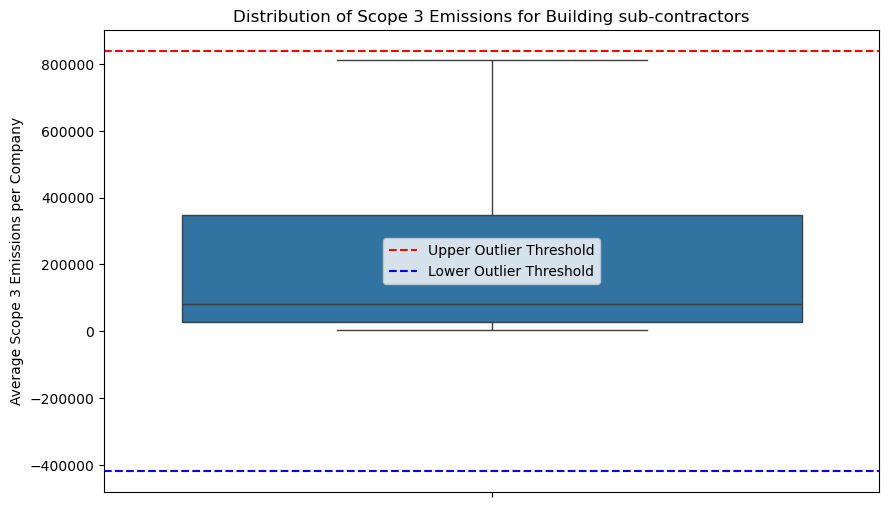

,account_name,Scope_3_emissions_amount


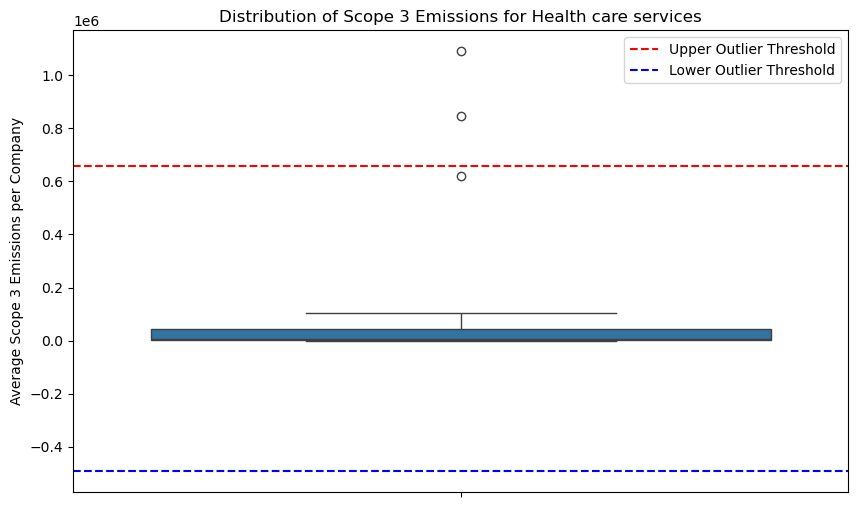

,account_name,Scope_3_emissions_amount
7,CVS Health,1.090884e+06
36,United Health Group Inc,8.481500e+05


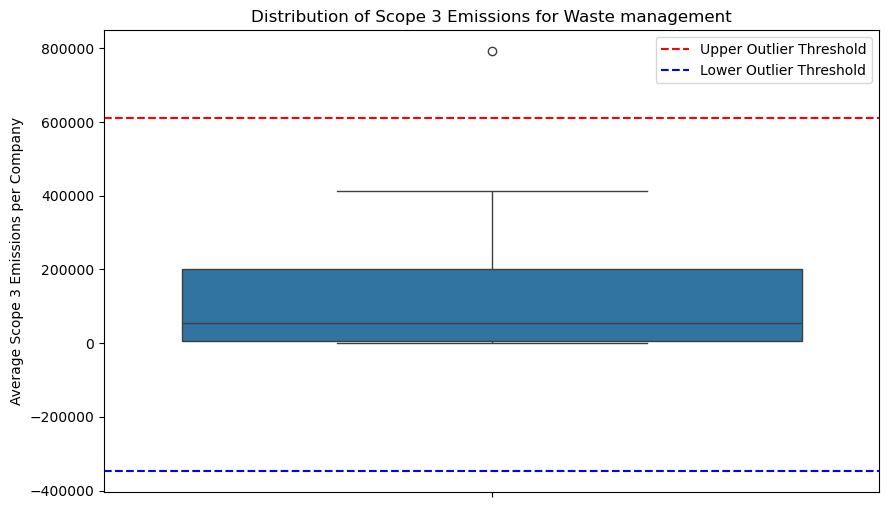

,account_name,Scope_3_emissions_amount
19,"Waste Management, Inc.",792361.602632


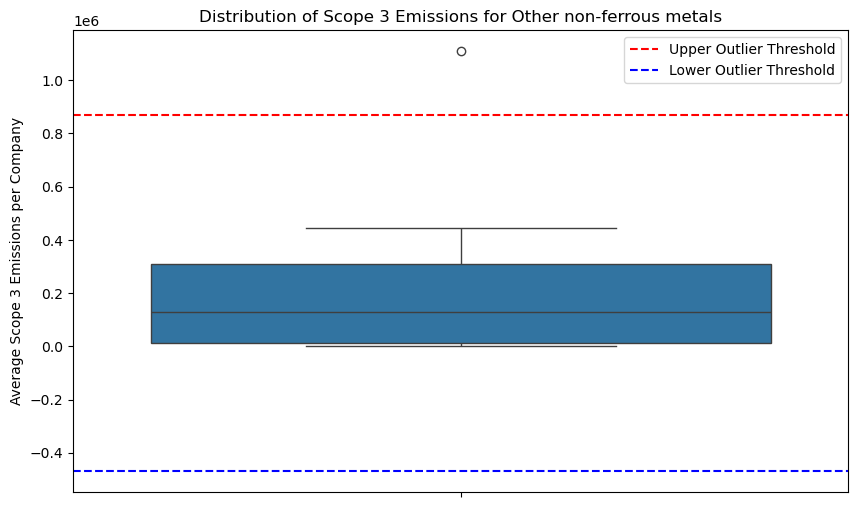

,account_name,Scope_3_emissions_amount
6,Eramet,1109112.137


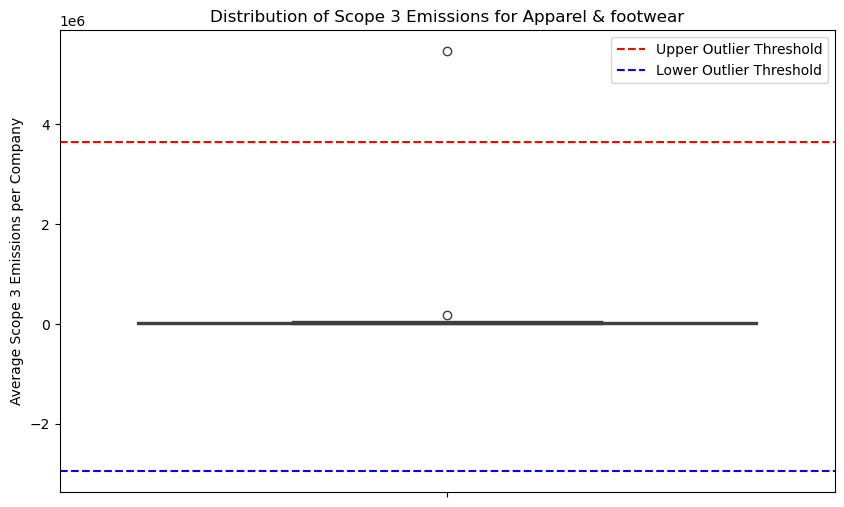

,account_name,Scope_3_emissions_amount
15,US Cotton,5.462052e+06


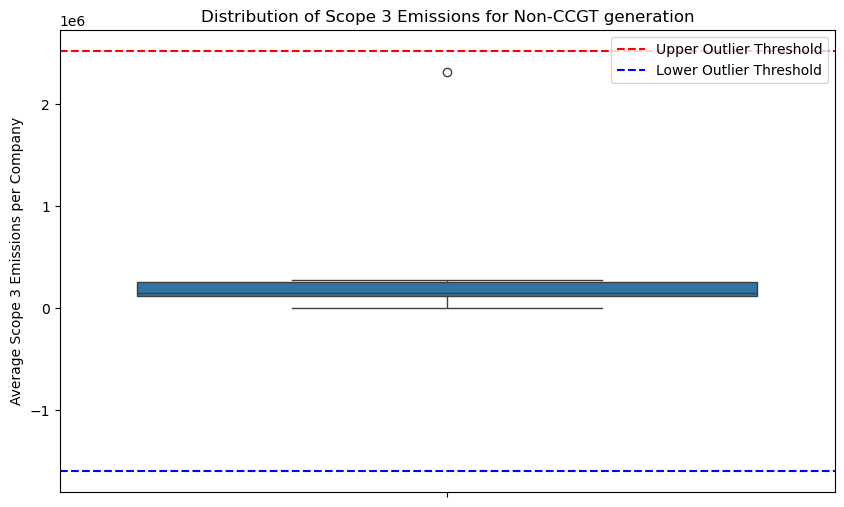

,account_name,Scope_3_emissions_amount


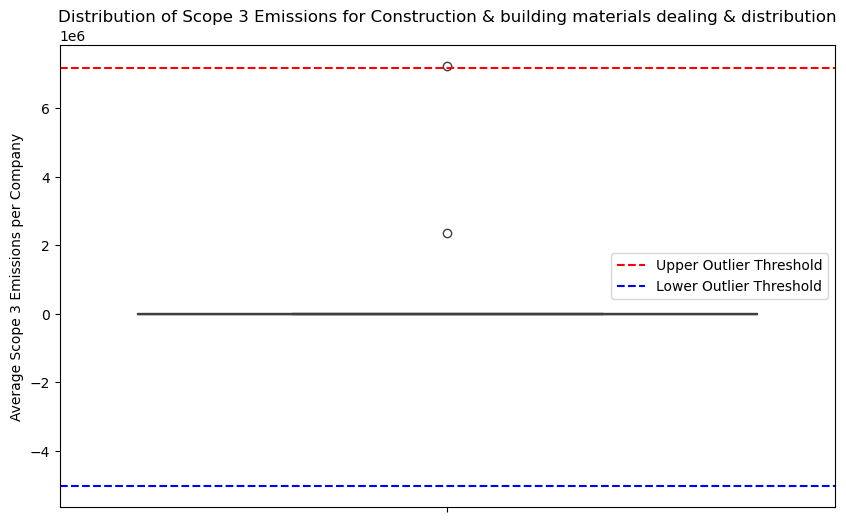

,account_name,Scope_3_emissions_amount
2,Lamett Europe NV,7228782.0


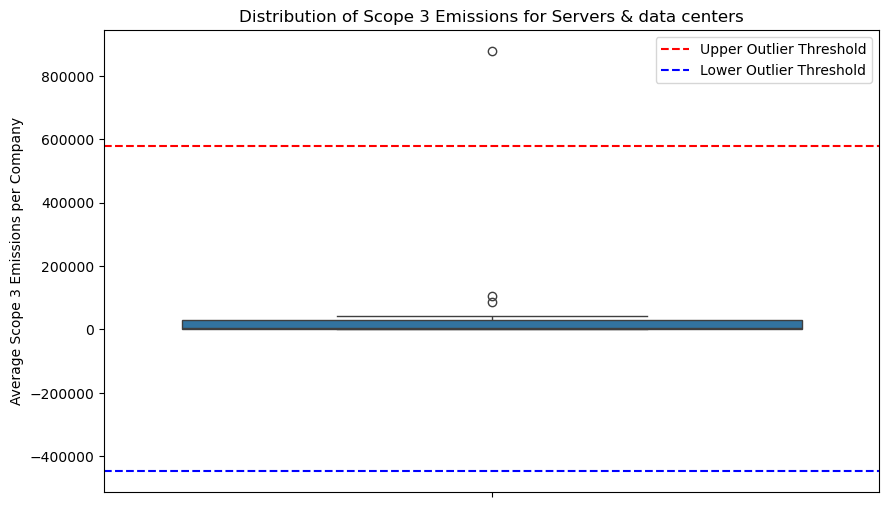

,account_name,Scope_3_emissions_amount
9,Hewlett Packard Enterprise Company,878181.9


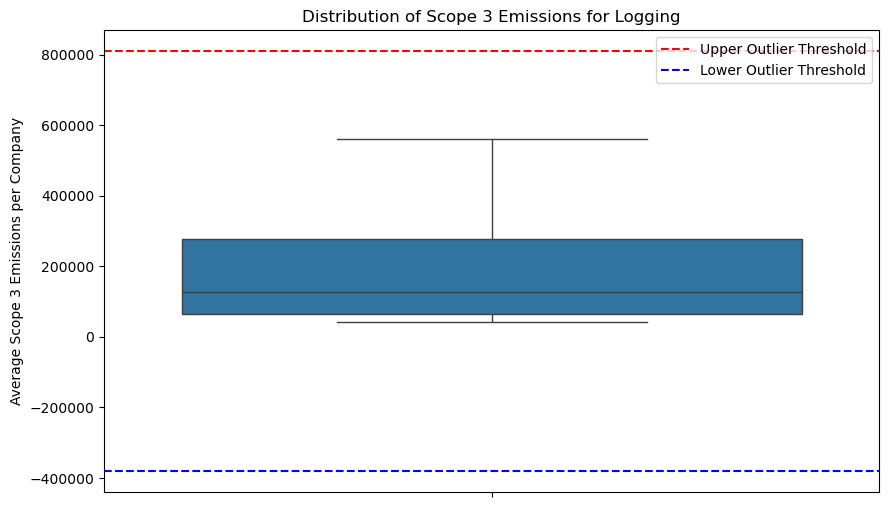

,account_name,Scope_3_emissions_amount


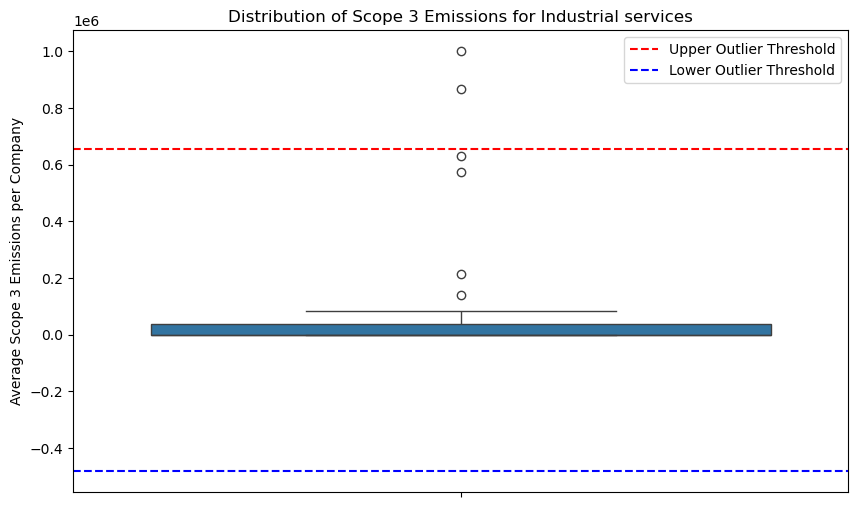

,account_name,Scope_3_emissions_amount
3,"ASE Technology Holding Co., Ltd.",866742.808824
35,Sabtech Oilfield Services Limited,1000000.000000


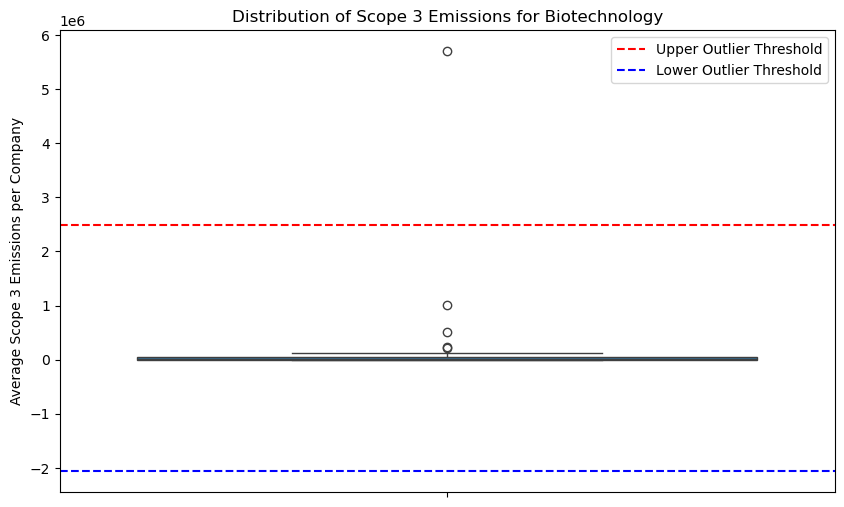

,account_name,Scope_3_emissions_amount
37,VIETHUNG PACKAGING CO LTD,5700000.0


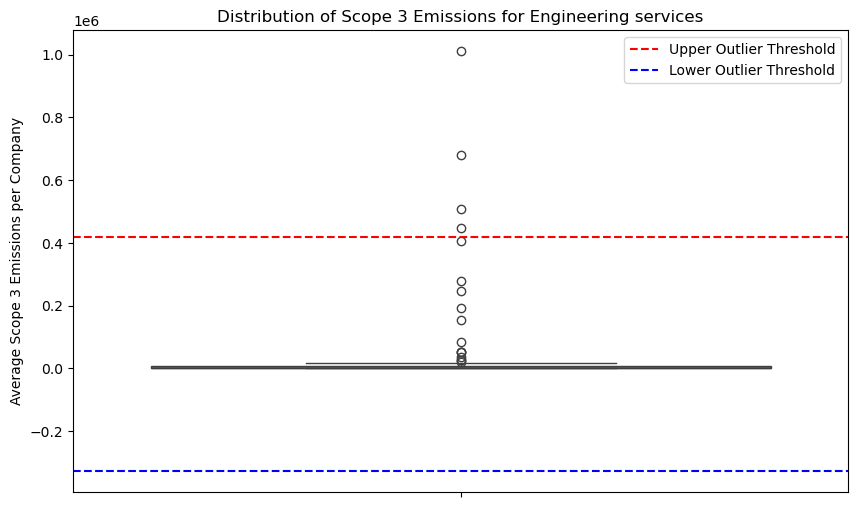

,account_name,Scope_3_emissions_amount
46,IDG ENGENHARIA E CONSULTORIA,5.067420e+05
70,"SANKI ENGINEERING CO.,LTD.",4.468552e+05
77,Sinanen Holdings Co Ltd,1.011409e+06
78,Spirax-Sarco Engineering,6.812292e+05


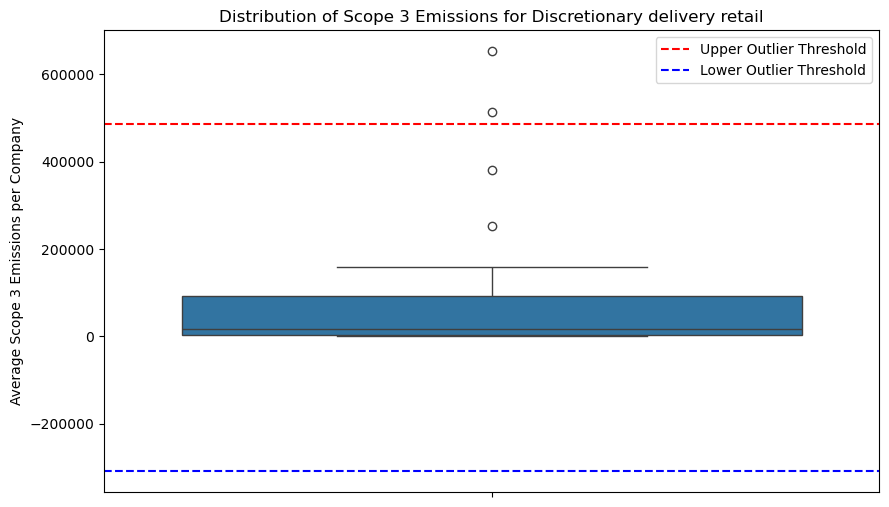

,account_name,Scope_3_emissions_amount
14,JD.com Inc,653454.575
20,"Qurate Retail, Inc.",513288.250


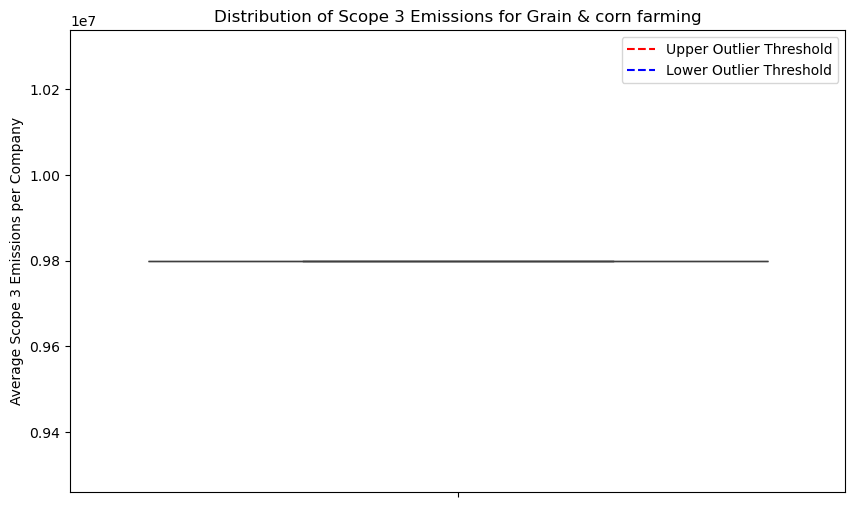

,account_name,Scope_3_emissions_amount


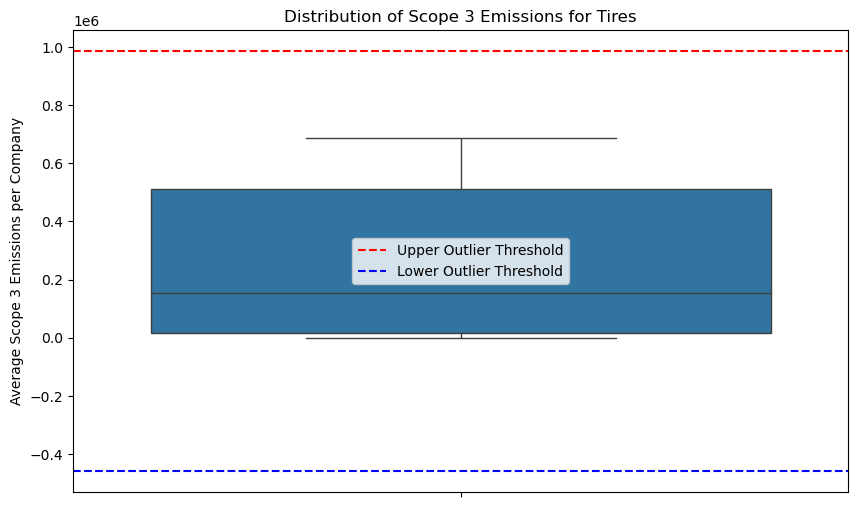

,account_name,Scope_3_emissions_amount


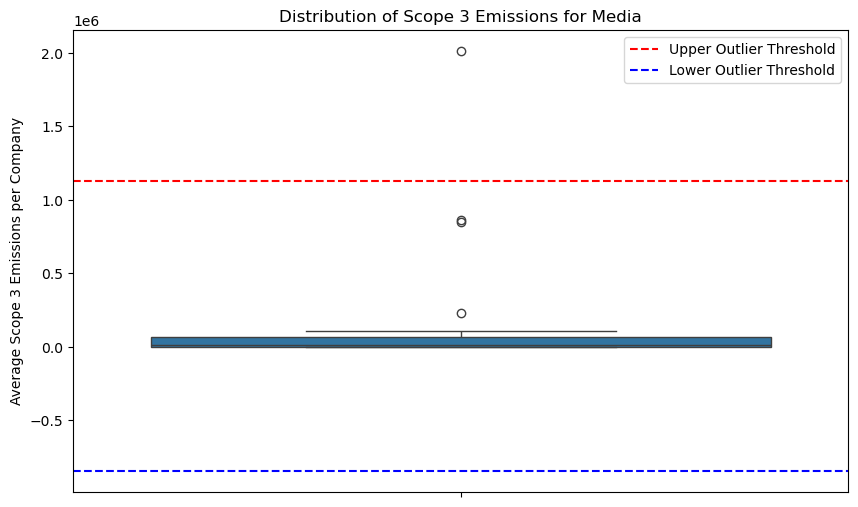

,account_name,Scope_3_emissions_amount
14,Meredith Corporation,2.011590e+06


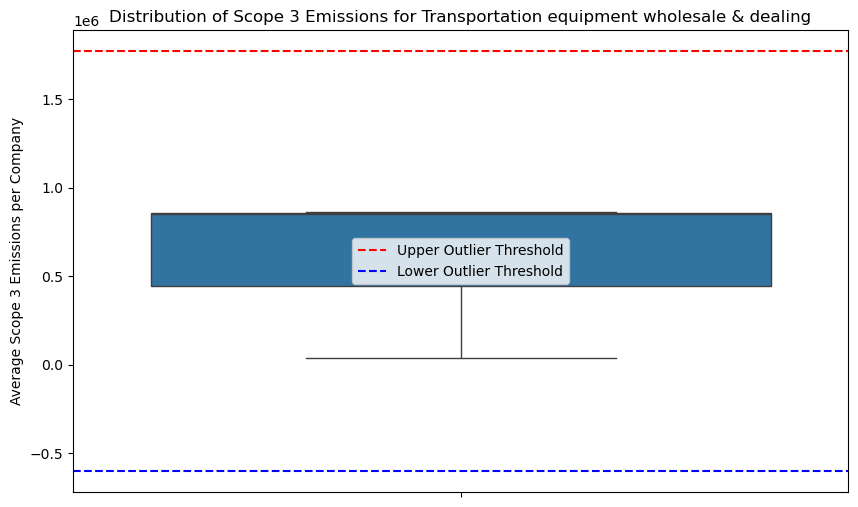

,account_name,Scope_3_emissions_amount


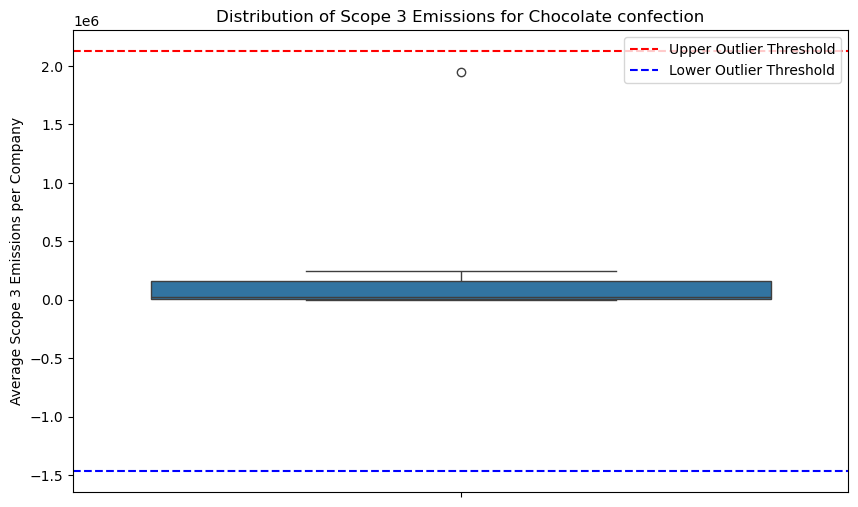

,account_name,Scope_3_emissions_amount


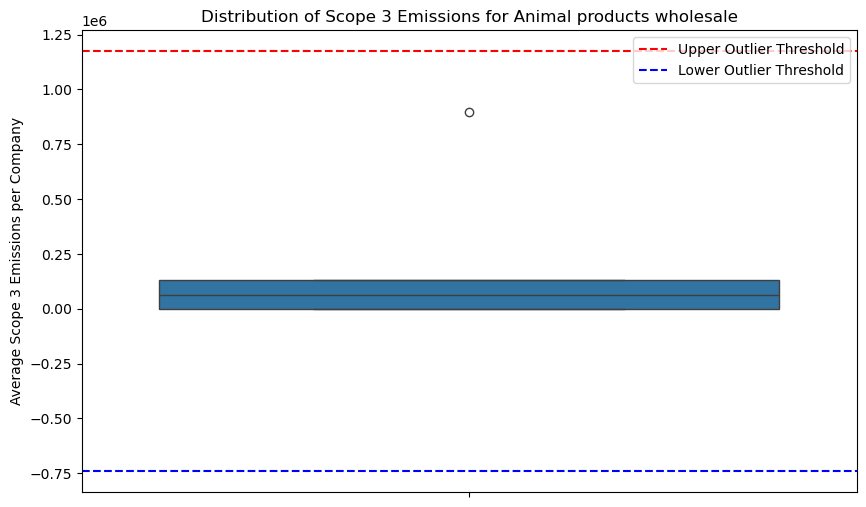

,account_name,Scope_3_emissions_amount


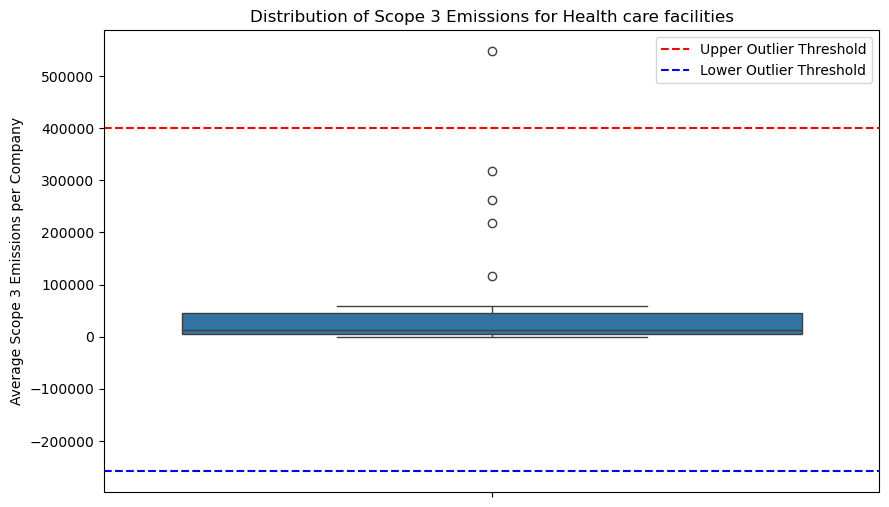

,account_name,Scope_3_emissions_amount
19,Quest Diagnostics Incorporated,547797.871304


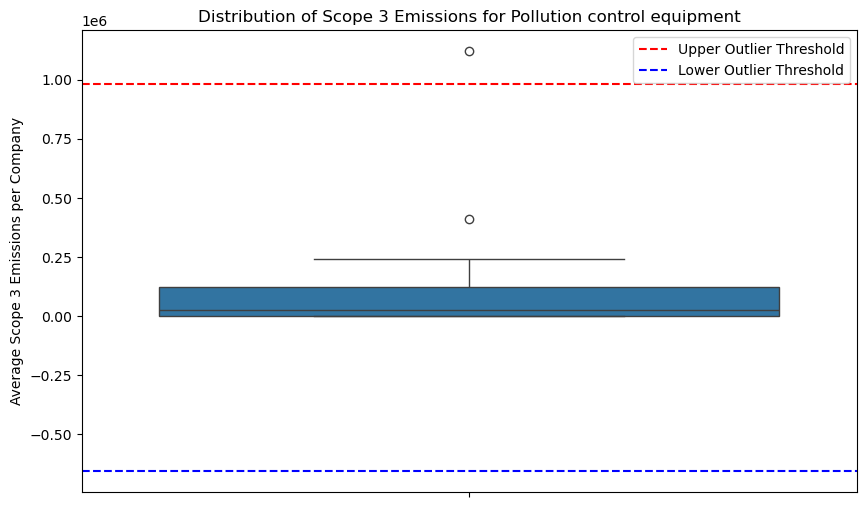

,account_name,Scope_3_emissions_amount
1,Fluidra,1119996.1


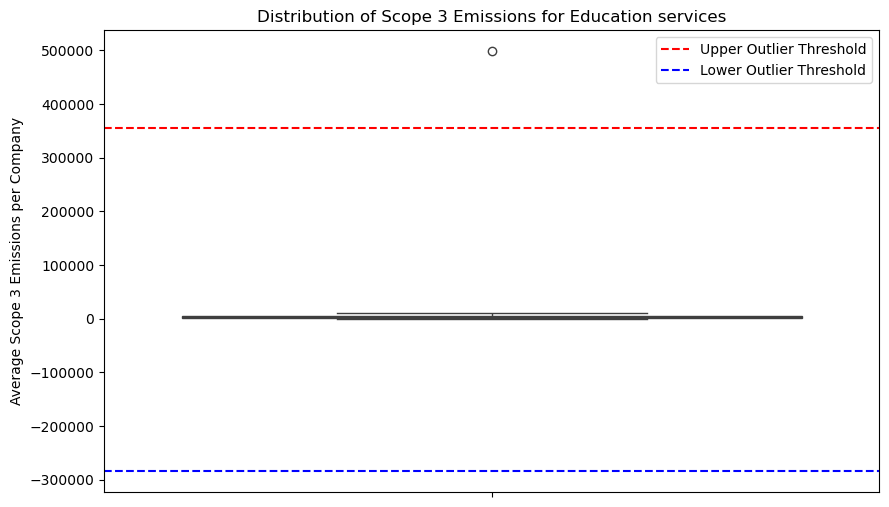

,account_name,Scope_3_emissions_amount
3,"Benesse Holdings, Inc.",498481.170707


In [33]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display

# Load the dataset
file_path = "Mega_merged_all_real_values.csv"  # Ensure the correct file path
df = pd.read_csv(file_path)

# Step 1: Compute total Scope 3 emissions per Primary Activity
total_emissions_per_activity = df.groupby('Primary activity')['Scope_3_emissions_amount'].sum().reset_index()

# Step 2: Sort activities by total emissions
total_emissions_per_activity = total_emissions_per_activity.sort_values(by='Scope_3_emissions_amount', ascending=False)

# Step 3: Split into three equal-sized groups (top third, middle third, bottom third)
num_activities = len(total_emissions_per_activity)
top_third_cutoff = num_activities // 3
middle_third_cutoff = 2 * (num_activities // 3)

middle_third = total_emissions_per_activity.iloc[top_third_cutoff:middle_third_cutoff]

# Select a batch size (change this number as needed)
batch_size = 71  # Adjust to display more/less at a time
middle_third_activities = middle_third['Primary activity'].tolist()[:batch_size]

# Function to plot batch of boxplots
def plot_middle_third_boxplots(df, activities):
    for activity in activities:
        subset = df[df['Primary activity'] == activity]

        # Ensure only one dot per company (average emissions per company)
        avg_emissions_per_company = subset.groupby('account_name')['Scope_3_emissions_amount'].mean().reset_index()

        # Compute mean and standard deviation for outlier detection
        activity_mean = avg_emissions_per_company['Scope_3_emissions_amount'].mean()
        activity_std = avg_emissions_per_company['Scope_3_emissions_amount'].std()

        upper_threshold = activity_mean + 2.5 * activity_std
        lower_threshold = activity_mean - 2.5 * activity_std

        # Identify outliers
        outliers = avg_emissions_per_company[
            (avg_emissions_per_company['Scope_3_emissions_amount'] > upper_threshold) |
            (avg_emissions_per_company['Scope_3_emissions_amount'] < lower_threshold)
        ]

        # Plot boxplot
        plt.figure(figsize=(10, 6))
        sns.boxplot(y=avg_emissions_per_company['Scope_3_emissions_amount'])
        plt.axhline(upper_threshold, color='r', linestyle='--', label='Upper Outlier Threshold')
        plt.axhline(lower_threshold, color='b', linestyle='--', label='Lower Outlier Threshold')
        plt.title(f'Distribution of Scope 3 Emissions for {activity}')
        plt.ylabel('Average Scope 3 Emissions per Company')
        plt.legend()
        plt.show()

        # Display the outliers in Jupyter Notebook
        outliers_display = outliers[['account_name', 'Scope_3_emissions_amount']]
        display(outliers_display)

# Generate boxplots for the first batch of the Middle Third activities
plot_middle_third_boxplots(df, middle_third_activities)

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display

# Load the dataset
file_path = "Mega_merged_all_real_values.csv"  # Ensure the correct file path
df = pd.read_csv(file_path)

# Step 1: Compute total Scope 3 emissions per Primary Activity
total_emissions_per_activity = df.groupby('Primary activity')['Scope_3_emissions_amount'].sum().reset_index()

# Step 2: Sort activities by total emissions
total_emissions_per_activity = total_emissions_per_activity.sort_values(by='Scope_3_emissions_amount', ascending=False)

# Step 3: Split into three equal-sized groups (top third, middle third, bottom third)
num_activities = len(total_emissions_per_activity)
top_third_cutoff = num_activities // 3
middle_third_cutoff = 2 * (num_activities // 3)

bottom_third = total_emissions_per_activity.iloc[middle_third_cutoff:]

# Select a batch size (change this number as needed)
batch_size = 71  # Adjust to display more/less at a time
bottom_third_activities = bottom_third['Primary activity'].tolist()[:batch_size]

# Function to plot batch of boxplots
def plot_bottom_third_boxplots(df, activities):
    for activity in activities:
        subset = df[df['Primary activity'] == activity]

        # Ensure only one dot per company (average emissions per company)
        avg_emissions_per_company = subset.groupby('account_name')['Scope_3_emissions_amount'].mean().reset_index()

        # Compute mean and standard deviation for outlier detection
        activity_mean = avg_emissions_per_company['Scope_3_emissions_amount'].mean()
        activity_std = avg_emissions_per_company['Scope_3_emissions_amount'].std()

        upper_threshold = activity_mean + 2.5 * activity_std
        lower_threshold = activity_mean - 2.5 * activity_std

        # Identify outliers
        outliers = avg_emissions_per_company[
            (avg_emissions_per_company['Scope_3_emissions_amount'] > upper_threshold) |
            (avg_emissions_per_company['Scope_3_emissions_amount'] < lower_threshold)
        ]

        # Plot boxplot
        plt.figure(figsize=(10, 6))
        sns.boxplot(y=avg_emissions_per_company['Scope_3_emissions_amount'])
        plt.axhline(upper_threshold, color='r', linestyle='--', label='Upper Outlier Threshold')
        plt.axhline(lower_threshold, color='b', linestyle='--', label='Lower Outlier Threshold')
        plt.title(f'Distribution of Scope 3 Emissions for {activity}')
        plt.ylabel('Average Scope 3 Emissions per Company')
        plt.legend()
        plt.show()

        # Display the outliers in Jupyter Notebook
        outliers_display = outliers[['account_name', 'Scope_3_emissions_amount']]
        display(outliers_display)

# Generate boxplots for the first batch of the Bottom Third activities
plot_bottom_third_boxplots(df, bottom_third_activities)

TypeError: 

### It returned exactly what I wanted but after realizing that this was not the right method, me and professor Kellen decided to use the z-score of 2.5, keeping more than 99% of our data, and looking at the emissions by primary activities and the years (the plot we liked a lot earlier in this process) would be a successful way of removing outliers. This would help our models accuracy in predicting emission numbers!



In [3]:
df["Primary activity"].nunique()

The history saving thread hit an unexpected error (OperationalError('attempt to write a readonly database')).History will not be written to the database.


NameError: name 'df' is not defined